<a href="https://colab.research.google.com/github/nordMSS/SZFO/blob/main/Cifrovoy_proryv_bpla_inference_large_model_best.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import and check

In [ ]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import PIL
from PIL import Image

import torch
import torchvision.ops.boxes as bops

import time

import cv2
from patched_yolo_infer import (visualize_results_usual_yolo_inference)

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
!nvidia-smi
torch.cuda.is_available()

Sun Oct 13 00:39:38 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 556.13                 Driver Version: 556.13         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650 Ti   WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   70C    P0             42W /   50W |    3879MiB /   4096MiB |     93%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

True

In [ ]:
#настроим random_seed всего
seed_num = 13
torch.manual_seed(seed_num)
torch.cuda.manual_seed(seed_num)
torch.cuda.manual_seed_all(seed_num)
torch.use_deterministic_algorithms(True) # do not work in collab
np.random.seed(seed_num)

import torch.backends.cudnn
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True # do not work in collab

### Paths

In [ ]:
abs_path = os.getcwd()
project_path = r'F:\DS\Хахатон_10.2024'
project_path

'F:\\DS\\Хахатон_10.2024'

In [ ]:
# val path
val_list = os.listdir(os.path.join(project_path, 'large_dataset', 'val', 'images'))

plane_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'images')
heli_img_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'images')

plane_img_listdir = os.listdir(plane_img_path)
heli_img_listdir = os.listdir(heli_img_path)

plane_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '0-plane', 'labels')
heli_label_path = os.path.join(project_path, 'Dataset', 'Dataset_photo', '1-helicopter', 'labels')

plane_label_listdir = os.listdir(plane_label_path)
heli_label_listdir = os.listdir(heli_label_path)

In [ ]:
# test dataset
import pyzipper

zip_file_path = os.path.join(project_path, 'test_dataset_mpt_test.zip')
password = b'efsdkjasnandom320930padma'

def decrypt(zip_file_path, password):
    with pyzipper.AESZipFile(zip_file_path, 'r', compression=pyzipper.ZIP_LZMA, encryption=pyzipper.WZ_AES) \
            as extracted_zip:
        try:
            extracted_zip.extractall(pwd = password)
        except RuntimeError as ex:
            print(ex)


decrypt(zip_file_path, password)

### Detection

In [ ]:
# detection model
from ultralytics import YOLO
#detector = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train16', 'weights', 'best.pt')) # middle model
detector = YOLO(os.path.join(os.curdir, 'runs', 'detect', 'train18', 'weights', 'best.pt')) # large model

### Inference

In [ ]:
# check time for single image

# start time
start_time = time.time()

res = detector.predict(source = os.path.join(heli_img_path, '27042021_¡¿¿» óÑαΓ«½ÑΓ@ds-0507.jpg'),
                       show = False,
                       imgsz = 640,
                       show_boxes = False,
                       show_labels = False,
                       save = False,
                       name = "YOLO10_res",
                       conf = 0.3,
                       max_det = 2)

# final time
end_time = time.time()

# start time minus final time
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0507.jpg: 512x640 1 class_0, 47.5ms
Speed: 0.0ms preprocess, 47.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Elapsed time:  0.08983683586120605


In [ ]:
# get bboxes from the model

def yolo_fast_inference(path, image_name, conf, max_det):
    res = detector.predict(source = os.path.join(path, image_name),
                        show = False,
                        imgsz = 640,
                        show_boxes = False,
                        show_labels = False,
                        save = False,
                        #name = "YOLO10_res",
                        conf = conf,
                        max_det = max_det)

    result = res[0]
    if len(res[0].boxes) > 0: #### add several bboxes!!!!!??
        box = result.boxes[0]
        # bboxes
        coords_xyxy = box.xyxy[0].tolist() # bbox_xyxy (upper-left, upper-left, bottom-right, bottom-right)
        coords_xywhn = box.xywhn[0].tolist() # bbox_xywhn (upper-left, upper-left, width, height: normalized)
        # tensor for metric
        pred_tensor = torch.tensor([coords_xyxy], dtype=torch.float) # for metric
    else:
        coords_xyxy = [0, 0, 0, 0] # bbox_xyxy
        coords_xywhn = [0, 0, 0, 0] # bbox_xywhn
        pred_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float) # for metric

    return pred_tensor, coords_xyxy, coords_xywhn

In [ ]:
# get bboxes from label

def label_recalc(label_list, label_path, label_name):
    if label_name in label_list:
        with open(os.path.join(label_path, label_name), 'r') as file:
            res_test = file.read()
            res_test_list = [float(x) for x in res_test.split(' ')]

            # coordinates xyxy
            x_min = res_test_list[1]*img_w - 0.5*(res_test_list[3]*img_w) # center_x to upper_left_x
            y_min = res_test_list[2]*img_h - 0.5*(res_test_list[4]*img_h) # center_x to upper_left_y
            x_max = x_min + res_test_list[3]*img_w # width to bottom-right
            y_max = y_min + res_test_list[4]*img_h # height to bottom-right

            # coordinates xywhn
            x_min_norm = res_test_list[1] - 0.5*(res_test_list[3]) # center_x to upper_left_x
            y_min_norm = res_test_list[2] - 0.5*(res_test_list[4]) # center_x to upper_left_y
            width_norm = res_test_list[3] # width
            height_norm = res_test_list[4] # height

            test_tensor = torch.tensor([[x_min, y_min, x_max, y_max]], dtype=torch.float) # for metric
            coords_xyxy_label = [x_min, y_min, x_max, y_max] # bbox_xyxy (upper-left, upper-left, bottom-right, bottom-right)
            coords_xywhn_label = [x_min_norm, y_min_norm, width_norm, height_norm] # bbox_xywhn (upper-left, upper-left, width, height: normalized)
    else:
        coords_xyxy_label = [0, 0, 0, 0] # bbox_xyxy
        coords_xywhn_label = [0, 0, 0, 0] # bbox_xywhn
        test_tensor = torch.tensor([[0, 0, 0, 0]], dtype=torch.float) # for metric

    return test_tensor, coords_xyxy_label, coords_xywhn_label

In [ ]:
# check total time on large_val

# start time
start_time = time.time()
print('Starting...')

name_list = []
coord_list_xywhn_inference = []
coord_list_xyxy_inference = []
coord_list_xyxy_label = []
iou_list = []

conf = 0.3
max_det = 1

for i in range(len(val_list)):
    name_base = val_list[i][:-4:]
    image_name = val_list[i]
    label_name = name_base + '.txt'

    # save name for res_table
    name_list.append(val_list[i])

    if val_list[i] in plane_img_listdir:
        img_path = plane_img_path
        label_path = plane_label_path
        label_list = plane_label_listdir
    else:
        img_path = heli_img_path
        label_path = heli_label_path
        label_list = heli_label_listdir

    # get inference coords
    pred_tensor, coords_xyxy, coords_xywhn = yolo_fast_inference(img_path, image_name, conf, max_det)

    # save coords for res_table
    coord_list_xywhn_inference.append(coords_xywhn)
    coord_list_xyxy_inference.append(coords_xyxy)

    # get label
    test_tensor, coords_xyxy_label, coords_xywhn_label = label_recalc(label_list, label_path, label_name)

    # save coords_label for res_table
    coord_list_xyxy_label.append(coords_xyxy_label)

    # metric
    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())

# finish time
end_time = time.time()

# start time minus final time
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)

Starting...

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor-inv.jpg: 512x640 1 class_0, 62.9ms
Speed: 0.0ms preprocess, 62.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor.jpg: 512x640 1 class_0, 15.4ms
Speed: 1.0ms preprocess, 15.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-inv.jpg: 512x640 1 class_0, 26.2ms
Speed: 1.0ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023.jpg: 512x640 1 class_0, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0035-aughor-inv.jpg: 512x640 1 cla

Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 16.3ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor-inv.jpg: 512x640 1 class_0, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor.jpg: 512x640 1 class_0, 32.8ms
Speed: 0.0ms preprocess, 32.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor-inv.jpg: 512x640 1 class_0, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor.jpg: 512x640 1 class_0, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-inv.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035.jpg: 512x640 1 class_0, 24.3ms
Speed: 2.0ms preprocess, 24.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 1.0ms preprocess, 5.2ms inference, 9.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123.jpg: 512x640 1 class_0, 9.9ms
Speed: 0.0ms preprocess, 9.9ms inference, 12.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 0.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor.jpg: 512x640 1 class_0, 18.1ms
Speed: 2.0ms preprocess, 18.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 1.0ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 1.4ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor.jpg: 512x640 1 class_0, 21.7ms
Speed: 13.6ms preprocess, 21.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 2.4ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224.jpg: 512x640 1 class_0, 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 12.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor.jpg: 512x640 1 class_0, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 1.5ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor.jpg: 512x640 1 class_0, 14.8ms
Speed: 2.5ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-inv.jpg: 512x640 1 class_0, 20.6ms
Speed: 15.0ms preprocess, 20.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779.jpg: 512x640 1 class_0, 16.8ms
Speed: 1.0ms preprocess, 16.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942-inv.jpg: 512x640 1 class_0, 14.8ms
Speed: 0.0ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor-inv.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 30.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 19.5ms
Speed: 0.0ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245.jpg: 512x640 1 class_0, 22.2ms
Speed: 0.0ms preprocess, 22.2ms inference, 11.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor-inv.jpg: 512x640 1 class_0, 21.9ms
Speed: 0.0ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 1.0ms preprocess, 19.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor-inv.jpg: 512x640 1 class_0, 8.6ms
Speed: 1.0ms preprocess, 8.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-inv.jpg: 512x640 1 class_0, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162.jpg: 512x640 1 class_0, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-aughor.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-inv.jpg: 512x640 1 class_0, 12.2ms
Speed: 0.0ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435.jpg: 512x640 1 class_0, 0.8ms
Speed: 1.0ms preprocess, 0.8ms inference, 14.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor-inv.jpg: 512x640 1 class_0, 11.9ms
Speed: 0.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor.jpg: 512x640 1 class_0, 13.8ms
Speed: 0.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1040.jpg: 512x640 1 class_0, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 9.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 0.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor.jpg: 512x640 1 class_0, 3.2ms
Speed: 14.2ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-inv.jpg: 512x640 1 class_0, 20.5ms
Speed: 0.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.4ms prepr


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-aughor.jpg: 512x640 1 class_0, 10.1ms
Speed: 0.0ms preprocess, 10.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-inv.jpg: 512x640 1 class_0, 24.9ms
Speed: 0.0ms preprocess, 24.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534.jpg: 512x640 1 class_0, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 5.2ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor.jpg: 512x640 1 class_0, 22.7ms
Speed: 0


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1785.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.1ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor.jpg: 512x640 1 class_0, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-inv.jpg: 512x640 1 class_0, 34.0ms
Speed: 0.0ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810.jpg: 512x640 1 class_0, 15.2ms
Speed: 2.0ms pr


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-aughor.jpg: 512x640 1 class_0, 27.4ms
Speed: 0.0ms preprocess, 27.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-inv.jpg: 512x640 1 class_0, 9.7ms
Speed: 0.0ms preprocess, 9.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006.jpg: 512x640 1 class_0, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor-inv.jpg: 512x640 1 class_0, 17.6ms
Speed: 9.9ms preprocess, 17.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor.jpg: 512x640 1 class_0, 4.2ms
S

Speed: 2.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0094.jpg: 512x640 1 class_0, 7.5ms
Speed: 2.0ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor-inv.jpg: 512x640 1 class_0, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor.jpg: 512x640 1 class_0, 1.8ms
Speed: 2.0ms preprocess, 1.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-inv.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor-inv.jpg: 512x640 1 class_0, 27.8ms
Speed: 0.0ms preprocess, 27.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor.jpg: 512x640 1 class_0, 10.7ms
Speed: 0.0ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194.jpg: 512x640 1 class_0, 4.3ms
Speed: 12.2ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0210-aughor-inv.jpg: 512x640 1 class_0, 15

Speed: 0.0ms preprocess, 21.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286.jpg: 512x640 1 class_0, 18.3ms
Speed: 0.0ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0390.jpg: 512x640 1 class_0, 5.4ms
Speed: 3.1ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.1ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398.jpg: 512x640 1 class_0, 11.0ms
Speed: 

Speed: 0.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 1.0ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-inv.jpg: 512x640 1 class_0, 24.4ms
Speed: 4.4ms preprocess, 24.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146.jpg: 512x640 1 class_0, 0.8ms
Speed: 1.0ms preprocess, 0.8ms inference, 12.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0169-aughor-inv.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310-inv.jpg: 512x640 1 class_0, 13.1ms
Speed: 1.7ms preprocess, 13.1ms inference, 11.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310.jpg: 512x640 1 class_0, 29.4ms
Speed: 0.0ms preprocess, 29.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor-inv.jpg: 512x640 1 class_0, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 13.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor.jpg: 512x640 1 class_0, 14.1ms
Speed: 0.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-inv.jpg: 512x640 1 class_0, 12.3ms
S

Speed: 0.0ms preprocess, 16.1ms inference, 12.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor-inv.jpg: 512x640 1 class_0, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-inv.jpg: 512x640 1 class_0, 9.6ms
Speed: 1.0ms preprocess, 9.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435.jpg: 512x640 1 class_0, 13.6ms
Speed: 0.9ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-aughor.jpg: 512x640 1 class_0, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-inv.jpg: 512x640 1 class_0, 22.8ms
Speed: 0.0ms preprocess, 22.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640.jpg: 512x640 1 class_0, 14.1ms
Speed: 1.0ms preprocess, 14.1ms inference, 0.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor-inv.jpg: 512x640 1 class_0, 7.7ms
Speed: 11.4ms preprocess, 7.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor.jpg: 512x640 1 class_0, 12.5ms

Speed: 0.0ms preprocess, 26.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0876.jpg: 512x640 1 class_0, 11.2ms
Speed: 1.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor-inv.jpg: 512x640 1 class_0, 14.3ms
Speed: 0.0ms preprocess, 14.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor.jpg: 512x640 1 class_0, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-inv.jpg: 512x640 1 class_0, 10.5ms
Speed: 1.0ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor.jpg: 512x640 1 class_0, 3.7ms
Speed: 1.0ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129.jpg: 512x640 1 class_0, 11.5ms
Speed: 0.0ms preprocess, 11.5ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0164-aughor-inv.jpg: 512x640 1 class_0, 16.

Speed: 1.0ms preprocess, 14.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481-inv.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor-inv.jpg: 512x640 1 class_0, 20.5ms
Speed: 1.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.0ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0743.jpg: 512x640 1 class_0, 20.7ms
Speed: 1.0ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor-inv.jpg: 512x640 (no detections), 20.0ms
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor.jpg: 512x640 (no detections), 2.7ms
Speed: 1.0ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.5ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782.jpg: 512x640 1 class_0, 11

Speed: 15.9ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-aughor.jpg: 512x640 (no detections), 13.5ms
Speed: 1.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1296-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554-inv.jpg: 512x640 1 class_0, 14.8ms
Speed: 0.6ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554.jpg: 512x640 1 class_0, 33.0ms
Speed: 0.0ms preprocess, 33.0ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor-inv.jpg: 512x640 1 class_0, 18.0ms
Speed: 0.0ms preprocess, 18.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-inv.jpg: 512x640 1 class_0, 16.0ms
S

Speed: 1.0ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor-inv.jpg: 512x640 1 class_0, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor.jpg: 512x640 1 class_0, 13.6ms
Speed: 0.0ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 1.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841.jpg: 512x640 1 class_0, 17.8ms
Speed: 1.0ms preprocess, 17.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-aughor.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-inv.jpg: 512x640 1 class_0, 28.2ms
Speed: 0.0ms preprocess, 28.2ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor.jpg: 512x640 1 class_0, 17.2m

Speed: 2.0ms preprocess, 13.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1222.jpg: 512x640 1 class_0, 13.8ms
Speed: 1.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor-inv.jpg: 512x640 1 class_0, 13.5ms
Speed: 0.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-inv.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor-inv.jpg: 512x640 (no detections), 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor.jpg: 512x640 (no detections), 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-inv.jpg: 512x640 (no detections), 8.0ms
Speed: 0.0ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1572-aughor-inv.jpg

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-aughor.jpg: 512x640 1 class_0, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-inv.jpg: 512x640 1 class_0, 19.9ms
Speed: 1.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775.jpg: 512x640 1 class_0, 13.0ms
Speed: 0.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor-inv.jpg: 512x640 (no detections), 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor.jpg: 512x640 (no detecti

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2084.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.5ms preprocess, 14.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor.jpg: 512x640 1 class_0, 20.5ms
Speed: 1.0ms preprocess, 20.5ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 2.0ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129.jpg: 512x640 1 class_0, 18.7ms
Speed: 9.9ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0160-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor-inv.jpg: 512x640 1 class_0, 12.0ms
Speed: 0.0ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0648.jpg: 512x640 (no detections), 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor-inv.jpg: 512x640 (no detections), 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-inv.jpg: 512x640 (no detections), 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669.jpg: 512x640 (n

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-inv.jpg: 512x640 1 class_0, 25.2ms
Speed: 0.0ms preprocess, 25.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0962-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248-inv.jpg: 512x640 (no detections), 13.9ms
Speed: 1.8ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248.jpg: 512x640 (no detections), 13.7ms
Speed: 1.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 1.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor.jpg: 512x640 1 class_0, 24.2ms
Speed: 2.5ms preprocess, 24.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-inv.jpg: 512x640 (no det

Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor-inv.jpg: 512x640 1 class_0, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 2.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331.jpg: 512x640 1 class_0, 3.0ms
Speed: 13.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor.jpg: 512x640 1 class_0, 15.6ms

Speed: 0.0ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0467.jpg: 512x640 1 class_0, 14.1ms
Speed: 1.7ms preprocess, 14.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor.jpg: 512x640 1 class_0, 14.1ms
Speed: 2.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor-inv.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 15.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor.jpg: 512x640 1 class_0, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0644-aughor-inv.jpg: 512x640 1 class_0, 

Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053-inv.jpg: 512x640 1 class_0, 5.8ms
Speed: 0.0ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor-inv.jpg: 512x640 1 class_0, 21.7ms
Speed: 0.0ms preprocess, 21.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-inv.jpg: 512x640 1 class_0, 14.3ms
Speed: 1.4ms preprocess, 14.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536.jpg: 512x640 1 class_0, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datase

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor.jpg: 512x640 1 class_0, 14.1ms
Speed: 9.5ms preprocess, 14.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-inv.jpg: 512x640 1 class_0, 3.1ms
Speed: 1.0ms preprocess, 3.1ms inference, 11.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222.jpg: 512x640 1 class_0, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562.jpg: 512x640 1 class_0, 1.0ms
Speed: 15.5ms preprocess, 1.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1574-aughor-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1574-aughor.jpg: 512x640 1 class_0, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 1.4ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor-inv.jpg: 512x640 1 class_0, 18.5ms
Speed: 0.0ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-inv.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-aughor.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-inv.jpg: 512x640 1 class_0, 24.0ms
Speed: 0.0ms preprocess, 24.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282.jpg: 512x640 1 class_0, 25.4ms
Speed: 2.0ms preprocess, 25.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0301-aughor-inv.jpg: 512x640 1 class_0, 19.1ms
Speed: 1.5ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0301-aughor.jpg: 512x640 1 class_0, 18.9m

Speed: 1.0ms preprocess, 15.5ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0678.jpg: 512x640 1 class_0, 19.0ms
Speed: 2.0ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 2.7ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor.jpg: 512x640 1 class_0, 16.2ms
Speed: 1.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-inv.jpg: 512x640 1 class_0, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 5.2ms
Speed: 2.5ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 1.5ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1125-aughor-inv.jpg: 512x640 1 class_0, 16.

Speed: 1.0ms preprocess, 24.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1709-aughor-inv.jpg: 512x640 1 class_0, 27.6ms
Speed: 0.0ms preprocess, 27.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1709-aughor.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1930.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor.jpg: 512x640 1 class_0, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-inv.jpg: 512x640 1 class_0, 27.3ms
Speed: 0.0ms preprocess, 27.3ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940.jpg: 512x640 1 class_0, 13.1ms
Speed

Speed: 1.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-aughor.jpg: 512x640 1 class_0, 30.6ms
Speed: 0.0ms preprocess, 30.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0043-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119.jpg: 512x640 1 class_0, 22.7ms
Speed: 0.0ms preprocess, 22.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor-inv.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor.jpg: 512x640 1 class_0, 8.5ms
Speed: 1.0ms preprocess, 8.5ms inference, 6.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-inv.jpg: 512x640 1 class_0, 12.3ms
Spe

Speed: 1.0ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor-inv.jpg: 512x640 1 class_0, 19.1ms
Speed: 10.7ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor.jpg: 512x640 1 class_0, 2.0ms
Speed: 10.9ms preprocess, 2.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-inv.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.7ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-aughor.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-inv.jpg: 512x640 1 class_0, 11.7ms
Speed: 0.0ms preprocess, 11.7ms inference, 13.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282.jpg: 512x640 1 class_0, 31.0ms
Speed: 0.0ms preprocess, 31.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0283-aughor-inv.jpg: 512x640 1 class_0, 0.7ms
Speed: 2.0ms preprocess, 0.7ms inference, 13.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0283-aughor.jpg: 512x640 1 class_0, 28.6m

Speed: 0.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0162.jpg: 512x640 1 class_0, 9.9ms
Speed: 0.0ms preprocess, 9.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor-inv.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor.jpg: 512x640 1 class_0, 20.3ms
Speed: 10.4ms preprocess, 20.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-inv.jpg: 512x640 1 class_0, 2.6ms
Speed: 5.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datase

Speed: 1.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-aughor.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-inv.jpg: 512x640 1 class_0, 2.0ms
Speed: 1.0ms preprocess, 2.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0345-aughor-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 2.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor-inv.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-inv.jpg: 512x640 1 class_0, 13.3ms
Speed: 


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor-inv.jpg: 512x640 1 class_0, 30.9ms
Speed: 0.8ms preprocess, 30.9ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor.jpg: 512x640 1 class_0, 23.8ms
Speed: 0.0ms preprocess, 23.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-inv.jpg: 512x640 1 class_0, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0793-aughor-inv.jpg: 512x640 1 class_0, 19.1ms

Speed: 0.0ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1123-aughor-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1123-aughor.jpg: 512x640 1 class_0, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0097.jpg: 512x640 1 class_0, 1.3ms
Speed: 8.5ms preprocess, 1.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor-inv.jpg: 512x640 1 class_0, 20.3ms
Speed: 0.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-inv.jpg: 512x640 1 class_0, 29.1ms
Speed: 0.0ms preprocess, 29.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167.jpg: 512x640 1 class_0,


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor-inv.jpg: 512x640 1 class_0, 25.2ms
Speed: 0.0ms preprocess, 25.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0291-aughor-inv.jpg: 512x6


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-aughor.jpg: 512x640 1 class_0, 10.3ms
Speed: 0.0ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-inv.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465.jpg: 512x640 1 class_0, 32.7ms
Speed: 0.0ms preprocess, 32.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0490-aughor-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0490-aughor.jpg: 512x640 1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632-inv.jpg: 512x640 1 class_0, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632.jpg: 512x640 1 class_0, 26.7ms
Speed: 0.0ms preprocess, 26.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-inv.jpg: 512x640 1 cl


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0764.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 23.6ms
Speed: 0.0ms preprocess, 23.6ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor.jpg: 512x640 1 class_0, 22.4ms
Speed: 0.0ms preprocess, 22.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-inv.jpg: 512x640 1 class_0, 12.0ms
Speed: 0.0ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773.jpg: 512x640 1 class_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor-inv.jpg: 512x640 1 class_0, 10.8ms
Speed: 0.5ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0155-aughor-inv.jpg: 512x640 1 class

Speed: 6.5ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357-inv.jpg: 512x640 1 class_0, 11.3ms
Speed: 0.0ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor-inv.jpg: 512x640 1 class_0, 4.1ms
Speed: 2.2ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.20


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0621.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 13.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor-inv.jpg: 512x640 1 class_0, 36.6ms
Speed: 0.0ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor.jpg: 512x640 1 class_0, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623.jpg: 512x640 1 class_0, 16.3ms

Speed: 0.0ms preprocess, 23.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-aughor.jpg: 512x640 1 class_0, 18.9ms
Speed: 1.0ms preprocess, 18.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-inv.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850.jpg: 512x640 1 class_0, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0873-aughor-inv.jpg: 512x640 1 class_0, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.20


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173-inv.jpg: 512x640 1 class_0, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor.jpg: 512x640 1 class_0, 13.0ms
Speed: 0.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-inv.jpg: 512x640 1 class_0, 1.2ms

Speed: 0.0ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 1.8ms preprocess, 13.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/

Speed: 0.7ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-aughor.jpg: 512x640 1 class_0, 13.0ms
Speed: 0.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 1.6ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134.jpg: 512x640 1 class_0, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0150-aughor-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 

Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219.jpg: 512x640 1 class_0, 2.3ms
Speed: 1.0ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor.jpg: 512x640 1 class_0, 2.5ms
Speed: 1.0ms preprocess, 2.5ms inference, 12.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F

Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0288.jpg: 512x640 1 class_0, 36.2ms
Speed: 0.0ms preprocess, 36.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor-inv.jpg: 512x640 1 class_0, 10.2ms
Speed: 1.0ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor.jpg: 512x640 1 class_0, 11.3ms
Speed: 1.0ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-inv.jpg: 512x640 1 class_0, 13.8ms
Speed: 1.4ms preprocess, 13.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/

Speed: 1.0ms preprocess, 14.8ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.5ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor.jpg: 512x640 1 class_0, 22.0ms
Speed: 5.8ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 2.0ms preprocess, 16.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409.jpg: 512x640 1 class_0, 8.3ms
Speed: 0.0ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 

Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-aughor.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-inv.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373.jpg: 512x640 1 class_0, 19.0ms
Speed: 2.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0394-aughor-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555-inv.jpg: 512x640 1 class_0, 29.0ms
Speed: 1.0ms preprocess, 29.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555.jpg: 512x640 1 class_0, 8.7ms
Speed: 0.4ms preprocess, 8.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor-inv.jpg: 512x640 1 class_0, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 12.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor.jpg: 512x640 1 class_0, 13.5ms
Speed: 0.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_

Speed: 0.0ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0771.jpg: 512x640 1 class_0, 26.5ms
Speed: 0.0ms preprocess, 26.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 26.6ms
Speed: 0.0ms preprocess, 26.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor.jpg: 512x640 1 class_0, 10.8ms
Speed: 0.0ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.8ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor-inv.jpg: 512x640 1 class_0, 34.4ms
Speed: 0.0ms preprocess, 34.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor.jpg: 512x640 1 class_0, 1.1ms
Speed: 1.0ms preprocess, 1.1ms inference, 13.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 0.0ms preprocess, 13.7ms inference, 13.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-aughor.jpg: 512x640 1 class_0, 25.6ms
Speed: 2.0ms preprocess, 25.6ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-inv.jpg: 512x640 1 class_0, 10.3ms
Speed: 1.0ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365.jpg: 512x640 1 class_0, 24.3ms
Speed: 1.0ms preprocess, 24.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1366-aughor-inv.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026-inv.jpg: 512x640 1 class_0, 6.6ms
Speed: 1.0ms preprocess, 6.6ms inference, 9.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026.jpg: 512x640 1 class_0, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-inv.jpg: 512x640 1 class_0, 14.8ms


Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor-inv.jpg: 512x640 1 class_0, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor.jpg: 512x640 1 class_0, 3.3ms
Speed: 1.0ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-inv.jpg: 512x640 1 class_0, 11.2ms
Speed: 0.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.3ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-aughor.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-inv.jpg: 512x640 1 class_0, 4.7ms
Speed: 10.2ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718.jpg: 512x640 1 class_0, 13.8ms
Speed: 0.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor-inv.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.2ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor.jpg: 512x640 1 class_0, 1

Speed: 15.6ms preprocess, 1.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0965.jpg: 512x640 1 class_0, 10.0ms
Speed: 0.0ms preprocess, 10.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor.jpg: 512x640 1 class_0, 21.8ms
Speed: 0.0ms preprocess, 21.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor-inv.jpg: 512x640 1 class_0, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-inv.jpg: 512x640 (no detections), 19.3ms
Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093.jpg: 512x640 1 class_0, 13.8ms
Speed: 0.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1101-aughor-inv.jpg: 512x640 1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-aughor.jpg: 512x640 (no detections), 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-inv.jpg: 512x640 (no detections), 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056.jpg: 512x640 (no detections), 22.8ms
Speed: 9.1ms preprocess, 22.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0058-aughor-inv.jpg: 512x640 (no detections), 7.6ms
Speed: 0.0ms preprocess, 7.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021

Speed: 1.0ms preprocess, 8.8ms inference, 6.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218-inv.jpg: 512x640 1 class_0, 20.4ms
Speed: 0.0ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.9ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor.jpg: 512x640 1 class_0, 17.8ms
Speed: 1.4ms preprocess, 17.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

i


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor-inv.jpg: 512x640 1 class_0, 5.1ms
Speed: 10.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor.jpg: 512x640 1 class_0, 12.6ms
Speed: 1.0ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-inv.jpg

Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0639.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor.jpg: 512x640 1 class_0, 19.7ms
Speed: 14.0ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-inv.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)



image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0809.jpg: 512x640 1 class_0, 14.5ms
Speed: 1.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor-inv.jpg: 512x640 1 class_0, 14.8ms
Speed: 1.7ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.4ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-inv.jpg: 512x640 1 class_0, 15.8ms
Speed: 2.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900.jpg: 5

Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor-inv.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  

Speed: 0.6ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0201.jpg: 512x640 1 class_0, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 10.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor-inv.jpg: 512x640 1 class_0, 11.1ms
Speed: 0.8ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor.jpg: 512x640 (no detections), 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\imag

Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320-inv.jpg: 512x640 1 class_0, 17.3ms
Speed: 2.0ms preprocess, 17.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.0ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  

Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-aughor.jpg: 512x640 1 class_0, 13.9ms
Speed: 0.7ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-inv.jpg: 512x640 1 class_0, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426.jpg: 512x640 1 class_0, 29.1ms
Speed: 0.0ms preprocess, 29.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0443-aughor-inv.jpg: 512x640 1 class_0, 14.4ms
Speed: 1.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 

In [ ]:
print(f'It took {elapsed_time / 60} minutes for inference of {len(val_list)} images')

It took 1.7858418901761373 minutes for inference of 3712 images


In [ ]:
res_tab = pd.DataFrame(columns = ['name', 'coord_list_xywhn_inf', 'coord_list_xyxy_inf', 'coord_list_xyxy_label', 'iou'])

res_tab['name'] = name_list
res_tab['coord_list_xywhn_inf'] = coord_list_xywhn_inference
res_tab['coord_list_xyxy_inf'] = coord_list_xyxy_inference
res_tab['coord_list_xyxy_label'] = coord_list_xyxy_label
res_tab['iou'] = iou_list

res_tab['iou_int'] = ''
for i in range(len(res_tab)):
    res_tab['iou_int'][i] = res_tab['iou'][i][0][0]

res_tab

,name,coord_list_xywhn_inf,coord_list_xyxy_inf,coord_list_xyxy_label,iou,iou_int
0,14052021_(10)@ds-0023-aughor-inv.jpg,"[0.370280385017395, 0.56596839427948, 0.034926...","[225.80308532714844, 284.43212890625, 248.1558...","[224.99840000000003, 282.99776, 248.0000000000...",[[0.8365339]],0.836534
1,14052021_(10)@ds-0023-aughor.jpg,"[0.37001943588256836, 0.5656412839889526, 0.03...","[226.0421142578125, 284.47705078125, 247.58276...","[224.99840000000003, 282.99776, 248.0000000000...",[[0.80080736]],0.800807
2,14052021_(10)@ds-0023-inv.jpg,"[0.6302878260612488, 0.5659416913986206, 0.032...","[393.0067443847656, 284.3708801269531, 413.761...","[391.99999999999994, 282.99776, 415.0015999999...",[[0.7899238]],0.789924
3,14052021_(10)@ds-0023.jpg,"[0.6298258900642395, 0.5657966136932373, 0.032...","[392.7915344238281, 284.2500305175781, 413.385...","[391.99999999999994, 282.99776, 415.0015999999...",[[0.7944021]],0.794402
4,14052021_(10)@ds-0035-aughor-inv.jpg,"[0.3680151402950287, 0.5661839246749878, 0.033...","[224.90614318847656, 284.63470458984375, 246.1...","[224.00000000000003, 284.00128, 247.0016000000...",[[0.8605073]],0.860507
...,...,...,...,...,...,...
3707,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0506.jpg,"[0.38540950417518616, 0.46047478914260864, 0.0...","[241.0895538330078, 232.91883850097656, 252.23...","[240.99840000000003, 233.00096000000002, 252.0...",[[0.8547017]],0.854702
3708,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-aughor-inv.jpg,"[0.6015133261680603, 0.459275484085083, 0.0175...","[379.3407897949219, 232.00933837890625, 390.59...","[380.0, 232.00256000000002, 391.0016, 238.0032...",[[0.86787283]],0.867873
3709,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-aughor.jpg,"[0.6014377474784851, 0.45976221561431885, 0.01...","[379.1883239746094, 232.48675537109375, 390.65...","[380.0, 232.00256000000002, 391.0016, 238.0032...",[[0.7939794]],0.793979
3710,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-inv.jpg,"[0.398375928401947, 0.45953160524368286, 0.017...","[249.24996948242188, 232.10971069335938, 260.6...","[248.99839999999998, 232.00256000000002, 260.0...",[[0.84380686]],0.843807


In [ ]:
np.mean(res_tab['iou_int'])

0.8225373892948545

In [ ]:
# check model on new videos and images

# plane
plane_video_name = ['14052021_(t16)@ds-', '14052021_(t15)@ds-', 'æá¼«½ÑΓ êè ¬á¡á½ 1@ds-']

plane_image_check_list = []

plane_image_count_df = pd.read_csv(os.path.join(project_path, 'plane_image_count_df.csv'))

for i in range(len(plane_video_name)):
    tab = plane_image_count_df[plane_image_count_df['video_name'] == plane_video_name[i]]
    plane_image_check_list.extend(tab['plane_list'])

plane_image_check_list

['14052021_(t16)@ds-0048-aughor-inv.jpg',
 '14052021_(t16)@ds-0034-inv.jpg',
 '14052021_(t16)@ds-0007-aughor-inv.jpg',
 '14052021_(t16)@ds-0101.jpg',
 '14052021_(t16)@ds-0022-inv.jpg',
 '14052021_(t16)@ds-0107-aughor.jpg',
 '14052021_(t16)@ds-0158-aughor-inv.jpg',
 '14052021_(t16)@ds-0137-aughor.jpg',
 '14052021_(t16)@ds-0064.jpg',
 '14052021_(t16)@ds-0192-aughor-inv.jpg',
 '14052021_(t16)@ds-0076.jpg',
 '14052021_(t16)@ds-0022-aughor.jpg',
 '14052021_(t16)@ds-0066-inv.jpg',
 '14052021_(t16)@ds-0202-aughor.jpg',
 '14052021_(t16)@ds-0099.jpg',
 '14052021_(t16)@ds-0067-aughor.jpg',
 '14052021_(t16)@ds-0098.jpg',
 '14052021_(t16)@ds-0136-aughor.jpg',
 '14052021_(t16)@ds-0092-inv.jpg',
 '14052021_(t16)@ds-0190-inv.jpg',
 '14052021_(t16)@ds-0079-aughor-inv.jpg',
 '14052021_(t16)@ds-0115-aughor-inv.jpg',
 '14052021_(t16)@ds-0181.jpg',
 '14052021_(t16)@ds-0195-aughor-inv.jpg',
 '14052021_(t16)@ds-0097.jpg',
 '14052021_(t16)@ds-0038-aughor.jpg',
 '14052021_(t16)@ds-0020.jpg',
 '14052021_(t16)@

In [ ]:
img_path = plane_img_path
label_list = plane_image_check_list

# start time
start_time = time.time()
print('Starting...')

name_list = []
coord_list_xywhn_inference = []
coord_list_xyxy_inference = []
coord_list_xyxy_label = []
iou_list = []

conf = 0.3
max_det = 1

for i in range(len(val_list)):
    name_base = val_list[i][:-4:]
    image_name = val_list[i]
    label_name = name_base + '.txt'

    # save name for res_table
    name_list.append(val_list[i])

    if val_list[i] in plane_img_listdir:
        img_path = plane_img_path
        label_path = plane_label_path
        label_list = plane_label_listdir
    else:
        img_path = heli_img_path
        label_path = heli_label_path
        label_list = heli_label_listdir

    # get inference coords
    pred_tensor, coords_xyxy, coords_xywhn = yolo_fast_inference(img_path, image_name, conf, max_det)

    # save coords for res_table
    coord_list_xywhn_inference.append(coords_xywhn)
    coord_list_xyxy_inference.append(coords_xyxy)

    # get label
    test_tensor, coords_xyxy_label, coords_xywhn_label = label_recalc(label_list, label_path, label_name)

    # save coords_label for res_table
    coord_list_xyxy_label.append(coords_xyxy_label)

    # metric
    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())

# finish time
end_time = time.time()

# start time minus final time
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)

Starting...

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor-inv.jpg: 512x640 1 class_0, 80.9ms
Speed: 4.5ms preprocess, 80.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor.jpg: 512x640 1 class_0, 76.4ms
Speed: 1.2ms preprocess, 76.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-inv.jpg: 512x640 1 class_0, 17.6ms
Speed: 2.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023.jpg: 512x640 1 class_0, 16.6ms
Speed: 1.0ms preprocess, 16.6ms inference, 3.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0035-aughor-inv.jpg: 512x640 1 cla

Speed: 1.0ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072-inv.jpg: 512x640 1 class_0, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072.jpg: 512x640 1 class_0, 16.6ms
Speed: 1.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor-inv.jpg: 512x640 1 class_0, 7.5ms
Speed: 1.0ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 11.7ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 0.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor.jpg: 512x640 1 class_0, 24.7ms
Speed: 2.0ms preprocess, 24.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-inv.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035.jpg: 512x640 1 class_0, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 2.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123-inv.jpg: 512x640 1 class_0, 27.3ms
Speed: 11.5ms preprocess, 27.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123.jpg: 512x640 1 class_0, 14.0ms
Speed: 0.8ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor-inv.jpg: 512x640 1 class_0, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 1.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor-inv.jpg: 512x640 1 class_0, 25.5ms
Speed: 2.0ms preprocess, 25.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor.jpg: 512x640 1 class_0, 13.1ms
Speed: 1.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-inv.jpg: 512x640 1 class_0, 4.3ms
Speed: 11.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 0.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170-inv.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170.jpg: 512x640 1 class_0, 14.6ms
Speed: 2.0ms preprocess, 14.6ms inference, 0.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor-inv.jpg: 512x640 1 class_0, 9.6ms
Speed: 1.0ms preprocess, 9.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor.jpg: 512x640 1 class_0, 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor-inv.jpg: 512x640 1 class_0, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor.jpg: 512x640 1 class_0, 29.5ms
Speed: 0.0ms preprocess, 29.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-inv.jpg: 512x640 1 class_0, 9.6ms
Speed: 0.0ms preprocess, 9.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.9ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset

Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942-inv.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942.jpg: 512x640 1 class_0, 13.7ms
Speed: 2.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor-inv.jpg: 512x640 1 class_0, 11.2ms
Speed: 1.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.0ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 0.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor.jpg: 512x640 1 class_0, 19.4ms
Speed: 0.0ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095.jpg: 512x640 1 class_0, 11.1ms
Speed: 1.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 23.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245-inv.jpg: 512x640 1 class_0, 10.8ms
Speed: 0.0ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor-inv.jpg: 512x640 1 class_0, 1.4ms
Speed: 2.0ms preprocess, 1.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor-inv.jpg: 512x640 1 class_0, 14.3ms
Speed: 0.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-aughor.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-inv.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435.jpg: 512x640 1 class_0, 3.3ms
Speed: 1.0ms preprocess, 3.3ms inference, 12.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor-inv.jpg: 512x640 1 class_0, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor.jpg: 512x640 1 class_0, 17.7ms
Speed: 0.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1040.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor-inv.jpg: 512x640 1 class_0, 19.9ms
Speed: 0.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-inv.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms pr


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-aughor.jpg: 512x640 1 class_0, 19.6ms
Speed: 0.0ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-inv.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534.jpg: 512x640 1 class_0, 28.6ms
Speed: 0.0ms preprocess, 28.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor-inv.jpg: 512x640 1 class_0, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor.jpg: 512x640 1 class_0, 14.9ms
Speed: 0


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1785.jpg: 512x640 1 class_0, 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor-inv.jpg: 512x640 1 class_0, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-inv.jpg: 512x640 1 class_0, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms pr


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-aughor.jpg: 512x640 1 class_0, 5.4ms
Speed: 11.6ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-inv.jpg: 512x640 1 class_0, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor-inv.jpg: 512x640 1 class_0, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor.jpg: 512x640 1 class_0, 24.4ms

Speed: 1.0ms preprocess, 5.8ms inference, 8.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0094.jpg: 512x640 1 class_0, 12.4ms
Speed: 0.0ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 1.4ms preprocess, 17.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 2.5ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-inv.jpg: 512x640 1 class_0, 18.5ms
Speed: 12.2ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194.jpg: 512x640 1 class_0, 8.4ms
Speed: 1.0ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0210-aughor-inv.jpg: 512x640 1 class_0, 13

Speed: 0.0ms preprocess, 15.8ms inference, 11.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286-inv.jpg: 512x640 1 class_0, 12.7ms
Speed: 0.0ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286.jpg: 512x640 1 class_0, 0.8ms
Speed: 2.0ms preprocess, 0.8ms inference, 14.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor-inv.jpg: 512x640 1 class_0, 12.7ms
Speed: 0.0ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor.jpg: 512x640 1 class_0, 1.0ms
Speed: 1.0ms preprocess, 1.0ms inference, 13.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0390.jpg: 512x640 1 class_0, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor-inv.jpg: 512x640 1 class_0, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor.jpg: 512x640 1 class_0, 11.5ms
Speed: 0.0ms preprocess, 11.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-inv.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398.jpg: 512x640 1 class_0, 4.3ms
Speed:

Speed: 0.0ms preprocess, 18.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-aughor.jpg: 512x640 1 class_0, 3.8ms
Speed: 1.0ms preprocess, 3.8ms inference, 11.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-inv.jpg: 512x640 1 class_0, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0169-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310-inv.jpg: 512x640 1 class_0, 14.4ms
Speed: 1.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310.jpg: 512x640 1 class_0, 21.4ms
Speed: 1.0ms preprocess, 21.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 6.8ms preprocess, 17.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor.jpg: 512x640 1 class_0, 22.7ms
Speed: 0.0ms preprocess, 22.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-inv.jpg: 512x640 1 class_0, 27.4ms
S

Speed: 1.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor-inv.jpg: 512x640 1 class_0, 12.7ms
Speed: 2.0ms preprocess, 12.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.1ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 2.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435.jpg: 512x640 1 class_0, 24.5ms
Speed: 0.0ms preprocess, 24.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-aughor.jpg: 512x640 1 class_0, 9.5ms
Speed: 0.0ms preprocess, 9.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-inv.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor.jpg: 512x640 1 class_0, 15.6ms


Speed: 1.0ms preprocess, 16.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0876.jpg: 512x640 1 class_0, 13.4ms
Speed: 1.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor-inv.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor.jpg: 512x640 1 class_0, 13.5ms
Speed: 1.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-inv.jpg: 512x640 1 class_0, 12.6ms
Speed: 1.0ms preprocess, 12.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor.jpg: 512x640 1 class_0, 9.5ms
Speed: 0.0ms preprocess, 9.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-inv.jpg: 512x640 1 class_0, 11.6ms
Speed: 1.0ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0164-aughor-inv.jpg: 512x640 1 class_0, 15.

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor-inv.jpg: 512x640 1 class_0, 3.5ms
Speed: 15.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0743.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor-inv.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor.jpg: 512x640 (no detections), 4.5ms
Speed: 0.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782.jpg: 512x640 1 class_0, 15

Speed: 0.0ms preprocess, 26.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-aughor.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1296-aughor-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 15.6ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554-inv.jpg: 512x640 1 class_0, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor-inv.jpg: 512x640 1 class_0, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-inv.jpg: 512x640 1 class_0, 0.0ms
Spee

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor.jpg: 512x640 1 class_0, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 11.5ms preprocess, 15.6ms inference, 9.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841.jpg: 512x640 1 class_0, 16.0ms
Speed: 2.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-inv.jpg: 512x640 1 class_0, 18.8ms
Speed: 0.0ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor-inv.jpg: 512x640 1 class_0, 25.9ms
Speed: 2.0ms preprocess, 25.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor.jpg: 512x640 1 class_0, 17.4m

Speed: 0.0ms preprocess, 27.3ms inference, 0.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1222.jpg: 512x640 1 class_0, 19.5ms
Speed: 0.0ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor.jpg: 512x640 1 class_0, 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-inv.jpg: 512x640 1 class_0, 26.9ms
Speed: 0.0ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor-inv.jpg: 512x640 (no detections), 12.9ms
Speed: 2.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor.jpg: 512x640 (no detections), 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-inv.jpg: 512x640 (no detections), 16.0ms
Speed: 2.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496.jpg: 512x640 (no detections), 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1572-aughor-inv.j


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-aughor.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-inv.jpg: 512x640 1 class_0, 19.5ms
Speed: 1.7ms preprocess, 19.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor-inv.jpg: 512x640 (no detections), 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor.jpg: 512x640 (no detect

Speed: 1.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2084.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor-inv.jpg: 512x640 1 class_0, 30.3ms
Speed: 1.0ms preprocess, 30.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor.jpg: 512x640 (no detections), 20.8ms
Speed: 1.0ms preprocess, 20.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-inv.jpg: 512x640 1 class_0, 10.0ms
Speed: 9.5ms preprocess, 10.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 19.6ms
Speed: 0.0ms preprocess, 19.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor.jpg: 512x640 1 class_0, 13.8ms
Speed: 0.0ms preprocess, 13.8ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 1.0ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0160-aughor-inv.jpg: 512x640 1 class_0, 

Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369-inv.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369.jpg: 512x640 1 class_0, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor-inv.jpg: 512x640 1 class_0, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0648.jpg: 512x640 (no detections), 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor-inv.jpg: 512x640 (no detections), 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor.jpg: 512x640 (no detections), 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-inv.jpg: 512x640 (no detections), 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669.jpg: 512x640

Speed: 1.0ms preprocess, 17.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-aughor.jpg: 512x640 1 class_0, 14.8ms
Speed: 2.0ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-inv.jpg: 512x640 1 class_0, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929.jpg: 512x640 1 class_0, 9.0ms
Speed: 1.0ms preprocess, 9.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0962-aughor-inv.jpg: 512x640 1 class_0, 17.8ms
Speed: 1.0ms preprocess, 17.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248-inv.jpg: 512x640 (no detections), 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248.jpg: 512x640 (no detections), 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor-inv.jpg: 512x640 1 class_0, 18.2ms
Speed: 0.0ms preprocess, 18.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor.jpg: 512x640 1 class_0, 16.3ms
Speed: 1.0ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-inv.jpg: 512x640 (no det

Speed: 2.0ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor-inv.jpg: 512x640 1 class_0, 15.2ms
Speed: 1.0ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor.jpg: 512x640 1 class_0, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-inv.jpg: 512x640 1 class_0, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131.jpg: 512x640 1 class_0, 16.9ms
Speed: 1.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-aughor.jpg: 512x640 1 class_0, 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 2.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 14.5ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor.jpg: 512x640 1 class_0, 5.2m

Speed: 1.0ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0467.jpg: 512x640 1 class_0, 13.3ms
Speed: 1.4ms preprocess, 13.3ms inference, 3.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor-inv.jpg: 512x640 1 class_0, 7.3ms
Speed: 1.0ms preprocess, 7.3ms inference, 9.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor.jpg: 512x640 1 class_0, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 4.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-inv.jpg: 512x640 1 class_0, 14.1ms
Speed: 1.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor-inv.jpg: 512x640 1 class_0, 16.1ms
Speed: 2.7ms preprocess, 16.1ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor.jpg: 512x640 1 class_0, 21.5ms
Speed: 1.0ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-inv.jpg: 512x640 1 class_0, 18.9ms
Speed: 6.4ms preprocess, 18.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629.jpg: 512x640 1 class_0, 15.1ms
Speed: 1.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0644-aughor-inv.jpg: 512x640 1 class_0, 2

Speed: 0.0ms preprocess, 30.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053-inv.jpg: 512x640 1 class_0, 31.6ms
Speed: 0.0ms preprocess, 31.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053.jpg: 512x640 1 class_0, 11.2ms
Speed: 1.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor-inv.jpg: 512x640 1 class_0, 11.7ms
Speed: 0.0ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024

Speed: 6.5ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.3ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 8.6ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660-inv.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660.jpg: 512x640 1 class_0, 13.5ms
Speed: 2.0ms preprocess, 13.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 8.1ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 1.5ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-inv.jpg: 512x640 1 class_0, 20.3ms
Speed: 0.0ms preprocess, 20.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.4ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.7ms preprocess, 26.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562-inv.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562.jpg: 512x640 1 class_0, 15.5ms
Speed: 1.0ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1574-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 2.0ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1574-aughor.jpg: 512x640 1 class_0, 8.8ms
Speed: 1.0ms preprocess, 8.8ms inference, 6.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 18.7ms inference, 3.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor.jpg: 512x640 1 class_0, 7.5ms
Speed: 0.0ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732.jpg: 512x640 1 class_0, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-aughor.jpg: 512x640 1 class_0, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-inv.jpg: 512x640 1 class_0, 11.4ms
Speed: 0.0ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0301-aughor-inv.jpg: 512x640 1 class_0, 28.6ms
Speed: 0.0ms preprocess, 28.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0301-aughor.jpg: 512x640 1 class_0, 30.1m

Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0678.jpg: 512x640 1 class_0, 12.3ms
Speed: 2.0ms preprocess, 12.3ms inference, 11.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-inv.jpg: 512x640 1 class_0, 18.8ms
Speed: 1.0ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 13.3ms
Speed: 1.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor.jpg: 512x640 1 class_0, 21.3ms
Speed: 2.0ms preprocess, 21.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095.jpg: 512x640 1 class_0, 25.3ms
Speed: 1.0ms preprocess, 25.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1125-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 1.1ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673-inv.jpg: 512x640 1 class_0, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673.jpg: 512x640 1 class_0, 23.8ms
Speed: 1.0ms preprocess, 23.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1709-aughor-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1709-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1930.jpg: 512x640 1 class_0, 13.5ms
Speed: 0.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940.jpg: 512x640 1 class_0, 27.1ms
Speed

Speed: 0.0ms preprocess, 19.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-aughor.jpg: 512x640 1 class_0, 6.9ms
Speed: 4.0ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 16.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030.jpg: 512x640 1 class_0, 33.9ms
Speed: 0.0ms preprocess, 33.9ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0043-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119-inv.jpg: 512x640 1 class_0, 25.5ms
Speed: 0.0ms preprocess, 25.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119.jpg: 512x640 1 class_0, 29.6ms
Speed: 0.0ms preprocess, 29.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor.jpg: 512x640 1 class_0, 14.8ms
Speed: 2.0ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-inv.jpg: 512x640 1 class_0, 17.3ms
S

Speed: 0.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor-inv.jpg: 512x640 1 class_0, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor.jpg: 512x640 1 class_0, 15.5ms
Speed: 2.0ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-inv.jpg: 512x640 1 class_0, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188.jpg: 512x640 1 class_0, 27.6ms
Speed: 0.0ms preprocess, 27.6ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-aughor.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282.jpg: 512x640 1 class_0, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0283-aughor-inv.jpg: 512x640 1 class_0, 18.8ms
Speed: 0.0ms preprocess, 18.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0283-aughor.jpg: 512x640 1 class_0, 17.8m

Speed: 1.0ms preprocess, 18.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0162.jpg: 512x640 1 class_0, 16.4ms
Speed: 2.0ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor-inv.jpg: 512x640 1 class_0, 7.3ms
Speed: 0.7ms preprocess, 7.3ms inference, 0.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor.jpg: 512x640 1 class_0, 26.3ms
Speed: 6.5ms preprocess, 26.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-inv.jpg: 512x640 1 class_0, 18.5ms
Speed: 0.0ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 2.0ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-aughor.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-inv.jpg: 512x640 1 class_0, 13.5ms
Speed: 0.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0345-aughor-inv.jpg: 512x640 1 class_0, 18.5ms
Speed: 0.0ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567-inv.jpg: 512x640 1 class_0, 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567.jpg: 512x640 1 class_0, 48.6ms
Speed: 0.0ms preprocess, 48.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor.jpg: 512x640 1 class_0, 14.3ms
Speed: 0.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-inv.jpg: 512x640 1 class_0, 14.9ms
Speed:

Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor.jpg: 512x640 1 class_0, 0.2ms
Speed: 9.9ms preprocess, 0.2ms inference, 16.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-inv.jpg: 512x640 1 class_0, 34.7ms
Speed: 0.0ms preprocess, 34.7ms inference, 15.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781.jpg: 512x640 1 class_0, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114-inv.jpg: 512x640 1 class_0, 9.7ms
Speed: 1.0ms preprocess, 9.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114.jpg: 512x640 1 class_0, 14.7ms
Speed: 0.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1123-aughor-inv.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1123-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0097.jpg: 512x640 1 class_0, 1.1ms
Speed: 15.6ms preprocess, 1.1ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor-inv.jpg: 512x640 1 class_0, 21.9ms
Speed: 0.0ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor.jpg: 512x640 1 class_0, 13.2ms
Speed: 2.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-inv.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167.jpg: 512x640 1 class_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-inv.jpg: 512x640 1 class_0, 22.6ms
Speed: 0.0ms preprocess, 22.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0291-aughor-inv.jpg: 512x


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-aughor.jpg: 512x640 1 class_0, 23.8ms
Speed: 0.0ms preprocess, 23.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0490-aughor-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.9ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0490-aughor.jpg: 512x640 1 c


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632-inv.jpg: 512x640 1 class_0, 8.3ms
Speed: 0.0ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632.jpg: 512x640 1 class_0, 17.6ms
Speed: 2.0ms preprocess, 17.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor-inv.jpg: 512x640 1 class_0, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor.jpg: 512x640 1 class_0, 21.7ms
Speed: 0.0ms preprocess, 21.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-inv.jpg: 512x640 1 clas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0764.jpg: 512x640 1 class_0, 16.4ms
Speed: 1.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 18.0ms
Speed: 1.0ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor.jpg: 512x640 1 class_0, 39.2ms
Speed: 1.0ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-inv.jpg: 512x640 1 class_0, 11.2ms
Speed: 0.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773.jpg: 512x640 1 class_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor-inv.jpg: 512x640 1 class_0, 20.9ms
Speed: 2.0ms preprocess, 20.9ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor.jpg: 512x640 1 class_0, 38.9ms
Speed: 1.0ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-inv.jpg: 512x640 1 class_0, 20.5ms
Speed: 4.0ms preprocess, 20.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111.jpg: 512x640 1 class_0, 19.8ms
Speed: 0.0ms preprocess, 19.8ms inference, 4.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0155-aughor-inv.jpg: 512x640 1 class

Speed: 2.5ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357-inv.jpg: 512x640 1 class_0, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357.jpg: 512x640 1 class_0, 31.4ms
Speed: 0.0ms preprocess, 31.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor.jpg: 512x640 1 class_0, 10.1ms
Speed: 0.0ms preprocess, 10.1ms inference, 9.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0621.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor-inv.jpg: 512x640 1 class_0, 18.5ms
Speed: 12.0ms preprocess, 18.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor.jpg: 512x640 1 class_0, 16.8ms
Speed: 8.2ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623.jpg: 512x640 1 class_0, 16.5ms

Speed: 2.9ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-aughor.jpg: 512x640 1 class_0, 15.0ms
Speed: 1.8ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-inv.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0873-aughor-inv.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor-inv.jpg: 512x640 1 class_0, 50.3ms
Speed: 0.0ms preprocess, 50.3ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor.jpg: 512x640 1 class_0, 17.5ms
Speed: 2.0ms preprocess, 17.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-inv.jpg: 512x640 1 class_0, 17.

Speed: 0.0ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor-inv.jpg: 512x640 1 class_0, 12.1ms
Speed: 0.0ms preprocess, 12.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor.jpg: 512x640 1 class_0, 13.7ms
Speed: 0.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-inv.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028.jpg: 512x640 1 class_0, 11.0ms
Speed: 0.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/

Speed: 2.0ms preprocess, 16.5ms inference, 0.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-aughor.jpg: 512x640 1 class_0, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-inv.jpg: 512x640 1 class_0, 25.6ms
Speed: 15.5ms preprocess, 25.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0150-aughor-inv.jpg: 512x640 1 class_0, 49.3ms
Speed: 0.0ms preprocess, 49.3ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 640)

image 1

Speed: 1.0ms preprocess, 50.2ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219-inv.jpg: 512x640 1 class_0, 18.9ms
Speed: 2.0ms preprocess, 18.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219.jpg: 512x640 1 class_0, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor-inv.jpg: 512x640 1 class_0, 14.5ms
Speed: 2.0ms preprocess, 14.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor.jpg: 512x640 1 class_0, 10.5ms
Speed: 1.2ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/

Speed: 0.0ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0288.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor.jpg: 512x640 1 class_0, 3.4ms
Speed: 1.0ms preprocess, 3.4ms inference, 11.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-inv.jpg: 512x640 1 class_0, 11.7ms
Speed: 0.0ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1

Speed: 2.0ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor-inv.jpg: 512x640 1 class_0, 27.4ms
Speed: 0.0ms preprocess, 27.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-inv.jpg: 512x640 1 class_0, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/

Speed: 0.0ms preprocess, 18.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-aughor.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.6ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-inv.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0394-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555-inv.jpg: 512x640 1 class_0, 65.2ms
Speed: 0.0ms preprocess, 65.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555.jpg: 512x640 1 class_0, 11.1ms
Speed: 0.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor-inv.jpg: 512x640 1 class_0, 14.3ms
Speed: 0.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor.jpg: 512x640 1 class_0, 13.2ms
Speed: 2.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0771.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 16.2ms
Speed: 1.4ms preprocess, 16.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor.jpg: 512x640 1 class_0, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-inv.jpg: 512x640 1 class_0, 23.9ms
Speed: 0.0ms preprocess, 23.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 2.0ms preprocess, 18.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100.jpg: 512x640 1 class_0, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\

Speed: 0.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-aughor.jpg: 512x640 1 class_0, 15.5ms
Speed: 1.0ms preprocess, 15.5ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365.jpg: 512x640 1 class_0, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 11.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1366-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026-inv.jpg: 512x640 1 class_0, 11.1ms
Speed: 1.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026.jpg: 512x640 1 class_0, 20.8ms
Speed: 0.0ms preprocess, 20.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 3.1ms preprocess, 15.9ms inference, 0.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor.jpg: 512x640 1 class_0, 28.7ms
Speed: 0.0ms preprocess, 28.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-inv.jpg: 512x640 1 class_0, 11.

Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor-inv.jpg: 512x640 1 class_0, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor.jpg: 512x640 1 class_0, 34.8ms
Speed: 2.0ms preprocess, 34.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 3.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511.jpg: 512x640 1 class_0, 25.3ms
Speed: 0.0ms preprocess, 25.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-aughor.jpg: 512x640 1 class_0, 3.9ms
Speed: 2.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-inv.jpg: 512x640 1 class_0, 47.3ms
Speed: 0.0ms preprocess, 47.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718.jpg: 512x640 1 class_0, 25.1ms
Speed: 0.0ms preprocess, 25.1ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor-inv.jpg: 512x640 1 class_0, 38.7ms
Speed: 1.4ms preprocess, 38.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor.jpg: 512x640 1 class_0, 15

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0965.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor-inv.jpg: 512x640 1 class_0, 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor.jpg: 512x640 1 class_0, 34.2ms
Speed: 0.0ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 13.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor-inv.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-inv.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093.jpg: 512x640 1 class_0, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1101-aughor-inv.jpg: 512x640 1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-aughor.jpg: 512x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-inv.jpg: 512x640 (no detections), 21.3ms
Speed: 0.0ms preprocess, 21.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056.jpg: 512x640 (no detections), 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0058-aughor-inv.jpg: 512x640 (no detections), 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_

Speed: 0.0ms preprocess, 47.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor-inv.jpg: 512x640 1 class_0, 1.0ms
Speed: 15.6ms preprocess, 1.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

i


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor-inv.jpg: 512x640 1 class_0, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-inv.jpg

Speed: 0.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0639.jpg: 512x640 1 class_0, 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)




image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0809.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 15.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900.jpg:

Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor-inv.jpg: 512x640 1 class_0, 46.8ms
Speed: 0.0ms preprocess, 46.8ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009.jpg: 512x640 1 class_0, 0.0ms
Speed: 9.5ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  

Speed: 0.0ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0201.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor.jpg: 512x640 (no detections), 31.1ms
Speed: 0.0ms preprocess, 31.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\ima

Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 15.6ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\ 

Speed: 0.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426.jpg: 512x640 1 class_0, 47.3ms
Speed: 0.0ms preprocess, 47.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0443-aughor-inv.jpg: 512x640 1 class_0, 31.2ms
Speed: 0.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1

In [ ]:
# helicopters
heli_video = '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-'

heli_image_count_df = pd.read_csv(os.path.join(project_path, 'heli_image_count_df.csv'))

tab = heli_image_count_df[heli_image_count_df['video_name'] == heli_video]
heli_image_check_list = list(tab['heli_list'])

heli_image_check_list

['27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0002-aughor-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0002-aughor.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0002-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0002.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0003-aughor-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0003-aughor.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0003-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0003.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0004-aughor-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0004-aughor.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0004-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0004.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0005-aughor-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0005-aughor.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0005-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0005.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0006-aughor-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0006-aughor.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0006-inv.jpg',
 '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0006.jpg',
 '27042021

In [ ]:
img_path = heli_img_path
label_list = heli_image_check_list

# start time
start_time = time.time()
print('Starting...')

conf = 0.3
max_det = 1

for i in range(len(val_list)):
    name_base = val_list[i][:-4:]
    image_name = val_list[i]
    label_name = name_base + '.txt'

    # save name for res_table
    name_list.append(val_list[i])

    if val_list[i] in plane_img_listdir:
        img_path = plane_img_path
        label_path = plane_label_path
        label_list = plane_label_listdir
    else:
        img_path = heli_img_path
        label_path = heli_label_path
        label_list = heli_label_listdir

    # get inference coords
    pred_tensor, coords_xyxy, coords_xywhn = yolo_fast_inference(img_path, image_name, conf, max_det)

    # save coords for res_table
    coord_list_xywhn_inference.append(coords_xywhn)
    coord_list_xyxy_inference.append(coords_xyxy)

    # get label
    test_tensor, coords_xyxy_label, coords_xywhn_label = label_recalc(label_list, label_path, label_name) # or xyxy

    # save coords_label for res_table
    coord_list_xyxy_label.append(coords_xyxy_label)

    # metric
    iou_list.append(bops.box_iou(pred_tensor, test_tensor).numpy())

# finish time
end_time = time.time()

# start time minus final time
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)

Starting...

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0023.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0035-aughor-inv.jpg: 512x640 1 cla

Speed: 0.0ms preprocess, 30.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072-inv.jpg: 512x640 1 class_0, 8.8ms
Speed: 0.0ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0072.jpg: 512x640 1 class_0, 29.8ms
Speed: 0.0ms preprocess, 29.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-0077-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 25.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor-inv.jpg: 512x640 1 class_0, 7.9ms
Speed: 2.0ms preprocess, 7.9ms inference, 15.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-aughor.jpg: 512x640 1 class_0, 29.1ms
Speed: 2.0ms preprocess, 29.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035-inv.jpg: 512x640 1 class_0, 8.8ms
Speed: 1.0ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1035.jpg: 512x640 1 class_0, 15.0ms
Speed: 1.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datase

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123-inv.jpg: 512x640 1 class_0, 14.5ms
Speed: 1.5ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1123.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1124-aughor.jpg: 512x640 1 class_0, 9.1ms
Speed: 0.0ms preprocess, 9.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(10)@ds-1224.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.9ms preprocess, 18.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0170.jpg: 512x640 1 class_0, 13.2ms
Speed: 0.0ms preprocess, 13.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor-inv.jpg: 512x640 1 class_0, 14.1ms
Speed: 1.0ms preprocess, 14.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0660-aughor.jpg: 512x640 1 class_0, 10.6ms
Speed: 0.0ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 21.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 0.0ms preprocess, 13.7ms inference, 14.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-aughor.jpg: 512x640 1 class_0, 9.2ms
Speed: 0.0ms preprocess, 9.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779-inv.jpg: 512x640 1 class_0, 37.2ms
Speed: 0.0ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0779.jpg: 512x640 1 class_0, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942-inv.jpg: 512x640 1 class_0, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0942.jpg: 512x640 1 class_0, 29.4ms
Speed: 0.0ms preprocess, 29.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor-inv.jpg: 512x640 1 class_0, 20.5ms
Speed: 15.6ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-0961-aughor.jpg: 512x640 1 class_0, 19.1ms
Speed: 2.3ms preprocess, 19.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 0.0ms preprocess, 35.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 12.3ms
Speed: 0.7ms preprocess, 12.3ms inference, 10.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-aughor.jpg: 512x640 1 class_0, 16.5ms
Speed: 1.0ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1095.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Da

Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245-inv.jpg: 512x640 1 class_0, 23.0ms
Speed: 0.0ms preprocess, 23.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1245.jpg: 512x640 1 class_0, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(11)@ds-1264-aughor.jpg: 512x640 1 class_0, 12.9ms
Speed: 0.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 25.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor-inv.jpg: 512x640 1 class_0, 30.5ms
Speed: 0.0ms preprocess, 30.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-aughor.jpg: 512x640 1 class_0, 25.8ms
Speed: 0.0ms preprocess, 25.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162-inv.jpg: 512x640 1 class_0, 4.1ms
Speed: 7.1ms preprocess, 4.1ms inference, 11.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0162.jpg: 512x640 1 class_0, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-aughor.jpg: 512x640 1 class_0, 8.4ms
Speed: 1.0ms preprocess, 8.4ms inference, 9.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435-inv.jpg: 512x640 1 class_0, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0435.jpg: 512x640 1 class_0, 14.7ms
Speed: 2.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor-inv.jpg: 512x640 1 class_0, 14.5ms
Speed: 7.3ms preprocess, 14.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-0453-aughor.jpg: 512x640 1 class_0, 9.7ms
Speed: 0.0m


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1040.jpg: 512x640 1 class_0, 35.9ms
Speed: 0.0ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor-inv.jpg: 512x640 1 class_0, 12.6ms
Speed: 9.6ms preprocess, 12.6ms inference, 4.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-aughor.jpg: 512x640 1 class_0, 8.0ms
Speed: 0.0ms preprocess, 8.0ms inference, 13.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052-inv.jpg: 512x640 1 class_0, 36.6ms
Speed: 0.0ms preprocess, 36.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1052.jpg: 512x640 1 class_0, 16.2ms
Speed: 0.0ms pre


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-aughor.jpg: 512x640 1 class_0, 24.7ms
Speed: 1.0ms preprocess, 24.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 5.1ms preprocess, 16.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1534.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 1.0ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1540-aughor.jpg: 512x640 1 class_0, 17.7ms
Speed: 2


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1785.jpg: 512x640 1 class_0, 16.1ms
Speed: 1.0ms preprocess, 16.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor-inv.jpg: 512x640 1 class_0, 18.3ms
Speed: 1.0ms preprocess, 18.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-aughor.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 6.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810-inv.jpg: 512x640 1 class_0, 8.0ms
Speed: 0.0ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(9)@ds-1810.jpg: 512x640 1 class_0, 8.5ms
Speed: 0.0ms prepr


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-aughor.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.5ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006-inv.jpg: 512x640 1 class_0, 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0006.jpg: 512x640 1 class_0, 15.6ms
Speed: 1.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor-inv.jpg: 512x640 1 class_0, 27.7ms
Speed: 0.0ms preprocess, 27.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0007-aughor.jpg: 512x640 1 class_0, 12.3m

Speed: 3.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0094.jpg: 512x640 1 class_0, 16.7ms
Speed: 16.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor-inv.jpg: 512x640 1 class_0, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-aughor.jpg: 512x640 1 class_0, 19.1ms
Speed: 0.0ms preprocess, 19.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0096-inv.jpg: 512x640 1 class_0, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor-inv.jpg: 512x640 1 class_0, 18.1ms
Speed: 1.0ms preprocess, 18.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-aughor.jpg: 512x640 1 class_0, 28.1ms
Speed: 0.0ms preprocess, 28.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194-inv.jpg: 512x640 1 class_0, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0194.jpg: 512x640 1 class_0, 14.6ms
Speed: 1.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0210-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 1.0ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286-inv.jpg: 512x640 1 class_0, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0286.jpg: 512x640 1 class_0, 16.5ms
Speed: 8.1ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor-inv.jpg: 512x640 1 class_0, 9.8ms
Speed: 7.1ms preprocess, 9.8ms inference, 7.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0297-aughor.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0390.jpg: 512x640 1 class_0, 16.5ms
Speed: 15.6ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor-inv.jpg: 512x640 1 class_0, 33.8ms
Speed: 1.2ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-aughor.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 1.0ms preprocess, 17.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t14)@ds-0398.jpg: 512x640 1 class_0, 17.7ms
Spee

Speed: 16.0ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-aughor.jpg: 512x640 1 class_0, 20.7ms
Speed: 2.0ms preprocess, 20.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146-inv.jpg: 512x640 1 class_0, 20.9ms
Speed: 2.0ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0146.jpg: 512x640 1 class_0, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0169-aughor-inv.jpg: 512x640 1 class_0, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310-inv.jpg: 512x640 1 class_0, 27.9ms
Speed: 1.0ms preprocess, 27.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0310.jpg: 512x640 1 class_0, 18.0ms
Speed: 1.9ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor-inv.jpg: 512x640 1 class_0, 18.8ms
Speed: 6.9ms preprocess, 18.8ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-aughor.jpg: 512x640 1 class_0, 22.0ms
Speed: 1.0ms preprocess, 22.0ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0316-inv.jpg: 512x640 1 class_0, 19.3ms
S

Speed: 0.0ms preprocess, 21.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 2.0ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-aughor.jpg: 512x640 1 class_0, 21.6ms
Speed: 1.5ms preprocess, 21.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435-inv.jpg: 512x640 1 class_0, 27.3ms
Speed: 2.2ms preprocess, 27.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0435.jpg: 512x640 1 class_0, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-aughor.jpg: 512x640 1 class_0, 34.5ms
Speed: 0.0ms preprocess, 34.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640-inv.jpg: 512x640 1 class_0, 20.2ms
Speed: 2.0ms preprocess, 20.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0640.jpg: 512x640 1 class_0, 23.6ms
Speed: 2.0ms preprocess, 23.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor-inv.jpg: 512x640 1 class_0, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0651-aughor.jpg: 512x640 1 class_0, 22.7m

Speed: 2.0ms preprocess, 19.1ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0876.jpg: 512x640 1 class_0, 21.3ms
Speed: 2.0ms preprocess, 21.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor-inv.jpg: 512x640 1 class_0, 25.5ms
Speed: 0.0ms preprocess, 25.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-aughor.jpg: 512x640 1 class_0, 20.7ms
Speed: 1.0ms preprocess, 20.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t17)@ds-0877-inv.jpg: 512x640 1 class_0, 18.8ms
Speed: 2.0ms preprocess, 18.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 18.6ms
Speed: 1.0ms preprocess, 18.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-aughor.jpg: 512x640 1 class_0, 20.7ms
Speed: 9.1ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0129.jpg: 512x640 1 class_0, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0164-aughor-inv.jpg: 512x640 1 class_0, 3

Speed: 1.4ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481-inv.jpg: 512x640 1 class_0, 22.3ms
Speed: 0.0ms preprocess, 22.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0481.jpg: 512x640 1 class_0, 31.2ms
Speed: 1.0ms preprocess, 31.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor-inv.jpg: 512x640 1 class_0, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0545-aughor.jpg: 512x640 1 class_0, 23.8ms
Speed: 1.0ms preprocess, 23.8ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.202


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0743.jpg: 512x640 1 class_0, 17.3ms
Speed: 1.7ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor-inv.jpg: 512x640 (no detections), 16.0ms
Speed: 1.2ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-aughor.jpg: 512x640 (no detections), 23.8ms
Speed: 0.0ms preprocess, 23.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-0782.jpg: 512x640 1 class_0, 

Speed: 0.0ms preprocess, 23.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-aughor.jpg: 512x640 (no detections), 15.8ms
Speed: 1.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255-inv.jpg: 512x640 1 class_0, 10.7ms
Speed: 1.1ms preprocess, 10.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1255.jpg: 512x640 1 class_0, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1296-aughor-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 6.6ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554-inv.jpg: 512x640 1 class_0, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1554.jpg: 512x640 1 class_0, 24.4ms
Speed: 0.0ms preprocess, 24.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 1.0ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-aughor.jpg: 512x640 1 class_0, 25.9ms
Speed: 0.0ms preprocess, 25.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1555-inv.jpg: 512x640 1 class_0, 27.4ms
S

Speed: 2.0ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor-inv.jpg: 512x640 1 class_0, 10.9ms
Speed: 0.0ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-aughor.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t18)@ds-1841.jpg: 512x640 1 class_0, 10.4ms
Speed: 7.0ms preprocess, 10.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-aughor.jpg: 512x640 1 class_0, 21.3ms
Speed: 0.0ms preprocess, 21.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767-inv.jpg: 512x640 1 class_0, 19.3ms
Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0767.jpg: 512x640 1 class_0, 19.9ms
Speed: 0.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor-inv.jpg: 512x640 1 class_0, 21.3ms
Speed: 0.0ms preprocess, 21.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-0805-aughor.jpg: 512x640 1 class_0, 22.2m

Speed: 1.3ms preprocess, 17.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1222.jpg: 512x640 1 class_0, 17.4ms
Speed: 2.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor-inv.jpg: 512x640 1 class_0, 22.9ms
Speed: 1.0ms preprocess, 22.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-aughor.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1226-inv.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor-inv.jpg: 512x640 (no detections), 15.0ms
Speed: 1.6ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-aughor.jpg: 512x640 (no detections), 19.0ms
Speed: 1.0ms preprocess, 19.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496-inv.jpg: 512x640 (no detections), 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1496.jpg: 512x640 (no detections), 20.3ms
Speed: 0.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1572-aughor-inv.j


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-aughor.jpg: 512x640 1 class_0, 12.4ms
Speed: 0.1ms preprocess, 12.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775-inv.jpg: 512x640 1 class_0, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1775.jpg: 512x640 1 class_0, 26.5ms
Speed: 0.0ms preprocess, 26.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor-inv.jpg: 512x640 (no detections), 19.0ms
Speed: 1.0ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-1788-aughor.jpg: 512x640 (no detect

Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2084.jpg: 512x640 1 class_0, 16.4ms
Speed: 15.6ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor-inv.jpg: 512x640 1 class_0, 9.3ms
Speed: 2.1ms preprocess, 9.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-aughor.jpg: 512x640 (no detections), 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t19)@ds-2146-inv.jpg: 512x640 1 class_0, 33.3ms
Speed: 1.0ms preprocess, 33.3ms inference, 0.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-aughor.jpg: 512x640 1 class_0, 13.6ms
Speed: 0.8ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129-inv.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0129.jpg: 512x640 1 class_0, 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0160-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 0.3ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369-inv.jpg: 512x640 1 class_0, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0369.jpg: 512x640 1 class_0, 15.1ms
Speed: 2.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor-inv.jpg: 512x640 1 class_0, 16.1ms
Speed: 1.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0384-aughor.jpg: 512x640 1 class_0, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0648.jpg: 512x640 (no detections), 5.5ms
Speed: 9.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor-inv.jpg: 512x640 (no detections), 45.6ms
Speed: 2.0ms preprocess, 45.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-aughor.jpg: 512x640 (no detections), 18.1ms
Speed: 1.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669-inv.jpg: 512x640 (no detections), 11.9ms
Speed: 1.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0669.jpg: 512x640 (

Speed: 0.0ms preprocess, 31.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-aughor.jpg: 512x640 1 class_0, 21.2ms
Speed: 0.0ms preprocess, 21.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 2.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0929.jpg: 512x640 1 class_0, 35.6ms
Speed: 1.0ms preprocess, 35.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-0962-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248-inv.jpg: 512x640 (no detections), 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1248.jpg: 512x640 (no detections), 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-aughor.jpg: 512x640 1 class_0, 21.4ms
Speed: 0.0ms preprocess, 21.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t20)@ds-1348-inv.jpg: 512x640 (no det

Speed: 11.7ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor-inv.jpg: 512x640 1 class_0, 21.7ms
Speed: 0.0ms preprocess, 21.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-aughor.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131-inv.jpg: 512x640 1 class_0, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0131.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-aughor.jpg: 512x640 1 class_0, 5.2ms
Speed: 4.8ms preprocess, 5.2ms inference, 10.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331-inv.jpg: 512x640 1 class_0, 20.7ms
Speed: 1.4ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0331.jpg: 512x640 1 class_0, 24.4ms
Speed: 0.0ms preprocess, 24.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor-inv.jpg: 512x640 1 class_0, 7.0ms
Speed: 3.9ms preprocess, 7.0ms inference, 11.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0336-aughor.jpg: 512x640 1 class_0, 11.3ms


Speed: 2.0ms preprocess, 19.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0467.jpg: 512x640 1 class_0, 16.5ms
Speed: 1.0ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor-inv.jpg: 512x640 1 class_0, 21.8ms
Speed: 2.1ms preprocess, 21.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-aughor.jpg: 512x640 1 class_0, 16.3ms
Speed: 1.2ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0476-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor-inv.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 5.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-aughor.jpg: 512x640 1 class_0, 13.0ms
Speed: 0.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 1.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0629.jpg: 512x640 1 class_0, 24.2ms
Speed: 0.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-0644-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 0.0ms preprocess, 23.1ms inference, 3.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053-inv.jpg: 512x640 1 class_0, 30.6ms
Speed: 0.0ms preprocess, 30.6ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1053.jpg: 512x640 1 class_0, 17.2ms
Speed: 2.0ms preprocess, 17.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor-inv.jpg: 512x640 1 class_0, 18.0ms
Speed: 1.0ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t21)@ds-1099-aughor.jpg: 512x640 1 class_0, 23.6ms
Speed: 1.0ms preprocess, 23.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024

Speed: 5.3ms preprocess, 36.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor-inv.jpg: 512x640 1 class_0, 17.7ms
Speed: 1.0ms preprocess, 17.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-aughor.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0536.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660-aughor.jpg: 512x640 1 class_0, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0660.jpg: 512x640 1 class_0, 14.7ms
Speed: 0.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor-inv.jpg: 512x640 1 class_0, 32.4ms
Speed: 0.0ms preprocess, 32.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-0697-aughor.jpg: 512x640 1 class_0, 9.6ms
Speed

Speed: 1.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1187.jpg: 512x640 1 class_0, 18.9ms
Speed: 1.0ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor-inv.jpg: 512x640 1 class_0, 14.6ms
Speed: 2.0ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-aughor.jpg: 512x640 1 class_0, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1222-inv.jpg: 512x640 1 class_0, 14.6ms
Speed: 0.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 8.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562-aughor.jpg: 512x640 1 class_0, 13.8ms
Speed: 0.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1562.jpg: 512x640 1 class_0, 23.3ms
Speed: 0.6ms preprocess, 23.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1574-aughor-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Data

Speed: 0.0ms preprocess, 9.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1694.jpg: 512x640 1 class_0, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor-inv.jpg: 512x640 1 class_0, 27.2ms
Speed: 0.0ms preprocess, 27.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-aughor.jpg: 512x640 1 class_0, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t3)@ds-1732-inv.jpg: 512x640 1 class_0, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-aughor-inv.jpg: 512x640 1 class_0, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 0.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282-inv.jpg: 512x640 1 class_0, 28.4ms
Speed: 0.0ms preprocess, 28.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0282.jpg: 512x640 1 class_0, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0301-aughor-inv.jpg: 512x640 1 class_0, 2

Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0678-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0678.jpg: 512x640 1 class_0, 21.8ms
Speed: 0.0ms preprocess, 21.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor-inv.jpg: 512x640 1 class_0, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-0721-aughor.jpg: 512x640 1 class_0, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1025.jpg: 512x640 1 class_0, 16.8ms
Speed: 2.0ms preprocess, 16.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor-inv.jpg: 512x640 1 class_0, 14.8ms
Speed: 1.0ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-aughor.jpg: 512x640 1 class_0, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095-inv.jpg: 512x640 1 class_0, 17.3ms
Speed: 9.1ms preprocess, 17.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1095.jpg: 512x640 1 class_0, 30.5ms
Speed

Speed: 0.0ms preprocess, 30.5ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673-aughor.jpg: 512x640 1 class_0, 8.8ms
Speed: 1.0ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673-inv.jpg: 512x640 1 class_0, 11.3ms
Speed: 0.0ms preprocess, 11.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1673.jpg: 512x640 1 class_0, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1709-aughor-inv.jpg: 512x640 1 class_0, 19.0ms
Speed: 0.0ms preprocess, 19.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\D


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1930-inv.jpg: 512x640 1 class_0, 4.6ms
Speed: 2.1ms preprocess, 4.6ms inference, 10.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1930.jpg: 512x640 1 class_0, 11.2ms
Speed: 0.0ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor-inv.jpg: 512x640 1 class_0, 14.7ms
Speed: 0.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-aughor.jpg: 512x640 1 class_0, 11.7ms
Speed: 10.9ms preprocess, 11.7ms inference, 4.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t36)@ds-1940-inv.jpg: 512x640 1 class_0, 15.8ms
S

Speed: 0.0ms preprocess, 27.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-aughor-inv.jpg: 512x640 1 class_0, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 13.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-aughor.jpg: 512x640 1 class_0, 29.4ms
Speed: 0.0ms preprocess, 29.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030-inv.jpg: 512x640 1 class_0, 22.8ms
Speed: 0.0ms preprocess, 22.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0030.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 10.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.20


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119-aughor.jpg: 512x640 1 class_0, 8.4ms
Speed: 1.0ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119-inv.jpg: 512x640 1 class_0, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 14.4ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0119.jpg: 512x640 1 class_0, 34.8ms
Speed: 0.0ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor-inv.jpg: 512x640 1 class_0, 0.0ms
Speed: 2.9ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0130-aughor.jpg: 512x640 1 class_0, 30.0ms


Speed: 2.0ms preprocess, 16.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0186.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.0ms preprocess, 15.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor-inv.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-aughor.jpg: 512x640 1 class_0, 15.8ms
Speed: 1.9ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0188-inv.jpg: 512x640 1 class_0, 31.4ms
Speed: 0.0ms preprocess, 31.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-aughor-inv.jpg: 512x640 1 class_0, 32.7ms
Speed: 0.0ms preprocess, 32.7ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-aughor.jpg: 512x640 1 class_0, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282-inv.jpg: 512x640 1 class_0, 22.2ms
Speed: 0.0ms preprocess, 22.2ms inference, 5.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0282.jpg: 512x640 1 class_0, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t37)@ds-0283-aughor-inv.jpg: 512x640 1 class_0, 1

Speed: 0.0ms preprocess, 17.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0162-inv.jpg: 512x640 1 class_0, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0162.jpg: 512x640 1 class_0, 33.9ms
Speed: 0.0ms preprocess, 33.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor-inv.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0172-aughor.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.9ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat

Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-aughor-inv.jpg: 512x640 1 class_0, 33.6ms
Speed: 0.0ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-aughor.jpg: 512x640 1 class_0, 22.0ms
Speed: 0.0ms preprocess, 22.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290-inv.jpg: 512x640 1 class_0, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0290.jpg: 512x640 1 class_0, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dat


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567-aughor.jpg: 512x640 1 class_0, 12.9ms
Speed: 1.6ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567-inv.jpg: 512x640 1 class_0, 14.8ms
Speed: 0.0ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0567.jpg: 512x640 1 class_0, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor-inv.jpg: 512x640 1 class_0, 19.8ms
Speed: 1.0ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0585-aughor.jpg: 512x640 1 class_0, 16.3ms
Spe

Speed: 0.0ms preprocess, 15.5ms inference, 0.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0736.jpg: 512x640 1 class_0, 4.5ms
Speed: 2.0ms preprocess, 4.5ms inference, 9.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor-inv.jpg: 512x640 1 class_0, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-aughor.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.3ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-0781-inv.jpg: 512x640 1 class_0, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas

Speed: 0.0ms preprocess, 14.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114-aughor.jpg: 512x640 1 class_0, 5.5ms
Speed: 9.8ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114-inv.jpg: 512x640 1 class_0, 29.2ms
Speed: 0.0ms preprocess, 29.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1114.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.0ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\14052021_(t4)@ds-1123-aughor-inv.jpg: 512x640 1 class_0, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Datas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0097-inv.jpg: 512x640 1 class_0, 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0097.jpg: 512x640 1 class_0, 13.7ms
Speed: 0.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor-inv.jpg: 512x640 1 class_0, 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-aughor.jpg: 512x640 1 class_0, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0167-inv.jpg: 512x640 1 clas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0262.jpg: 512x640 1 class_0, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 10.2ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor-inv.jpg: 512x640 1 class_0, 12.9ms
Speed: 0.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-aughor.jpg: 512x640 1 class_0, 19.6ms
Speed: 1.0ms preprocess, 19.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 0.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0265.jpg: 512x640 1 class_0


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-aughor-inv.jpg: 512x640 1 class_0, 8.9ms
Speed: 2.0ms preprocess, 8.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-aughor.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465-inv.jpg: 512x640 1 class_0, 13.8ms
Speed: 1.0ms preprocess, 13.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0465.jpg: 512x640 1 class_0, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0490-aughor-inv.jpg: 512x640


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632-aughor.jpg: 512x640 1 class_0, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 2.2ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0632.jpg: 512x640 1 class_0, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor-inv.jpg: 512x640 1 class_0, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0634-aughor.jpg: 512x640 1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0764-inv.jpg: 512x640 1 class_0, 17.1ms
Speed: 1.1ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0764.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 8.3ms
Speed: 1.0ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-aughor.jpg: 512x640 1 class_0, 14.7ms
Speed: 0.0ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\27042021_ 12_00  @ds-0773-inv.jpg: 512x640 1 clas

Speed: 2.0ms preprocess, 13.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor-inv.jpg: 512x640 1 class_0, 24.9ms
Speed: 0.0ms preprocess, 24.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-aughor.jpg: 512x640 1 class_0, 8.2ms
Speed: 1.0ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.4ms preprocess, 14.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0111.jpg: 512x640 1 class_0, 16.7ms
Speed: 6.2ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.20


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357-aughor.jpg: 512x640 1 class_0, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 8.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0357.jpg: 512x640 1 class_0, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 2.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0358-aughor.jpg: 512x640 1 class_0, 

Speed: 2.0ms preprocess, 19.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0621.jpg: 512x640 1 class_0, 15.0ms
Speed: 1.7ms preprocess, 15.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-aughor.jpg: 512x640 1 class_0, 18.0ms
Speed: 0.0ms preprocess, 18.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0623-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-aughor-inv.jpg: 512x640 1 class_0, 25.3ms
Speed: 2.0ms preprocess, 25.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-aughor.jpg: 512x640 1 class_0, 12.7ms
Speed: 0.0ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 1.5ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0850.jpg: 512x640 1 class_0, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-0873-aughor-inv.jpg: 512x640 1 class

Speed: 1.0ms preprocess, 24.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173-inv.jpg: 512x640 1 class_0, 11.9ms
Speed: 0.8ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1173.jpg: 512x640 1 class_0, 0.0ms
Speed: 1.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor-inv.jpg: 512x640 1 class_0, 22.3ms
Speed: 0.0ms preprocess, 22.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ @ds-1174-aughor.jpg: 512x640 1 class_0, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0013.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-aughor.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0028.jpg: 512x640 1 c


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-aughor-inv.jpg: 512x640 1 class_0, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-aughor.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134-inv.jpg: 512x640 1 class_0, 13.8ms
Speed: 1.0ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0134.jpg: 512x640 1 class_0, 12.9ms
Speed: 0.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0150-aughor-inv.jpg: 


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219-aughor.jpg: 512x640 1 class_0, 22.6ms
Speed: 2.0ms preprocess, 22.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219-inv.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0219.jpg: 512x640 1 class_0, 24.4ms
Speed: 12.1ms preprocess, 24.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor-inv.jpg: 512x640 1 class_0, 13.4ms
Speed: 1.0ms preprocess, 13.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0238-aughor.jpg: 512


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0288-inv.jpg: 512x640 1 class_0, 15.6ms
Speed: 1.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0288.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-aughor.jpg: 512x640 1 class_0, 4.4ms
Speed: 13.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0291-inv.jpg: 512x640 


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0361.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.9ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 0.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-aughor.jpg: 512x640 1 class_0, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.7ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409-inv.jpg: 512x640 1 class_0, 20.8ms
Speed: 0.0ms preprocess, 20.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__  2@ds-0409.jpg: 512x640 1 clas


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-aughor-inv.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.8ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-aughor.jpg: 512x640 1 class_0, 13.5ms
Speed: 2.0ms preprocess, 13.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373-inv.jpg: 512x640 1 class_0, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0373.jpg: 512x640 1 class_0, 16.0ms
Speed: 1.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0394-aughor-inv.jpg: 512x640 1 


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555-aughor.jpg: 512x640 1 class_0, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555-inv.jpg: 512x640 1 class_0, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0555.jpg: 512x640 1 class_0, 3.2ms
Speed: 1.0ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor-inv.jpg: 512x640 1 class_0, 11.0ms
Speed: 1.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0606-aughor.jpg: 512x640 1 class_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0771-inv.jpg: 512x640 1 class_0, 13.0ms
Speed: 1.0ms preprocess, 13.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0771.jpg: 512x640 1 class_0, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor-inv.jpg: 512x640 1 class_0, 14.7ms
Speed: 0.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-aughor.jpg: 512x640 1 class_0, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-0773-inv.jpg: 512x640 1 class_0


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1063.jpg: 512x640 1 class_0, 8.3ms
Speed: 1.0ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor-inv.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-aughor.jpg: 512x640 1 class_0, 20.3ms
Speed: 0.0ms preprocess, 20.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100-inv.jpg: 512x640 1 class_0, 13.5ms
Speed: 1.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1100.jpg: 512x640 1 class_0, 17.7

Speed: 0.9ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-aughor.jpg: 512x640 1 class_0, 17.1ms
Speed: 2.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365-inv.jpg: 512x640 1 class_0, 16.6ms
Speed: 0.3ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1365.jpg: 512x640 1 class_0, 14.1ms
Speed: 0.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__ @ds-1366-aughor-inv.jpg: 512x640 1 class_0, 8.5ms
Speed: 11.8ms preprocess, 8.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026-inv.jpg: 512x640 1 class_0, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0026.jpg: 512x640 1 class_0, 14.3ms
Speed: 1.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor-inv.jpg: 512x640 1 class_0, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-aughor.jpg: 512x640 1 class_0, 16.5ms
Speed: 1.3ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0275-inv.jpg: 512x640 1 class_0, 14.2m

Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor-inv.jpg: 512x640 1 class_0, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-aughor.jpg: 512x640 1 class_0, 8.5ms
Speed: 4.2ms preprocess, 8.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511-inv.jpg: 512x640 1 class_0, 27.5ms
Speed: 0.0ms preprocess, 27.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0511.jpg: 512x640 1 class_0, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.20


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-aughor.jpg: 512x640 1 class_0, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0718.jpg: 512x640 1 class_0, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0787-aughor.jpg: 512x640 1 class_0, 

Speed: 0.0ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0965.jpg: 512x640 1 class_0, 15.5ms
Speed: 1.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor-inv.jpg: 512x640 1 class_0, 20.5ms
Speed: 0.0ms preprocess, 20.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-aughor.jpg: 512x640 1 class_0, 19.9ms
Speed: 0.0ms preprocess, 19.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-0996-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.5ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor-inv.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-aughor.jpg: 512x640 1 class_0, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093-inv.jpg: 512x640 (no detections), 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1093.jpg: 512x640 1 class_0, 13.5ms
Speed: 1.2ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021__@ds-1101-aughor-inv.jpg: 512x640 1


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-aughor.jpg: 512x640 (no detections), 15.7ms
Speed: 1.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056-inv.jpg: 512x640 (no detections), 13.7ms
Speed: 1.0ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0056.jpg: 512x640 (no detections), 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0058-aughor-inv.jpg: 512x640 (no detections), 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\270420

Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218-inv.jpg: 512x640 1 class_0, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0218.jpg: 512x640 1 class_0, 1.8ms
Speed: 0.0ms preprocess, 1.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor-inv.jpg: 512x640 1 class_0, 21.9ms
Speed: 0.0ms preprocess, 21.9ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0257-aughor.jpg: 512x640 1 class_0, 34.9ms
Speed: 0.0ms preprocess, 34.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

im


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0450.jpg: 512x640 1 class_0, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor-inv.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-aughor.jpg: 512x640 1 class_0, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0475-inv.jpg:

Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0639.jpg: 512x640 1 class_0, 20.6ms
Speed: 1.0ms preprocess, 20.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor-inv.jpg: 512x640 1 class_0, 7.1ms
Speed: 0.0ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-aughor.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0656-inv.jpg: 512x640 1 class_0, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

im


image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0809.jpg: 512x640 1 class_0, 21.5ms
Speed: 0.0ms preprocess, 21.5ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor-inv.jpg: 512x640 1 class_0, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-aughor.jpg: 512x640 1 class_0, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900-inv.jpg: 512x640 1 class_0, 5.2ms
Speed: 2.0ms preprocess, 5.2ms inference, 8.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\1-helicopter\images\27042021_ 12_30@ds-0900.jpg: 512

Speed: 0.0ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor-inv.jpg: 512x640 1 class_0, 8.2ms
Speed: 1.8ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-aughor.jpg: 512x640 1 class_0, 16.1ms
Speed: 1.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009-inv.jpg: 512x640 1 class_0, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0009.jpg: 512x640 1 class_0, 4.3ms
Speed: 6.1ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @d

Speed: 0.7ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0201.jpg: 512x640 1 class_0, 17.3ms
Speed: 2.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor-inv.jpg: 512x640 1 class_0, 14.2ms
Speed: 0.9ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-aughor.jpg: 512x640 (no detections), 6.0ms
Speed: 13.4ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0252-inv.jpg: 512x640 1 class_0, 13.7ms
Speed: 1.7ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\imag

Speed: 0.5ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320-inv.jpg: 512x640 1 class_0, 17.0ms
Speed: 9.5ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0320.jpg: 512x640 1 class_0, 11.1ms
Speed: 0.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor-inv.jpg: 512x640 1 class_0, 13.9ms
Speed: 1.0ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0322-aughor.jpg: 512x640 1 class_0, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  

Speed: 10.2ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-aughor.jpg: 512x640 1 class_0, 14.0ms
Speed: 1.0ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426-inv.jpg: 512x640 1 class_0, 5.0ms
Speed: 7.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0426.jpg: 512x640 1 class_0, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 @ds-0443-aughor-inv.jpg: 512x640 1 class_0, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 10.9ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 F:\DS\_10.2024\Dataset\Dataset_photo\0-plane\images\  1 

In [ ]:
res_tab_new_video = pd.DataFrame(columns = ['name', 'coord_list_xywhn_inf', 'coord_list_xyxy_inf', 'coord_list_xyxy_label', 'iou'])

res_tab_new_video['name'] = name_list
res_tab_new_video['coord_list_xywhn_inf'] = coord_list_xywhn_inference
res_tab_new_video['coord_list_xyxy_inf'] = coord_list_xyxy_inference
res_tab_new_video['coord_list_xyxy_label'] = coord_list_xyxy_label
res_tab_new_video['iou'] = iou_list

res_tab_new_video['iou_int'] = ''
for i in range(len(res_tab_new_video)):
    res_tab_new_video['iou_int'][i] = res_tab_new_video['iou'][i][0][0]

res_tab_new_video['label'] = 0
res_tab_new_video

,name,coord_list_xywhn_inf,coord_list_xyxy_inf,coord_list_xyxy_label,iou,iou_int,label
0,14052021_(10)@ds-0023-aughor-inv.jpg,"[0.370280385017395, 0.56596839427948, 0.034926...","[225.80308532714844, 284.43212890625, 248.1558...","[224.99840000000003, 282.99776, 248.0000000000...",[[0.8365339]],0.836534,0
1,14052021_(10)@ds-0023-aughor.jpg,"[0.37001943588256836, 0.5656412839889526, 0.03...","[226.0421142578125, 284.47705078125, 247.58276...","[224.99840000000003, 282.99776, 248.0000000000...",[[0.80080736]],0.800807,0
2,14052021_(10)@ds-0023-inv.jpg,"[0.6302878260612488, 0.5659416913986206, 0.032...","[393.0067443847656, 284.3708801269531, 413.761...","[391.99999999999994, 282.99776, 415.0015999999...",[[0.7899238]],0.789924,0
3,14052021_(10)@ds-0023.jpg,"[0.6298258900642395, 0.5657966136932373, 0.032...","[392.7915344238281, 284.2500305175781, 413.385...","[391.99999999999994, 282.99776, 415.0015999999...",[[0.7944021]],0.794402,0
4,14052021_(10)@ds-0035-aughor-inv.jpg,"[0.3680151402950287, 0.5661839246749878, 0.033...","[224.90614318847656, 284.63470458984375, 246.1...","[224.00000000000003, 284.00128, 247.0016000000...",[[0.8605073]],0.860507,0
...,...,...,...,...,...,...,...
7419,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0506.jpg,"[0.38540950417518616, 0.46047478914260864, 0.0...","[241.0895538330078, 232.91883850097656, 252.23...","[240.99840000000003, 233.00096000000002, 252.0...",[[0.8547017]],0.854702,0
7420,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-aughor-inv.jpg,"[0.6015133261680603, 0.459275484085083, 0.0175...","[379.3407897949219, 232.00933837890625, 390.59...","[380.0, 232.00256000000002, 391.0016, 238.0032...",[[0.86787283]],0.867873,0
7421,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-aughor.jpg,"[0.6014377474784851, 0.45976221561431885, 0.01...","[379.1883239746094, 232.48675537109375, 390.65...","[380.0, 232.00256000000002, 391.0016, 238.0032...",[[0.7939794]],0.793979,0
7422,Φ¿α«¬«Ñ »«½Ñ 1 ¬¼@ds-0510-inv.jpg,"[0.398375928401947, 0.45953160524368286, 0.017...","[249.24996948242188, 232.10971069335938, 260.6...","[248.99839999999998, 232.00256000000002, 260.0...",[[0.84380686]],0.843807,0


In [ ]:
np.mean(res_tab_new_video['iou_int'])

0.8225376523774246

In [ ]:
res_tab_new_video.to_csv(os.path.join(project_path, 'res_tab_new_video.csv'), index = False)

##### Test data

In [ ]:
# test data paths
test_path = os.path.join(project_path, 'test_data')
test_path_list = os.listdir(test_path)
test_path_list

['000078b014820eea7d6a.jpg',
 '000107d88e2d450ae5aa.jpg',
 '00020383c40bd9569516.jpg',
 '00028540f903cbfa36ef.jpg',
 '0002be225740b1b06058.jpg',
 '0006fd027c321e613acd.jpg',
 '000c0d88e771a08a3aab.jpg',
 '000d1617185cf13fc3d5.jpg',
 '001aaea4e3e4b64cb1fe.jpg',
 '001c0bb809c35a73589d.jpg',
 '001d20deae46fee335e1.jpg',
 '0020e279bde36fd4eda2.jpg',
 '0022a87ff14d67b30ef3.jpg',
 '00241a50741d1858ea87.jpg',
 '00299bb6fd91899e4f45.jpg',
 '0029c2975c43be069103.jpg',
 '002dc8b870a484520679.jpg',
 '00330c17678815cb7d74.jpg',
 '003316ac0371524d9c19.jpg',
 '003450e1e271e734c50a.jpg',
 '0034556decb99a872644.jpg',
 '0036ec57395333247184.jpg',
 '0039c7fa3aa7b65437a7.jpg',
 '004022a7b93d9ec6de3e.jpg',
 '004398b61b8b986ac144.jpg',
 '0044701359247336d6d2.jpg',
 '0045f37d88da986c589b.jpg',
 '00486bdc4bf1ffabfe4e.jpg',
 '0048e2cea7ff517f31e2.jpg',
 '004909d0547b438e9ec0.jpg',
 '0049eb95329b32c494e9.jpg',
 '004cfa63782c5095a134.jpg',
 '004d286b6276945a4d9b.jpg',
 '004f93999c321d58dd75.jpg',
 '0052ce541b4c

In [ ]:
res = detector.predict(source = os.path.join(test_path, '000107d88e2d450ae5aa.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res653


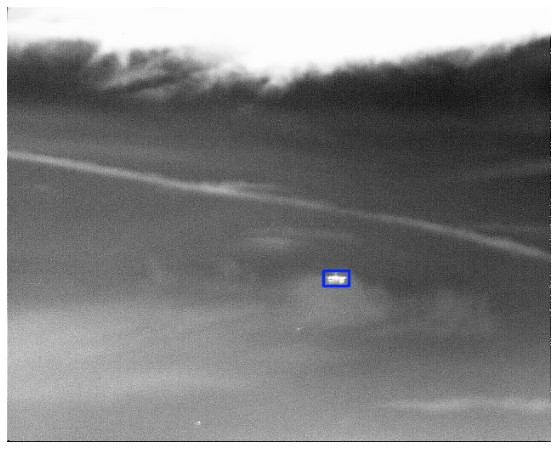

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res653', '000107d88e2d450ae5aa.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
# test data inference

# start time
start_time = time.time()
print('Starting...')

name_list = []
coord_list_xywhn_inference = []
coord_list_xyxy_inference = []

conf = 0.3
max_det = 1
imgsz = 640

for i in range(len(test_path_list)):
    image_name = test_path_list[i]
    print(image_name)

    # save name for res_table
    name_list.append(image_name)

    # get inference coords
    pred_tensor, coords_xyxy, coords_xywhn = yolo_fast_inference(test_path, image_name, conf, max_det)

    # save coords for res_table
    coord_list_xywhn_inference.append(coords_xywhn)
    coord_list_xyxy_inference.append(coords_xyxy)

# finish time
end_time = time.time()

# start time minus final time
elapsed_time = end_time - start_time
print('Elapsed time: ', elapsed_time)

Starting...
000078b014820eea7d6a.jpg
000107d88e2d450ae5aa.jpg
00020383c40bd9569516.jpg
00028540f903cbfa36ef.jpg
0002be225740b1b06058.jpg
0006fd027c321e613acd.jpg
000c0d88e771a08a3aab.jpg
000d1617185cf13fc3d5.jpg
001aaea4e3e4b64cb1fe.jpg
001c0bb809c35a73589d.jpg
001d20deae46fee335e1.jpg
0020e279bde36fd4eda2.jpg
0022a87ff14d67b30ef3.jpg
00241a50741d1858ea87.jpg
00299bb6fd91899e4f45.jpg
0029c2975c43be069103.jpg
002dc8b870a484520679.jpg
00330c17678815cb7d74.jpg
003316ac0371524d9c19.jpg
003450e1e271e734c50a.jpg
0034556decb99a872644.jpg
0036ec57395333247184.jpg
0039c7fa3aa7b65437a7.jpg
004022a7b93d9ec6de3e.jpg
004398b61b8b986ac144.jpg
0044701359247336d6d2.jpg
0045f37d88da986c589b.jpg
00486bdc4bf1ffabfe4e.jpg
0048e2cea7ff517f31e2.jpg
004909d0547b438e9ec0.jpg
0049eb95329b32c494e9.jpg
004cfa63782c5095a134.jpg
004d286b6276945a4d9b.jpg
004f93999c321d58dd75.jpg
0052ce541b4cd418474d.jpg
00557779f738f3652cbf.jpg
0055dccde4dd340aa9a5.jpg
0057a4d307c1f9895b8b.jpg
005aa6b1df2efb106917.jpg
005c28e0dd187

026f3316fbe61db8a3be.jpg
0273bb08f0948640daa8.jpg
02747aad43e6a215dfd0.jpg
027b4e2ac29983dacefc.jpg
027be113a5a4e460e051.jpg
027dab3a4b78d91e3f83.jpg
027f28cd12c69e186f56.jpg
027fcb96d41cdcf8720d.jpg
0282c37abb19be0fdb95.jpg
02834d0668600cd035a4.jpg
0289ff8a9d286ba901d1.jpg
028c74a35a622b99b3fa.jpg
028cfd4982bdbe8e2991.jpg
028d18477a05bc7f3923.jpg
028f7df251ed6d155215.jpg
028fe596eaf447c7b969.jpg
029400898e24d4ee86d9.jpg
0296e48bfbf5acc04c38.jpg
029a20448aa2c652dc42.jpg
029d1f238a2bc4908d56.jpg
02a147001bd761db1081.jpg
02a1cc600bafa6281f7c.jpg
02a32d213837e5ab7793.jpg
02a48c0756e593a2c34c.jpg
02a48d3446f6bce93cfb.jpg
02a4cb5882fcba5643ac.jpg
02a922e358689883fa2b.jpg
02ab29c338a1524e0e7b.jpg
02ab6bdf25cf56d244c5.jpg
02acec287f5d17bd8885.jpg
02ad5972390143492e1e.jpg
02ada0dc770d898a849b.jpg
02af4839fc384f46df11.jpg
02b176b89d455b0317e8.jpg
02b54f445ffe3963c6e5.jpg
02bbddc6c1b70d624333.jpg
02bc441d4632cfb269e0.jpg
02be6ee7b9eeabea077f.jpg
02c0498f8906f753ba72.jpg
02c3288048c713c598af.jpg


052dae40402693fd9ecb.jpg
052edaad07715336e943.jpg
052fed56413fb3b599ce.jpg
0530cab6316284ecc948.jpg
05313fbd5cd0efb002f9.jpg
05320019cd2c305d13c9.jpg
0533e4a6f465a8f553cf.jpg
053650e090a7611f5c96.jpg
053907c2a33d049c21ca.jpg
053947ca6109f1171bb0.jpg
053a6a13ced4027f73fd.jpg
05402679277761131dd6.jpg
05403a5f84786f1d7d93.jpg
05422b6bb153090d980d.jpg
054513d45e5cadf91174.jpg
054517ec77205ba86a75.jpg
05481781dd96e284744f.jpg
05492e835e7c60e0f862.jpg
0549b99f5823e5f75118.jpg
054afe79a114fca31ded.jpg
054c2a265f4b9c93f4d1.jpg
054f8028d96a4c1eed58.jpg
0550688f11a0ddca8cb4.jpg
0551306fb8ae3bf6d890.jpg
055176494877aa788b67.jpg
0553a935bbada136f2c9.jpg
055463fa2727911916e4.jpg
055579d73e74e3b9f301.jpg
0555ddc26695c27a4412.jpg
0558c76aa69018af9af3.jpg
055b40a806db248f9333.jpg
055c1c962ee6a6d43fbd.jpg
055cacd7443abed2026c.jpg
055d8c3588d58fbf9cf3.jpg
0561264509363d4c8f89.jpg
0562d781d755ae832dab.jpg
05640fa6bcecf3528ed9.jpg
0564d7e8115b891776ff.jpg
056618c10b52b3c5505d.jpg
0568aa1f4bcd9318b250.jpg


07a15c84022ac5a90352.jpg
07a2fad93fbf184a1336.jpg
07a9cce979b7240f87e1.jpg
07aa068d94d0cba257e9.jpg
07aa9d2f5dc9a04029d2.jpg
07adb9388d7298a5b08f.jpg
07af0a250d7ed2642109.jpg
07ba9da694ffe7eb1957.jpg
07bad69ed4702929cda8.jpg
07bc18922c100d2ac21b.jpg
07be3b9d902048533ae9.jpg
07c772718ce3fe3cf0f9.jpg
07c976ddc73100e70407.jpg
07cb79c966809ab09786.jpg
07cccd19c3b29abcd247.jpg
07d05166965e70170500.jpg
07d1562c4db44154fe3d.jpg
07d75adbcce649190d3d.jpg
07d7a112ea737e9cc1a8.jpg
07d7cc260bec63417f65.jpg
07d8492d5d27610fd902.jpg
07d988d1b6119afe2426.jpg
07dab3caf8e5bb6153a9.jpg
07e01bd120b4cc0a2797.jpg
07e11125f56cade3c8b8.jpg
07e1e7aedc11177c4ca1.jpg
07e3287b0321141ef5d4.jpg
07e4ffd82caf1741d9dc.jpg
07e59cb29b1de14c883d.jpg
07e7f5ae510d9bc0c32b.jpg
07ea0c48faa1b8fbca95.jpg
07eadf3dcfe5f5153548.jpg
07ebff7438cb01dd50a9.jpg
07eedb88c7981c8679da.jpg
07ef53818da8da839b7e.jpg
07f07c75f89c55d342e5.jpg
07f1003c2516bb695752.jpg
07f3940a5771102a0fd0.jpg
07f7445fd04c5526551e.jpg
07f934881fa50418f9a1.jpg


09ee6e41b8ef8a3cb5d4.jpg
09f0e47a0d540a0db423.jpg
09f232f735d3ad540c9c.jpg
09f2a07bd9b6fe5b7b0b.jpg
09f52d9ec733cb5ae6c5.jpg
09f5756aed3dee0655af.jpg
09f6417bc4363b8824cb.jpg
09f6cb4f70db3919aac3.jpg
09fa7df4ee9b1d8fe59a.jpg
09ffce99996f2f14db26.jpg
0a0054470d15030358b8.jpg
0a02946a43f9965cf0d2.jpg
0a052b443d4b7d56459d.jpg
0a090a732c694caa86f3.jpg
0a0b0ae30abc648a92cb.jpg
0a0d58b0f3e446e849fa.jpg
0a0d89e32ca20901410b.jpg
0a0d9bef01f3ed5d17ab.jpg
0a0e0f924fe4e54581d5.jpg
0a105c2d8231b9bc0615.jpg
0a1073b038ca9ba18153.jpg
0a1227cbc0e933050c97.jpg
0a124af479330f988d01.jpg
0a1589d8b28854e4c2dd.jpg
0a15eb287279db7e2369.jpg
0a1816849d4151103406.jpg
0a1a079ebf74a614a594.jpg
0a1a45d6bd276a55d676.jpg
0a2003c86dd5f8a96523.jpg
0a22d5184c3db63bfb1f.jpg
0a278005e392dbe23cba.jpg
0a27a4f8df313c06a4d9.jpg
0a27dd987ad2439dfe76.jpg
0a2ad457823bb40d1f7c.jpg
0a2b52035d3f0c7af03b.jpg
0a2b770cdd2d469c16f4.jpg
0a2bc10c9940999cab1e.jpg
0a2ca5ec9e66829b5fbd.jpg
0a2eac9d1b893927cd63.jpg
0a2f002b9a2a3ae08050.jpg


0c24e4fa331505fbeb87.jpg
0c268080de6094984dc4.jpg
0c26a4a4c109db609fb4.jpg
0c28d56146b1ec69100b.jpg
0c28f18ced8ce04cad58.jpg
0c2ae93c30eba4717fe6.jpg
0c2afbd42e9e8fa6ead4.jpg
0c30796dc1dd1ec4a585.jpg
0c30d64ea321a53cfb2e.jpg
0c31744412b0d24035de.jpg
0c36ff303471d5ae6851.jpg
0c3749daad8657750a56.jpg
0c3c68b480653823227e.jpg
0c3d8fce6ea54aba6767.jpg
0c3db0d51b1fde0a9d21.jpg
0c402c2af3b486d29741.jpg
0c40c76178c898190c65.jpg
0c419d60176379d0d006.jpg
0c41d044884e5347cc50.jpg
0c4290fcab52156678de.jpg
0c437c2fc4db1ba0ab6e.jpg
0c474bf72e8c64d28e32.jpg
0c48629923d2436a597d.jpg
0c4dfd5e1b358091feca.jpg
0c5068c15c6e628c810b.jpg
0c519dfef104b2468ccb.jpg
0c545a63cdeb24ecf240.jpg
0c54adefafee524e5e87.jpg
0c54c445e238c7fe3b2e.jpg
0c55484d0a6154c73935.jpg
0c579e40e0c0ba857d84.jpg
0c5910145f94d54103e8.jpg
0c5aec6108e3ed61e422.jpg
0c61750e5176b62804f1.jpg
0c618a2ee1ca19439c95.jpg
0c65bf9829a387a61273.jpg
0c6a2494abacb5e5b450.jpg
0c6b255d206508b4e6ef.jpg
0c6b95608bd4600c332f.jpg
0c6fd1da9f7e43035932.jpg


0eb15ef77cfd82ddfd09.jpg
0eb74d689b0d0da286c0.jpg
0eb9ccc90ada3d426c9a.jpg
0ebcc46638d5a31efce9.jpg
0ebfc351ca7d4b6cb273.jpg
0ec02db0717dbbede5f3.jpg
0ec5ad09d5f658dd3c2b.jpg
0ec6a30e4e2fa880c333.jpg
0ec6e66c3c9421baab8d.jpg
0ec7768fb57bd11819cb.jpg
0ec8b38b4fcd50d16c6d.jpg
0ecbe153565280450ab2.jpg
0ece2cb39f68e6ee2f51.jpg
0ece693959ab6ce86e53.jpg
0ecf5b0a8d11320a5f0b.jpg
0ed1e05f1dbad21aee1a.jpg
0ed4325527fb27e7e05e.jpg
0ed528aa777cb32bdae8.jpg
0ed6164a9f9470e27a99.jpg
0ed656514f6687f90235.jpg
0ed6d1f6a91efe121a7c.jpg
0ed753ee55d5b911beec.jpg
0ed7dec543ba96982d85.jpg
0ed83ad67a80dbfcb017.jpg
0ee08c09bb3f1163f996.jpg
0ee0d680ba12db58e921.jpg
0ee2b392f5ee9a2ecd68.jpg
0ee2ef57ecba4c821e9b.jpg
0ee67942c4cff7c51a8c.jpg
0ef5bf06fe8623d955f9.jpg
0ef9c953f3728d745353.jpg
0f035140c438e0df17ee.jpg
0f04a2b7d8d3f371da92.jpg
0f06bdeaa43179210665.jpg
0f080204cee8ddc1e69b.jpg
0f0c2a26b74fec22892d.jpg
0f0c7a26318f9a256b06.jpg
0f0d5eff5199cbdb45e0.jpg
0f10d91262245fac80ac.jpg
0f1312086f54552a9581.jpg


114998a11e0b6cd7ae7e.jpg
114a9071168a782042ae.jpg
114fc9e1e65110561111.jpg
11503229e44b9240cba1.jpg
11545d77ba19abf33f00.jpg
1154e31629e5c6912dc9.jpg
11558cc63a5e8ae47577.jpg
11628e4d9e723e07909d.jpg
11634472972dd6ffbe67.jpg
116439c0b6360c3974e6.jpg
116516523131a4878fcc.jpg
11655f14419378e6bafe.jpg
11657d0c52f644d756aa.jpg
1168548268b404594d66.jpg
1168874b5a31195a0259.jpg
116b5d8993c3272b30f6.jpg
116d2bccc1c93cb19416.jpg
116d7094d68bc0992756.jpg
1171eb615d8d2199e774.jpg
11737e9af540ccfedef8.jpg
1173d3ad30e591719fce.jpg
11787818aaf901614e2c.jpg
117f86a2574f75285a64.jpg
1180eebe1423368696e3.jpg
1181ddc0628e1e1fe4e9.jpg
1183e2576a0816593357.jpg
1185dcdc3e397622e637.jpg
1186acb728e9cb0ee58c.jpg
1186b6009b5e510b3f9c.jpg
1188853dd47dfbca087c.jpg
118c0884793dddcb0837.jpg
118ce00ccb9cc54ecbff.jpg
118d8188d4eedd7ebe23.jpg
1190962c85b82fea9a08.jpg
11915b1558d7def3f510.jpg
11922a14f459186d2123.jpg
11931999e300e75459fb.jpg
1196514df7aa9edcc841.jpg
1196c78364fae4f50bf9.jpg
11971d3ea3fb748f9297.jpg


1397cc80533919d95ef4.jpg
1398f78df1583d298e31.jpg
139c3c6f6cf613366976.jpg
139d27365cc84b3d35a4.jpg
13a135fa82662414d840.jpg
13a215787dcd20d12cb8.jpg
13a45dfa5458b0861a6c.jpg
13a79b07068131759b78.jpg
13aa4ebb26b5b62455e9.jpg
13acfad23a94068bc41e.jpg
13ad64716cf79f51f984.jpg
13adc81938a08fbbc7f3.jpg
13adf921a55e0d499305.jpg
13b1817f942746c5f24d.jpg
13b6bd6748d053eb8a25.jpg
13bad91c43f277d82676.jpg
13bd726af5697192a93a.jpg
13bee3f00a39c1fb646e.jpg
13c21c3c2ae95e5b8dd7.jpg
13c2a63dcab0c6939263.jpg
13c487ecef1507093459.jpg
13c662dc9eb9a6221497.jpg
13c67bd3d637d876e5da.jpg
13c7c4a62dd1b8317a56.jpg
13c921e720078bf23f72.jpg
13cb11cfd29fe06c4a0b.jpg
13cca28277e382cc6bf3.jpg
13cd14a92a0d5ff2caaa.jpg
13cfca80a758a06310ea.jpg
13d65723747e8c38eed4.jpg
13d79215f63e7ee8c6e6.jpg
13d8c60ab05690b63405.jpg
13d99f5f2093dbff6726.jpg
13dbe6742756e1c98991.jpg
13dd37e8c4dd79bc19a8.jpg
13ddcb6288ef1f1c7727.jpg
13dfdbe309c7700749b0.jpg
13e351e624cd553e8da6.jpg
13f1b01ffd0a4e8e6a8d.jpg
13f7a3ed1ad697772035.jpg


160cd838cc3c90607dd5.jpg
160d6525824c8bd26385.jpg
161db5e099b2a4ea54d1.jpg
1621a4881750a391f530.jpg
1624d495da6a08a09eb3.jpg
1626257c7122cec304d1.jpg
162673cf731f5cc1c681.jpg
16285216184d868192f6.jpg
162bda798bff47602b0c.jpg
162c0d591d35bf7f96e3.jpg
162c456562673bf1ac1b.jpg
162e073e33f10c418ae0.jpg
162f8d598b5b88a7be41.jpg
1630ac8c2e3eb40ad74f.jpg
1639569a337011162f6c.jpg
163ceae1c7a46677d000.jpg
163f0f56862f985741a3.jpg
164282739b6316479bdb.jpg
1649f36fbccbd9246443.jpg
164a7ca94d7ea3df6c4f.jpg
164d360d8e1a398ed9e9.jpg
164e0e11fb0856b98eba.jpg
164e457f3014c5530b19.jpg
164f545562d3399219a2.jpg
16517b98d563b1eeca9c.jpg
1651deaa552c46922638.jpg
16530ed4241382304b97.jpg
165475bb09a098598993.jpg
1655fdf5845210563c05.jpg
165638261f168fa0e766.jpg
1657cd1cf7c71f02dc35.jpg
165acc505dcee91cbbc6.jpg
165b095ab1cc64b277ac.jpg
165d00f5f99beb301735.jpg
166063b4e7ac045b44b3.jpg
1660679f204aabe02f11.jpg
16613f32f8be6ada2433.jpg
1665f4d4e0163a6154d0.jpg
166944b91382248284e6.jpg
166a20d0601a48fe1aab.jpg


18a29d53a4d9b8d09ac1.jpg
18a7578767094e89517a.jpg
18a8562fab898fab5a68.jpg
18aa8b818ddf8b481daa.jpg
18ae5ee47cb7b2cb8d69.jpg
18b38a13439830fad0ab.jpg
18b3e749f2e226b6c589.jpg
18b51626813750f34100.jpg
18b6a5f7962c605057ef.jpg
18b7d1d345f5b9d3b143.jpg
18b859a14fa351b2e7d5.jpg
18b8787cfe9b9b85f7ae.jpg
18bb8271f91df4b8ac6f.jpg
18bed01c7fdcb5b5bef5.jpg
18bf1bbb1b788a491838.jpg
18bff70c5962b69a816d.jpg
18c26ebcae27ba7ce238.jpg
18c36052b27aa67619ee.jpg
18c4929e0a4ce1221dbb.jpg
18c50a57b4fcdef1d26d.jpg
18c5701918c39c3cffe9.jpg
18c767e78c517810350e.jpg
18cb5642570e364d7bd1.jpg
18cbf5a4b86c4d88ecd7.jpg
18cd3d91679e42c3751c.jpg
18cf965dcf9bf4b223b8.jpg
18d0ea24240044294f1d.jpg
18d20c328b3afdc0e6a0.jpg
18d2cd3e2549d286d678.jpg
18d5f320b29a8686ea06.jpg
18d85b207529a6251691.jpg
18d938b15be8d3953c88.jpg
18dd7bbc8709743f8883.jpg
18dd9a7e3c3d1446ee62.jpg
18dfa06abc8c5508498e.jpg
18e18f5459f556eb702e.jpg
18e32f5aa3f829cd6f6e.jpg
18e3f4b680903db9d73a.jpg
18e49ac6f537a9af7eb3.jpg
18e52f0189fe9d8526c0.jpg


1b03d399de4dca7a1c8a.jpg
1b048b9b7712743ffb24.jpg
1b070d13c726dfad4ab1.jpg
1b0882ca53d76b38c6c7.jpg
1b0cef943840b786901e.jpg
1b128139e81a082df026.jpg
1b1374d59b0a1de49e98.jpg
1b15b7fb81172184bcf0.jpg
1b19eeb6d15f107d7abe.jpg
1b1b34fdf1386f21f53e.jpg
1b1c09183639cc4923ed.jpg
1b2214a15f6853f156d2.jpg
1b24bcf5e9d60ce5a4ef.jpg
1b269904caef7779afc7.jpg
1b26b203bdd6f6786ca2.jpg
1b28d1ceaa56b2647430.jpg
1b2b4457a9ff5ddf9db5.jpg
1b2d0b750678dbc367e7.jpg
1b2d47e20b10a6222beb.jpg
1b2e8d16397f8d9c9343.jpg
1b306ca87c38f7ebb0a0.jpg
1b30ff632e00fcaf3eb0.jpg
1b3134dbc20a0e9ca69e.jpg
1b3294dab3e4a35093b6.jpg
1b32a6a7ced39c9f3364.jpg
1b3354a20818754f93ee.jpg
1b348bafbd97cc025757.jpg
1b34c83a7ee1188d5fbc.jpg
1b3504941d99aaa96581.jpg
1b360d78314d3b50d184.jpg
1b398081ac1a06fed1a1.jpg
1b3b12787d2169b08aab.jpg
1b3c0f672a69d795e67b.jpg
1b3c0f6e9b0096d4e0df.jpg
1b3e5a729aab5c04896a.jpg
1b3f9d2f5b8a8f89d232.jpg
1b42f52b59eecf26f168.jpg
1b434591fa29aca85333.jpg
1b444f36187249f8024f.jpg
1b458fab91dcf7578aab.jpg


1d9d4794045a1fe08b06.jpg
1da2115eb62ccd079ad6.jpg
1da3080ca52335dce8b5.jpg
1da32047bfc6c2013e1e.jpg
1da5a1a4918e4c78b159.jpg
1da90de862f85cb3bbad.jpg
1da980ed6a5ccd34e208.jpg
1dab73bd7daacadd94b2.jpg
1daba1748ebf19ba3954.jpg
1dac01bffbbc534001db.jpg
1dadb582668c4822e148.jpg
1db0140c7b7cdf15834d.jpg
1db1313a2915d9b51ae3.jpg
1db172dc62697411285d.jpg
1db2a9096477709f0d8d.jpg
1db2f32aca8fee9677ad.jpg
1db33f2a3b7a3d7b9e70.jpg
1db3d533549fd884189d.jpg
1db4577f8780a9cd4b84.jpg
1db56c5563446f07da37.jpg
1db6bbf749fc6f392e85.jpg
1db98eb6d1d75300c73e.jpg
1db9a0fb19cd50c1a532.jpg
1dbab7a4907c07a2033d.jpg
1dbc2d69f2c961f12f10.jpg
1dbc69525f1c08dec3a3.jpg
1dbd09b52fbc512816c1.jpg
1dc11f6ac366f109d792.jpg
1dc23f5bec60b086d3af.jpg
1dc24f58d8a7f3bfaf13.jpg
1dc28760408814f1abb5.jpg
1dc7653a5bcaaab344cf.jpg
1dc7755ecf82de75af52.jpg
1dc8bb7ca6cb31aff54b.jpg
1dc8ddf2d3ceffd1a9c6.jpg
1dcc3ed4d4d718bf9ff6.jpg
1dcd177407adc3edc17f.jpg
1dce2430c74808e9cc15.jpg
1dcf0ba50375890d4fd5.jpg
1dcf33eadf141c464ca2.jpg


1ffb1c3f074c2c11036b.jpg
1ffdee5b1d6d53ed8fe3.jpg
1fff30ed752bbae6cdee.jpg
20002cf53fee2f0d2d52.jpg
20004cc2583291b6ced2.jpg
200348335666d886d551.jpg
2004e24f134f87283972.jpg
200542816c160d0bceb2.jpg
20058e41bf5fb12a52e9.jpg
2006b62dbe63eb867d6f.jpg
20079729b2b23835ee92.jpg
200bfe39bd8fc54cff55.jpg
200cc0beee72f025d0ab.jpg
200d3ddcd197ac9aac62.jpg
20100bf70084af9697a4.jpg
20130b21a08670f5bf5e.jpg
201675084df0dc38ccf9.jpg
20167c29a00e7cbf5f34.jpg
2016e5e378473cda14e9.jpg
2018bd8add48ff57a5ab.jpg
201a26201437535e0533.jpg
201c765e311365398082.jpg
201c9deecc4d528cbef5.jpg
201f3aadd4a76d063dec.jpg
2022260a87f1d7c2dcfe.jpg
2024b0875a887a429b13.jpg
2025e4efc27e18028720.jpg
20264e0e28423dac0d49.jpg
20283571e14e9268df42.jpg
202858e7ae864a8ab7f5.jpg
2029560afdb6a56edefc.jpg
202aef8cbb14b7d4018b.jpg
202bfe0eeb5b10c2f696.jpg
202d4253bfd20457dd1b.jpg
202e1cc44a2d5aa722d3.jpg
202ec01f641510827258.jpg
202f51848f58f89be8c4.jpg
203369afda371f83d662.jpg
2036479237fbf9a657ad.jpg
20369a1fc5ba906e96c3.jpg


229db082c35cbe84dcad.jpg
229de37de632b9209d4e.jpg
229e3d5d3acbc3bf8a96.jpg
229e9190fac1add022d1.jpg
229f5d3990bcb59b061e.jpg
22a331099b97020359d3.jpg
22a924198ec8ed240065.jpg
22aa2c9b1e95744da24e.jpg
22aa32e7168bc6b30799.jpg
22acbf60102ea1581b02.jpg
22acdf3c7bf4b42c7852.jpg
22afb02c0454b349fee9.jpg
22aff8e9786fc762ea5b.jpg
22b6d3f0921cae3d9e9f.jpg
22b7c54664b735d4316f.jpg
22b8f271d4017642e768.jpg
22bafd3a5979449c96f7.jpg
22be28fa2ffa9c1182f9.jpg
22bf10866d5f52d7e7d4.jpg
22c0a0d2e3d96b8697bd.jpg
22c0b1d68b005f15367c.jpg
22c160e576b722691a1c.jpg
22c20ad569b33ce14c18.jpg
22c24f2159573601e57d.jpg
22c25c5dc3191221d25b.jpg
22c39b1aa1b66e1c7ab6.jpg
22c71df208866cd78050.jpg
22c77e677d1e83e57899.jpg
22c7dd05110a9690cf45.jpg
22c8821971d7f2bc2f87.jpg
22ccdec225dd0390079e.jpg
22cd5b896f3be561cf75.jpg
22cd96ec0cae16229f0b.jpg
22d035c9fb7bc09d77b4.jpg
22d0ca0eb0d383cc6a06.jpg
22d0ca7b520aab5271ce.jpg
22d0dd06df50b317ff3c.jpg
22d22f71d0a55cbedba4.jpg
22d730ede06e0cfceb13.jpg
22d8214626483ec2a34c.jpg


24c622d7dc6ff4b0bc9a.jpg
24c748e32ea9d60e502f.jpg
24c7bedca404ed7878f9.jpg
24c7bfeddcaf69e4288f.jpg
24c7f7adaeee2cd98878.jpg
24c87ae59a3fd46ab8aa.jpg
24c8a2392666fb60a463.jpg
24ccb1054ba308c469cd.jpg
24cf8eacafd5c0e2c028.jpg
24d1c3cc9e14739ca3f0.jpg
24d262cfa8977bd1a38d.jpg
24d857670783428898d6.jpg
24d85f64901e139b4b8d.jpg
24d985ee527904e00ca3.jpg
24dac347506e37e42bbb.jpg
24dedcc790e1a0f3ad02.jpg
24e133719126c7694a90.jpg
24e3baf84cb4713004e9.jpg
24e78dd4624c151d599e.jpg
24e9514d4770a06a4cac.jpg
24ea51ee802583b02ab0.jpg
24ea72d42ed806a266a5.jpg
24ea7be493f2bedb67a6.jpg
24ec7cd8d3ad1184933a.jpg
24efb1c85639a0aa67e5.jpg
24efd79f0dda96ee0c2c.jpg
24f0fa9ce255e750f52c.jpg
24f13f3822e01f1dee6c.jpg
24f2f70b8f1cb3da4e7a.jpg
24f3fc665e6a5ed876aa.jpg
24fad57ff3eb63a10900.jpg
24fceb2477a24e5c1a9c.jpg
24fd774725733cda64cb.jpg
24fde0e7300e34dc3441.jpg
25031a310d7adbf39b6e.jpg
250561f6ea11d7ba5ad5.jpg
2506ae6faf81903261ee.jpg
25089fbaa1a4c768610e.jpg
250b262c6059dfa27fd9.jpg
250d670431839d51f9bd.jpg


2759e7e46ec3ff3b4c34.jpg
275d6bd87734718b0839.jpg
275f17e06aeb14113583.jpg
27603507f852e2ac3f4f.jpg
2760b2cbfdca64857e33.jpg
27617e895977f4ba29cb.jpg
2769fa83e0b4271011a2.jpg
276b2d514d7fc0b9c8fb.jpg
276b59ddc10f7cf26ca6.jpg
276e22c29116ae7107fc.jpg
2770a0fe6a94e207c195.jpg
2774e6d907a11e232860.jpg
2774f7544446d487abba.jpg
2775d694227b3d796690.jpg
2775ecd3d2cb18e1cb1f.jpg
2778eabcb4144b7ee38b.jpg
277ac33fedc9ccf027ad.jpg
277d42c3abd85b044435.jpg
277f80c0aee10373c802.jpg
27855db7074fbb893be0.jpg
2785625977a5896fae12.jpg
2786a32d14661c45da87.jpg
2787c3457487f568b9d3.jpg
27883e5b3c955fd1c42d.jpg
278a39b1940489e95ca9.jpg
278aaf81fe8baddfaeec.jpg
278abb4628efc92e7d11.jpg
278b5d42bb428df954d5.jpg
278d096aeadb786dd2bb.jpg
279125d860b3466ccdef.jpg
279322a5ebdc2b1d3082.jpg
279673c0185d36a051d0.jpg
2796b5f89dc6ef6d8894.jpg
2797ec2904cfaaacc602.jpg
279969c75acf5559ad2d.jpg
279c1fb6cd15fcc5baed.jpg
279dd83b2826f9358b53.jpg
27a151c8546f6b12d392.jpg
27a2697088433c50ecc0.jpg
27a2e00351fe9ef830a0.jpg


29cd9bbe585ccc2d5451.jpg
29d3c436839ae5329d77.jpg
29d402963d928db9dee7.jpg
29d89edddb0837bed419.jpg
29d93f3787b699269286.jpg
29da9f238bb478c6b877.jpg
29db41a66d87e2471508.jpg
29db8e9ec79a91de3663.jpg
29dc42b8a92f09dc133e.jpg
29dfbfe725ccb6711b0f.jpg
29e03f59d44d8302c22d.jpg
29e2a4c424406b680848.jpg
29e7e14dd5e96b68913f.jpg
29e9747d6df642eae9ba.jpg
29e975d1cd33962ee9a9.jpg
29ea310d71f53068ec21.jpg
29eae7f2f75c072ebae9.jpg
29eca3cf21c32edae683.jpg
29ed820a39a61d76c097.jpg
29ee247dfcce07f02233.jpg
29f0e6cba7c90a40a026.jpg
29f21c524c3d39804be6.jpg
29f49396d571561cfc31.jpg
29f6b2ce79f70fe3a4e4.jpg
29f75d86f940926aa96f.jpg
29f7d6981356e7576e70.jpg
29f80ce38e1e231b4261.jpg
29fc9b7bbd81e457b33c.jpg
2a01ba93463facf9c23f.jpg
2a03ad51e8d8be850afd.jpg
2a03bdaa7b3b0d24f3ae.jpg
2a0694602cd66facc6b8.jpg
2a0812768df41122b8b1.jpg
2a09ae188e1bde9aab2f.jpg
2a0fa0c6aff864383ef2.jpg
2a11bd5f8358a5033a4a.jpg
2a15a59ea0c2b67273c1.jpg
2a18db68b250f9fa2ddd.jpg
2a18f1e6695d48771e3c.jpg
2a1a5dd7dd6ec43badbf.jpg


2c70a285dc462e9c7d74.jpg
2c733da2b32a0b2642f2.jpg
2c76667d32b0bc6cce5b.jpg
2c78ed44ea5e4f41624f.jpg
2c79a5a6e9be9ffb7806.jpg
2c7a9c32dea5ab82e0e1.jpg
2c7ddfb5b0ced9a94a99.jpg
2c810510f260027f70ef.jpg
2c824bb109f49ff8e25a.jpg
2c86d70656c82078df8c.jpg
2c894782ead737b842da.jpg
2c8c57196e162a3e5d83.jpg
2c8d76517eab381e9f71.jpg
2c90ba936871665fb75e.jpg
2c91149cd715bfb35871.jpg
2c9591147a1b55f28863.jpg
2c96409366e18ee8f272.jpg
2c98192932ce7642b006.jpg
2c9924b5b81bcaa6a6aa.jpg
2c99c1d46815633fa74b.jpg
2c9aff11f5d9e060ec83.jpg
2c9b4d8061ec663b36b8.jpg
2c9bb9742908210bf075.jpg
2c9d7abfd976b42b8225.jpg
2ca43e1a7cc9aaae9231.jpg
2ca4e214c7b8d6613c0a.jpg
2ca51bb1724e5d77f17d.jpg
2ca6f401f9fcbea0af48.jpg
2ca9d92f35e4fd734cf8.jpg
2cad7bbb6930e9f840bb.jpg
2cada64926edaf32c30c.jpg
2cae14d8cda619c663be.jpg
2cb0d693a211f5646864.jpg
2cb120c9e8890f0201a2.jpg
2cb7baf116d343ca60af.jpg
2cb9de1a6527f579a08f.jpg
2cba72f126d70579ed10.jpg
2cbe01e303df34739526.jpg
2cbf77a84315edbaf1d9.jpg
2cc0c33257ec9ee56334.jpg


2f1c536ace0107a00f97.jpg
2f1df5d094da568aef39.jpg
2f1dfb3cf0b85c6ea572.jpg
2f202b9853007097ed05.jpg
2f208336d60175824f86.jpg
2f20e2261bd84aa765a9.jpg
2f228b511ad689858376.jpg
2f25196d48440fb0783b.jpg
2f2814493119b87c336e.jpg
2f2afffbba37d4b6f791.jpg
2f2dc326a2e1535fd2a0.jpg
2f3050bb952384d653a8.jpg
2f321d3d11ba837d9068.jpg
2f33062836a34182418f.jpg
2f35348fb388a0e576ef.jpg
2f3ad7aec074b71dbbf2.jpg
2f3c3022037a1c294cae.jpg
2f3c6fef06d45ed5e782.jpg
2f3e74cd4dbfba8296a2.jpg
2f3ec582a5e1b789b34a.jpg
2f414e9e2d03075d1a10.jpg
2f439aab520f9c434ea0.jpg
2f4427111b417ebbc2e7.jpg
2f44fcfb577003a39846.jpg
2f46179b1047742563d1.jpg
2f48775b20765e375a2f.jpg
2f4cc804675cae8d746c.jpg
2f4e8c95bda506160e13.jpg
2f517aa23ff1c2fb182a.jpg
2f53daa3f9a776467d50.jpg
2f54600fd4a2450294ee.jpg
2f547a932583ba72e1ec.jpg
2f5576ecdd9ff08021ef.jpg
2f58b44464e14f41931f.jpg
2f58d0986dfc64584245.jpg
2f5c6efecb54a46457aa.jpg
2f5e729a1454f859c75b.jpg
2f5e994a800888604c00.jpg
2f5fbe575a90f8fb1837.jpg
2f616cd4aba30e603cd5.jpg


3168c509d6096205d72f.jpg
316b3ef76364524e36f9.jpg
316c87772305e2a2bf21.jpg
316e5c6f15b6af533e1c.jpg
317178193bbf0643df14.jpg
317494613ea9a170faeb.jpg
317552b334ea77640e08.jpg
317672fd1d52d1415725.jpg
317b514cb7fe9368d759.jpg
317d9da3107e6c1050c1.jpg
317e7b3b6a4c48c52a90.jpg
317f2f05769f6da86c33.jpg
317f4757c07ef5786c4a.jpg
3180e42bc17d55421cad.jpg
3181f4337de1d54b4d1c.jpg
3185e3198f2b692747ab.jpg
31886f2fae312409fc38.jpg
318ac343add7e940b380.jpg
318b018537fca55f7df0.jpg
318b092c2b8963721942.jpg
318d13d796c5bd43af25.jpg
318df33d3fd88d39cfe9.jpg
319b0df79fb374f009b5.jpg
319cb4cbbd9eea0f654c.jpg
319f64785b02c7da44fe.jpg
31a04e3a6050f7f81275.jpg
31a1a767f2d216f596d3.jpg
31a3c41c49574f59e7ee.jpg
31a5d04a50d709dff38f.jpg
31a6aef87f5cc9f407e9.jpg
31a94a4aaddf8972804d.jpg
31af2319b9e21102f7a6.jpg
31b06a1d079ef83924f8.jpg
31b2b35a578143431f69.jpg
31b3745df0ea296bc2ef.jpg
31b5d2aa513cb110be7a.jpg
31b62c89988d4684e418.jpg
31b68497f567d30c656f.jpg
31b8f100408b2bfe9c49.jpg
31bb8da765ad13128082.jpg


3419f2313aa79ebd9aa0.jpg
341fac0d60a802381393.jpg
3422ee1fc8886e0c531a.jpg
3423cbf38d2251d3a8e1.jpg
3425769e8ce7713828bc.jpg
3427b2c433b63354383b.jpg
342b79fb5c0df67b872e.jpg
342d506f54f4463137b4.jpg
342ee740a56a8e99a3f2.jpg
34329f4f2d7bddb74828.jpg
34333a2c903a57344a95.jpg
3436461fb5c313bbeef8.jpg
34387470857249ead3f4.jpg
34388376818231f1cc1b.jpg
3438bf2e0178c7b5261f.jpg
343b86d1553b383d0095.jpg
343c5dfc0ae0079d98d1.jpg
34468ae7f4bd41a01477.jpg
3446c7ef58b1360ea863.jpg
3448e9697285f7ed1fa1.jpg
344c01d57711872bda6a.jpg
344c104030353078f6e9.jpg
344c15964e28896c4450.jpg
34532c38b4b1e0c12a75.jpg
345375482f8422f974ff.jpg
345692fdc4d3a2a14edd.jpg
3457c15d824dec614b2e.jpg
34581f79fb6d36526d5f.jpg
34587fd4a1896a7a7270.jpg
34592e9219991edcd159.jpg
3459dff081d11ed75d59.jpg
3459ef82bf551c9f8d75.jpg
345a222f96f3edc19b72.jpg
345dbf06bcf8ab206055.jpg
345e788bd10c9ceb3039.jpg
345ffb9a466ee997de17.jpg
346257fd62b7eb1fa7c6.jpg
34661fb8229d0af57a10.jpg
346af8ff91886570ec50.jpg
346c64aba5348e5d30bb.jpg


36a35373f13584c78f31.jpg
36a3edbaeacdc24ccff2.jpg
36a831bcc20230e09159.jpg
36a87eea7be4caccdd1b.jpg
36af2b3f48b127c69094.jpg
36af4b023858b7a007a6.jpg
36af982e00b368cc2199.jpg
36b08500eca5c86d784d.jpg
36b178b3d5c046917f25.jpg
36b28fd4c668813cfa34.jpg
36b4d40fe0ca77f19fcb.jpg
36b6db44cc86268539f9.jpg
36b95f6fb0288aae6857.jpg
36bbf930beef81efd00b.jpg
36bc52bdbc1292c355df.jpg
36bd24b0e688cb67caed.jpg
36be15c0c479fe479d53.jpg
36c43a6376c872bc8a32.jpg
36c5470dc8a68de1e5b7.jpg
36c5943d817e0e95c247.jpg
36c7f6c1251e7cbaef7b.jpg
36c899e3967f141109c5.jpg
36ccf31f3ceb3e940a4e.jpg
36cdda0bd358fdfbeb10.jpg
36cee9bd534227bced77.jpg
36cf049273ff777ea0dd.jpg
36cfab8acebafb380b33.jpg
36d1c368111b1c1897cf.jpg
36d26ae16852f2a9caa4.jpg
36d8bf8824386ba86b80.jpg
36d9b95eff751183ec5f.jpg
36df2715ceef9bbb6a78.jpg
36e2fee5003f92cb1e0d.jpg
36ebb885d34ad2311218.jpg
36ecbeb5e2249d16e096.jpg
36f085c22ad2266d9cc2.jpg
36f08d046cf5596d26fa.jpg
36f346f27144cea2b01c.jpg
36f481c8c65837514198.jpg
36f651347388002f9cb7.jpg


393a20aaa2c4b9ad722f.jpg
393a3e06febd7b6a9b32.jpg
393a40d431f31a80e9a4.jpg
393e3efeb6887483c9b5.jpg
393ef869f8f678caab86.jpg
393f207dfa5c709f6d95.jpg
394054592863892de75b.jpg
3941ebab5c3e5f13c19f.jpg
39429c120667b816cbb9.jpg
394376d72c94602aefa8.jpg
39448ab69e5b1b0ef97b.jpg
3944c6a4dab797841e86.jpg
39465f5beb903e7af45e.jpg
394f548d5b1510768951.jpg
395106ae0ec9d97e10d4.jpg
39520443de2b9e2dfe99.jpg
3954da4df7e7d2517153.jpg
3958fb3a9b4d2931ba7c.jpg
395cf08957e1d9059013.jpg
395d69e87be668df89c4.jpg
395e3a67abd29bfd370b.jpg
395e9eef3d2bacbf6885.jpg
395ea7068668d0e72727.jpg
395f66d444d514ce06e1.jpg
3960ada68d458c4d3565.jpg
3960d9edb8ff8e12b4d7.jpg
3962699f7390d67e07af.jpg
39692596fb3de5196399.jpg
396ac30316d4b9a18d30.jpg
396b862baa97a545cdcb.jpg
396ba7121c56a586eec2.jpg
396e548002623b4635cf.jpg
3970e7c8f48141b34a29.jpg
3975c1c3d96770ebeec3.jpg
3977a4e5a8889788aa35.jpg
3978336f8f098db84898.jpg
397be1f0c179adf873ad.jpg
397c13e4eaefff25084c.jpg
397eb766e2a6e9a291b9.jpg
397edefafae0d6656af5.jpg


3b9f75f5eb8317f04ed7.jpg
3ba07ca99e40d2c78ef4.jpg
3ba11ac3f74b0e2b9c1d.jpg
3ba27758d9b8506a9e22.jpg
3ba6750386dc93b6c35c.jpg
3ba8b5bcda37ea5a6d46.jpg
3bae811b5d7aeabd47f2.jpg
3baeff1257fe0f68fb33.jpg
3baf9ce9cc247f16e4c7.jpg
3bafae6453c5f5805194.jpg
3bb16e03705754d651e8.jpg
3bb49bf144c0ac9ebf4f.jpg
3bb5f97a4b1a05e7caba.jpg
3bba191c1c250dcf1e60.jpg
3bba84f5f269685e6ce8.jpg
3bc421d3381a33cf5316.jpg
3bc63ee2640d8faff022.jpg
3bc6ef68682a8cb7bb1f.jpg
3bc793ff29d19a949155.jpg
3bc9c8076df1d9f7a52b.jpg
3bcc68d53267b3307f45.jpg
3bcd887394df48b4a4a5.jpg
3bd1157833dd35f554fb.jpg
3bd17c4977bc92419b37.jpg
3bd22cbc47af2197ad6e.jpg
3bd625d34eb9207b628e.jpg
3bda9a7067870ca69dc4.jpg
3bdc66e42d2ceffebfb2.jpg
3be492f4e9d76f8bb186.jpg
3be9324896b808fa91f6.jpg
3beb01e4442c349f2cf0.jpg
3bed1173e07d2f7e5276.jpg
3beea9d662db944ef6ff.jpg
3bf08c7b2386ab65a9cd.jpg
3bf5352f5f6ba9713f26.jpg
3bf68ace8b9e5be1f7be.jpg
3bf8be93a50d4b2215b9.jpg
3bf8de38ac8404723e3b.jpg
3bfc28873d6da08edc7d.jpg
3bfd22441de6b3e528da.jpg


3e7eaab9b915228364fc.jpg
3e7fc203bed3c6c0b526.jpg
3e8031b3715ce8105a99.jpg
3e80ec53918f065cf119.jpg
3e818c0bcbae253054c0.jpg
3e834926ec98ce476b8d.jpg
3e83f4355841388723c2.jpg
3e844ad94687ddaf584b.jpg
3e847adcede7f6c02917.jpg
3e85949cb58069b85678.jpg
3e8b1c65701be7bc4084.jpg
3e8d0fbbeb7868ac2608.jpg
3e8d1d53832f157c0215.jpg
3e90cf4d276370e04dea.jpg
3e91572fddaa174695af.jpg
3e9497485f33b3e895a4.jpg
3e9550b783f5e531c09d.jpg
3e9964fdcc5cec23b88b.jpg
3e99c2a9228ff9940d06.jpg
3ea19845c58e9094f2d6.jpg
3ea39ccefb92bbbc93c9.jpg
3ea56b8f55d200865983.jpg
3ea7b3973de7c9df2305.jpg
3ea7e330d311dd9aeb5e.jpg
3eafeed9838acc73df98.jpg
3eb344da70944375da4f.jpg
3eb4b90d8617871f3610.jpg
3eb54e147b14bffdf49a.jpg
3eb667fab41e2e35c0a6.jpg
3eb88214a3cd59361ddf.jpg
3eb8d8c403a030f7ab2e.jpg
3ebf7ad17688ee40764c.jpg
3ebf973285e76e78ed9f.jpg
3ec050fdb571241da509.jpg
3ec0ebfb42ef469a3246.jpg
3ec109d6106c699a5b1b.jpg
3ec11fcb769d97072524.jpg
3ec3648ce64de2fbcd7f.jpg
3ec587070bb42b17a8cd.jpg
3ec9b59c50408bce084a.jpg


4151988c4f628f8de246.jpg
4151d8085f93afc8129d.jpg
4154207552b29cdc5e1a.jpg
4154d2e2e41879cbc48c.jpg
41589cfe81e103193d59.jpg
415a2e188e5c8fea100f.jpg
415bd24a7142238eaae0.jpg
415be9b0b8e8148a5199.jpg
415bfa3334c41b5ab750.jpg
415d07a5f0b7ac14c811.jpg
415dfc402a6a9e5fb36c.jpg
415f4fa5cdd14bbd36c6.jpg
415f50db61ecc713e609.jpg
415faf323e0dbb509e67.jpg
41607c85dd0cd2fe31af.jpg
4160860ae7a074e1c6bf.jpg
4165c520818689ff8529.jpg
4165d8d1b2086b5ddbb1.jpg
416630005c606834a8a8.jpg
416845b50f8fb4906ab3.jpg
416c4b2dfe4f95b994eb.jpg
416d240f44ba1f4eac74.jpg
416f44a1aa4706607ff1.jpg
417081d4810eb81d0054.jpg
4170cc82c3d0b9148af4.jpg
417127abd7723e170234.jpg
417356a31b52699afb82.jpg
417b2d4ec836f693f4dd.jpg
417cdfe88fccebcd587d.jpg
417dab97296a2e0b4cf7.jpg
418033f2741c0ed923f0.jpg
418423ccda5a3b64dce4.jpg
41844b06ba3d788005a3.jpg
4185bece90265807dcc0.jpg
41878b63506462be5306.jpg
418baea828fcb8526a47.jpg
418deb1e7248da6b40b8.jpg
418e209a36af5a5af077.jpg
419152aaf140e540beac.jpg
4191b63de79dbaa45e30.jpg


43f0ccb3d27db7b6e320.jpg
43f74d68e082ff75a289.jpg
43f8611cbc273c47cbc7.jpg
43f93f39e5d15ece884a.jpg
4401e5d5175494016967.jpg
4405a59543eb5210c879.jpg
4405c9c8f2aa41ce5678.jpg
440b6c228838ddd25f61.jpg
440b9fab6f02d5c24493.jpg
440dbc357af7e2b8f3c4.jpg
441155ba0f94a005d9d4.jpg
4415b0f505703cb79cc2.jpg
4416ddce9ad2048366c9.jpg
4418010422bb5e788af8.jpg
44192a77b62d91687d8b.jpg
44192c78e5f17678725e.jpg
441bb7ae2e08fd5517bf.jpg
441dccb6dac225dca4d2.jpg
441e0428441343bf5c3a.jpg
441f19a5b0bd3477436a.jpg
4422c6f198bb3f8790ae.jpg
442517d5165ca13a3c07.jpg
4425a18acb570bfacd09.jpg
4428b0bec8c3e6a09564.jpg
442a8ebea608dc10d90f.jpg
442c3d2e25b242f55fe8.jpg
4437b11333f16d7cc4db.jpg
4438d2d341f17905a775.jpg
443b608ef537f4e5e320.jpg
4440ffbdc2c6b06d5fae.jpg
4441f99b92582823a60e.jpg
44437892f9d83256497e.jpg
4443a55fe9eb0673d1c0.jpg
4446c90d0e674fd0760a.jpg
4447452216c6fa70ddc5.jpg
4447d52d71be60598b97.jpg
44484ccdb71a32d28060.jpg
44491dd0bb134ec3b6f4.jpg
444a59bc4eb4f822a4f7.jpg
444a767aad6923cdaf92.jpg


466a82621e3d3ce30a6e.jpg
466f002554635de98dea.jpg
46707163ac5da87e57ce.jpg
4671faa245401a3ff5de.jpg
4678185134318f78e51f.jpg
467825dc27cc1485a30f.jpg
467888c0030c757acff1.jpg
467ab5effd30b97ee4ad.jpg
467e25e907f433e487e4.jpg
467e7ba48cfbdb10399d.jpg
4681da92246c3c62043a.jpg
46820d1bd1d544900f03.jpg
46829c7ea9c13778381f.jpg
468370e1a6e3dfe09619.jpg
4683967c074b906e286c.jpg
4683e62846d78f71d843.jpg
4684dde74597b74cad0b.jpg
468547760c99a61f97ae.jpg
468623d41a0db282fbab.jpg
468a228c88c23611fdb6.jpg
468bf4e2fba6b7fe386b.jpg
468ea039c339cfce65cf.jpg
468ef90ac35e455f9bdb.jpg
4691674360390ee8ac8a.jpg
469aa484f2760c744261.jpg
469c8b54014fe258cdba.jpg
469cae6231823b407de7.jpg
469d90c1dda7460d3ed4.jpg
46a08ec6bf5823ea711b.jpg
46a2d0639889ca6f822b.jpg
46a418a33d0b30380f90.jpg
46a459eaedb6e7a7f9d1.jpg
46aabb58a6f020063b6b.jpg
46aac17c4ac6a943885d.jpg
46ab8de462cd9f52bbbd.jpg
46ae1d8ad9ed7d7f3b2b.jpg
46af5eed2572682f615a.jpg
46b0d07957513d29967c.jpg
46b14b09746a6dbdf0f0.jpg
46b207ee8e60fa82090c.jpg


48e6b2ee55746cb73b45.jpg
48e758590df9df2e2628.jpg
48e7e0523b903532a42b.jpg
48f05853602acd5cf54a.jpg
48f1910866d27b6526a2.jpg
48f8bb18ee8ce0603154.jpg
48fd36d6aabe085e0f7a.jpg
48fdaad990fabc1df47c.jpg
490689c06935dfe59c45.jpg
49080d4699c543e24aa7.jpg
490de03c43ae2efbc81d.jpg
490e183d0ffbfa5c03a5.jpg
4912444d687f9fad3af6.jpg
4919f0360c2f8a61c5a0.jpg
491bd5fdb539c8c7bc30.jpg
491c2867932ef7045511.jpg
491d78c13c7a790b25ea.jpg
49205b7355aa05e25d5f.jpg
49207c76c653c1bb67a6.jpg
4923cd425ef8b4e65aa8.jpg
4926d398d00b9a9b82eb.jpg
49270a39fe07ed1a9d67.jpg
49273fc35e320028f610.jpg
492d6f5db1b6110c5a57.jpg
492de7786e2186967d14.jpg
493401f31a11cdb6bb41.jpg
4934171d5c2a630d37ec.jpg
493473e25fa7d4dfcab6.jpg
49349b4291c13e364380.jpg
4935a54e3e620cd65d4b.jpg
4935a993e623fcfdd3cf.jpg
49385827ccfa8a6470db.jpg
493c9b8996dc91a92be6.jpg
493e16dc143d9951a84d.jpg
4944f9de4a735e50a138.jpg
494957a9c705ff25c38b.jpg
494a3571ac835ff9b370.jpg
494c42d220c7a9d56773.jpg
494d4f0b9c2da6fec7d6.jpg
49517e4f30378b314fe2.jpg


4b7e41a9b125a159105c.jpg
4b7eb41265fb59d57e40.jpg
4b7fae34297fee812960.jpg
4b805a6c04499cf66898.jpg
4b815fd282eb38f9cf7d.jpg
4b82d474ac3f7b78d639.jpg
4b834aca97ec63349f75.jpg
4b85c0a073a43e15703c.jpg
4b87b8ef8b843134d528.jpg
4b87eedb76c607c73c8c.jpg
4b8871552ff43b885b66.jpg
4b89e1ed8eb17e2f916e.jpg
4b8aa47b51a804a1ca95.jpg
4b8fccce66608157659a.jpg
4b906cbce31e06681277.jpg
4b92339d8381a21d6c9d.jpg
4b9247601dc55dc59771.jpg
4b97de7249fd3a1c478a.jpg
4b998974cd7e4c050c55.jpg
4b9b860ab56e3963dea1.jpg
4b9c5ce22a07e5a3f9d7.jpg
4ba1d840ffe97b46ecdd.jpg
4ba34e8fdec201fd08b0.jpg
4ba37b3bff99c8f26d01.jpg
4ba4adc64f1a784130c9.jpg
4ba81f1f2a709081f59b.jpg
4bab2e6a925052f78303.jpg
4bab5c36c289e77e3631.jpg
4bac4840e72b070c0ce2.jpg
4bb11e9c4eb6b8df9ae8.jpg
4bb345aedd0953f072bf.jpg
4bb3fc210c40333c0c76.jpg
4bb59cf01e02f5f96b56.jpg
4bb74a918d736108ac63.jpg
4bb78f4debf24fb6e69a.jpg
4bba141afcbed63d9ada.jpg
4bbacf883be30ab47b43.jpg
4bbb628cb92ccf56fb35.jpg
4bbc39d17246be1a2c0b.jpg
4bbf42de21d88dac772d.jpg


4e27a2a91f6e85e52152.jpg
4e2b1ec48cdbeb31a793.jpg
4e2c68014ef7d2ffd558.jpg
4e2c771cded393ccbabb.jpg
4e2ee441496718f3f640.jpg
4e3207167f4cbf84a9c3.jpg
4e33496e596744e6cda3.jpg
4e340ee57dc0df3c5260.jpg
4e34974ee7af6588b56e.jpg
4e3555e16745fba9b684.jpg
4e3919db643098985506.jpg
4e3a07b4eaaa9dc5803c.jpg
4e3cdd63ff4804b735aa.jpg
4e404446ff36591d3e81.jpg
4e43a35a0e3f61e56278.jpg
4e47e122a502e72a735a.jpg
4e4dfb7df0d6363d2244.jpg
4e4e3b5fd2919b6fb787.jpg
4e51639d5e75ea84f58d.jpg
4e51c7850aa32b3e7388.jpg
4e522438cb5f68f17be1.jpg
4e53363a398090509fbc.jpg
4e5aac98b71fa7079b38.jpg
4e5b1e58aca341575e33.jpg
4e61054b6c3c46c62165.jpg
4e6576f63f6706c7fca2.jpg
4e672fe532e01f7d61b1.jpg
4e68839543db02d365c9.jpg
4e6bd1ad8b89f52f99ba.jpg
4e6c6862adcd5103cd50.jpg
4e6fd1c96c30be5e03dc.jpg
4e70a0b59f1b863d5364.jpg
4e7434c555a73ef8ac8b.jpg
4e76277b889d7aeeca3e.jpg
4e79f623feaddc2b6f29.jpg
4e80935997d7cc4f597a.jpg
4e80a3bcd057e35ecf4d.jpg
4e80d10ccbc3caa66806.jpg
4e814e3e7f38140acc50.jpg
4e827ef4552ab2f9f454.jpg


5097982c05082bd8432b.jpg
5097d6402a2896ecfa89.jpg
50986289cf830ae71959.jpg
5098d92cefd513680179.jpg
5099914420919f765820.jpg
5099baa9e0b4aaf2d92e.jpg
509a0c9d961e4ccae363.jpg
509b794ffc0ba90b8e4b.jpg
50a13a863edf124ff26a.jpg
50a1822539c0e63ae573.jpg
50a1defac84887e410ae.jpg
50a7182042b06bac2644.jpg
50a84b261c9ba1207072.jpg
50a86ee8cbdf328fd64b.jpg
50ab4a34e0a62a8a5e85.jpg
50b0e046fb42be98da3f.jpg
50b250bc1b4a175de232.jpg
50b2e475dceb0c043caa.jpg
50b46ec40d93c9636cf0.jpg
50b67283cee01e9f2926.jpg
50b69c7e8e9656df2964.jpg
50ba572d26d086349c95.jpg
50bba94e6f47f77d4dd3.jpg
50beb1a052ab962186ab.jpg
50bee5ab8b06bea028ac.jpg
50bf1f2a8c6f42429ad6.jpg
50c00cb24c404a194fd9.jpg
50c05bd3bb97969f013f.jpg
50c0e314757b469208f1.jpg
50c1f39daa10845bb55c.jpg
50c5796c62f03593a77c.jpg
50c70a78201454547800.jpg
50c7f236f320fa8daddd.jpg
50c9c7c38b6852311aff.jpg
50cadad36aea8db5c652.jpg
50cadc5773f5e0abe77f.jpg
50cbbac1840567bce9e1.jpg
50cd4d8d311e1139af5d.jpg
50cd8410c95e013fb744.jpg
50ce7f46bd9e11744ccc.jpg


5316c24dbe1b1ba467fa.jpg
531759826ed8ff38b963.jpg
531b73ab2b9e571842e1.jpg
531bf512c2420a62198d.jpg
531c784c8152a243e1e2.jpg
531d7a39a945579ff74c.jpg
531d9d9eac5fcdd8fb28.jpg
531f0b9e58ee9444b647.jpg
53241fb1516ec3fc3f8e.jpg
5325220fc9c8b97eb5a3.jpg
532ba2a1e26becb290c2.jpg
532eb6bd563bc8883690.jpg
532fdaf1ca1b3880cec3.jpg
5335c6cb07044a426ee5.jpg
533734b5902677c47806.jpg
5339185898b31a444af8.jpg
533941a6f824d6801d9e.jpg
533bd92fa140632d26ed.jpg
533dffc3e11c056df925.jpg
533eafc0b141fbd7b9a4.jpg
534074797539a9a4f037.jpg
5342f90b14ab3eb7b987.jpg
5345fd1a18f50f7ed2d9.jpg
534874f26ed8f2000e25.jpg
534b7bab73fd6758e01c.jpg
534be8876979b0b6b60d.jpg
534d40b69adf6c1a6a7f.jpg
534d58234a2b6e0094f5.jpg
535071489325124dcbe5.jpg
53507b09dc6a124ed639.jpg
53519c782593038179f6.jpg
5351c0659d7395a0a4e5.jpg
535455dcd7f6eed53b7c.jpg
5355b7dbe5ee7a3dfcc9.jpg
5357666e001768f95bc0.jpg
53578dc5e5e67b7b53ab.jpg
53599330c0928c84297f.jpg
535a170a3aca60c4bae7.jpg
535a64d08db47d37ba21.jpg
535bcbf438c23f9365e7.jpg


55cf9399bc2a672e9c76.jpg
55d0a62135957a066a7a.jpg
55d5fb35705d9f7c9881.jpg
55da004890c5c9913fbc.jpg
55da5d15cdec7f37fbe0.jpg
55db5b3071bbf10c445a.jpg
55dc1ec1ad4ab0c840f4.jpg
55ddd7f530c89c0433a3.jpg
55de85d3b663d8a937db.jpg
55df2de0c66c3484b0e1.jpg
55df40489b00d0dd7bec.jpg
55e352bdae6d922f1d6b.jpg
55e51858abdb7a69741d.jpg
55e69a4c87cc70e8466e.jpg
55e7e45fb621af9156f6.jpg
55ed14e344ebf115a0f2.jpg
55ef59791eba036ac7fd.jpg
55f31fd9fd44383f0325.jpg
55f3740293f2e23a10ef.jpg
55f705544bc8fe129299.jpg
56014104bca6a5f34d35.jpg
5606634ed50883c7a433.jpg
5608be70bafe508370d6.jpg
5608e09f3aa32c43e1ee.jpg
5609ed95355140a5704d.jpg
560e58ac50fdf7960d22.jpg
560e84bf4628da9e3d57.jpg
560ee27cabb916d2e311.jpg
5612fa337dae047a4014.jpg
5614175b63ec42e65b7d.jpg
5616ce8427c62555bd80.jpg
5617425ede761fe80eda.jpg
56190e3008c7388dc5c5.jpg
5620ffec5264d95fcdaa.jpg
56217c266f4272f680fa.jpg
5622c476b065edb2b6b8.jpg
562362d2263430ff6b5c.jpg
5624630a93698648079a.jpg
5626a7a40917cf196c1d.jpg
5627748a250840323b18.jpg


583f2141dc2d239da729.jpg
584056115e6a322ca6df.jpg
5843293c6400418368a7.jpg
5843857732c265784472.jpg
5843a1f8752152d6433f.jpg
58479c918715e9b43932.jpg
584a8f6bf9226945e46d.jpg
584d514b9b701ab0c886.jpg
5850418f166fb66aced1.jpg
5850e99522944f2e8144.jpg
5856a2aae878bd7ca129.jpg
5859af3b36965b46cbdd.jpg
585b175d88e4b4fbb7be.jpg
585b2eb5966e8e8f927e.jpg
585cb9e5d001f873594e.jpg
585eba1ae218099203b6.jpg
585f0017135294d5d014.jpg
5862721a86d8c9e16556.jpg
5863eb1360b2e426a968.jpg
586423e135bba34f5e35.jpg
5864983931eefebae91c.jpg
5865c76ff9005539450a.jpg
58678486635b322e099b.jpg
586847a052613cb55ab2.jpg
5869fcbd2ad5fa39899e.jpg
586bccddf1e0588d35a1.jpg
5872b3a1c5f268c0bd21.jpg
587589c36b00f53fdfb7.jpg
58769ef0abd79036ee54.jpg
5877f98f29b7b258a1a0.jpg
5879c41cffcec8c9da90.jpg
587f3f4bcfe8f41b86b6.jpg
587fdaebd0111cead3fc.jpg
58806c27540dec62927a.jpg
58819a7190901c911438.jpg
5881f0b853f5dfdeacd3.jpg
5882be2867679187cd87.jpg
5882d0035f7b9a7077cc.jpg
58841ba22b8e34e18883.jpg
5884d02150df75a33cc3.jpg


5aa7faa23bf80fe1efec.jpg
5aa9137c42d576b55e9e.jpg
5aa9e396bf8116b3be8e.jpg
5aacfd8d6c7a8807e015.jpg
5aad9ddfc070347c6e9e.jpg
5aadf25c82e41b31dbe6.jpg
5aae39a9b27a8e78bb9d.jpg
5aaf0f4c93f42c109600.jpg
5aaf4885993ae381ef89.jpg
5ab024330b8dff09001e.jpg
5ab1c48ed0aa0efc84c5.jpg
5ab304261b323b72622b.jpg
5ab4cf64fd6c0a0d2b9e.jpg
5ab51c2892cbef28f6a9.jpg
5ab9e353e651256e5cf8.jpg
5abb943f789f98f59aac.jpg
5abc77034355a46d0d04.jpg
5abda699c8bca8671f81.jpg
5abe0b04affe9340566e.jpg
5abe6f1548781200328b.jpg
5ac19939b08e016ff5c0.jpg
5ac2f785a9804cf8631d.jpg
5ac37158a458bb11f50e.jpg
5ac578059c26c424cc5a.jpg
5ac5bb689db5c8c329ec.jpg
5ac606cef805dece04ab.jpg
5ac6e06ca39bf0c377e3.jpg
5ac7ebf583abeaefdcfd.jpg
5aca2a6907fd60334bd7.jpg
5acb7fe2279ec7a52282.jpg
5acd822a5185e6ed6855.jpg
5ad0e9fad26b2443869d.jpg
5ad20bc8693b7c2dd88b.jpg
5ad2889ee6b77c8c6a58.jpg
5ad2c7317e7e8129a747.jpg
5ad2fe63ecb7b112e81d.jpg
5ad5c2c3f2a84d4ef645.jpg
5ad8150a7374ad3f0af0.jpg
5ad85f10a3b37df8b889.jpg
5ad8cb13d57ca30ee442.jpg


5d37861409088ac18515.jpg
5d3ac844850db03c9d1c.jpg
5d3cc9e84d55442aa4ae.jpg
5d3dacf15a552a012909.jpg
5d3dde7da0a9728a08e6.jpg
5d3e8890d96c5d4c2fc9.jpg
5d4075e1e03f0b34e207.jpg
5d4473ee70ee0311ebd3.jpg
5d45b4c503471822d9f6.jpg
5d4a214a469ddd639fe6.jpg
5d50f4aef6fbd5716acf.jpg
5d521bbce28ff00b5762.jpg
5d52e2a5a5bf1e329e6b.jpg
5d5be92ded55a5a2a60c.jpg
5d5cfc0f195cf7981b7a.jpg
5d5df9f87a9244c9cdab.jpg
5d5e7a62122ec56e40e1.jpg
5d602cc0041f7c82460c.jpg
5d61574cb33bdcb892bb.jpg
5d63a2fa70a67b7e88ea.jpg
5d63fb34ca318db0ba1f.jpg
5d64397fdc0339bb37e6.jpg
5d64942dcdf30e1b63a4.jpg
5d65f475a8942430e3e1.jpg
5d6652f983105c3565ce.jpg
5d6739fd4c33dbd1f69c.jpg
5d6750209803be5f751b.jpg
5d679f63801bb8ecc0f8.jpg
5d6c550903aa54860c7b.jpg
5d6c6f8313f8b7bbef9c.jpg
5d6ce711dc765d79aef4.jpg
5d6e772456fb528f7a3b.jpg
5d6f320a445a780bbcd4.jpg
5d6ff25267dcd1d8dd37.jpg
5d7194eeedf95a06c9c7.jpg
5d71c3ccaeb4c8fe694d.jpg
5d72ac383f4daa502323.jpg
5d743d1b05f95a5764e5.jpg
5d77d8fd8097ba7b40ca.jpg
5d7b146549a09f1f2e76.jpg


5fba8de49862268d318c.jpg
5fbc93ec89a15dddf2af.jpg
5fbcff36dc25493caaa0.jpg
5fbd51b4e3470ce4d0fc.jpg
5fbe10d0207910893fb3.jpg
5fc079d81434bd498292.jpg
5fc45e8e6216c35f3362.jpg
5fc5220bf799d78e3247.jpg
5fc7f703b2b08890efac.jpg
5fc930cd6c29ac6613b5.jpg
5fcc6427ce90ddbe93e1.jpg
5fcd7e531dc2bd16a82b.jpg
5fcf3f89a54095caec7f.jpg
5fcfa7c8b934a7d864f0.jpg
5fd01b7d1a5a2c2f115c.jpg
5fd296dfcdffb0dade12.jpg
5fd5934d3fe076f459ac.jpg
5fd60688c84b069ac103.jpg
5fd6613a936eaa650b57.jpg
5fd67a4b49a1bf1816c1.jpg
5fd78020d5304f3c51df.jpg
5fd7eceb2be74ea43d76.jpg
5fd988fd978eed8b09e9.jpg
5fdaaea3e725b9bb7dae.jpg
5fe4ace07d0051117505.jpg
5fe5210b2925fd9632f2.jpg
5fe5640eb804b688b6af.jpg
5fe59c8145a31851db7c.jpg
5fe9feaf7a933f413695.jpg
5feb3b51771b87047b68.jpg
5feb5b3b7f156402ea2d.jpg
5fed2c6b2d9a83496cad.jpg
5ff2746987f68fe8b8ec.jpg
5ff2d94e40551f41ea1f.jpg
5ff525180fc082ab76c1.jpg
5ff759afeced31a689c7.jpg
5ff7b9f405d9823a73a8.jpg
5ff7e6bbc507521637c8.jpg
5ffd43384287c416e97f.jpg
5ffdb5d227e1271d1bf0.jpg


62385faf2da9202ed617.jpg
6238a64725588aef4221.jpg
6238c85d9bcda677aa53.jpg
62398700fb650cb315da.jpg
623b7a99958c05a5b86a.jpg
623bde7c74433f5e5290.jpg
623f91f7bc45e9dcfe95.jpg
624154c6125f0aac4e91.jpg
62438097f633b9443312.jpg
624554f73e18a9e7dbd6.jpg
624a321eff93ab328321.jpg
624a458c6ed10deb7d92.jpg
624abeab47de48c8fdd6.jpg
62528abdc4ea76148aaa.jpg
6254a7c633a95a10b904.jpg
625c03c963544f339125.jpg
625dc4791a0076db3e1d.jpg
626183928a1ac6715add.jpg
62641dd6b781af89f83c.jpg
6264a8dcb04521372af2.jpg
6265a79e2024e649b512.jpg
6266a898bcf2f476ad81.jpg
6268358e4d19faf37c08.jpg
6269fade7489f0cf8706.jpg
626f3f494a607c3190bd.jpg
6270a5f5b237a5fb7bcf.jpg
6271a47bb565dbf340d6.jpg
62728d330bc5a9fffba2.jpg
627545394b4de952d72a.jpg
6276260d21982ff20eee.jpg
627bdb3ff5a28edb63c7.jpg
627bfd921af60e0893ad.jpg
627c943c4edbe53f7cdc.jpg
627e6ab1c1562136052b.jpg
627ed0282bb682493328.jpg
6286592b23d4d3ef32ca.jpg
628af1f1c22893b13d2f.jpg
6290383d86fd57693262.jpg
629042160240d45c33c8.jpg
62923b59cbdd1fcd4a14.jpg


64e70e51d79bc47ff0bd.jpg
64e8aa9c6f3846deba17.jpg
64e8d50e7a9e7d440559.jpg
64e9f1e6d53ba3508a91.jpg
64eaaf710d97e11e4f2e.jpg
64edafd59c2d03984093.jpg
64ef6c013981ebb3032c.jpg
64efaa0d4e4570d3fd2c.jpg
64f187832d37e511f8e8.jpg
64f7972f211375d29973.jpg
64f87c652eb2bb719907.jpg
64ff13932b7a74e12260.jpg
6501a0688a672cab72b4.jpg
65028da029c2caabca12.jpg
6502fc9d68dabe16aa34.jpg
6505052a3e216d56f243.jpg
65082bf2a93e5d68912c.jpg
650ac484f797d3110a47.jpg
650bcd92b196f00c6cae.jpg
650c23ff75b76f5930c6.jpg
651085932e92e6dadaf6.jpg
651109378fe7296869a7.jpg
65161a941922ec6d8a01.jpg
651ab1975e442ede8a94.jpg
651ac297afda5889136f.jpg
651e226cb2d4c5228f10.jpg
651e3e13de3702f856e1.jpg
651e82b1e60a677140fa.jpg
651ef25f72ffdaf95f4f.jpg
652087f9f79cea0bc187.jpg
6521874c3f9cbff7e773.jpg
65229555b3b663c8c6a6.jpg
6524b45c6f9c9dd2b79d.jpg
65291d3cd7ee6b16118c.jpg
65294591e6e9e64afcb5.jpg
652a50c864f69230c744.jpg
652e88a89a5304f32356.jpg
653421d28189a504b917.jpg
6534b775617dda419f8a.jpg
653525d956709cce50a5.jpg


67669bf9e3c126f83579.jpg
6768bcf9503f94aa9277.jpg
6769c84c9434ced2275c.jpg
676e09b3e047172b48fb.jpg
676f98e395eb9abc6252.jpg
6770e3fca8e577ed6058.jpg
677253a70d189dc205ed.jpg
6776233ca2bee999cd96.jpg
6777f58500cbe4656095.jpg
67780286ac5f8c513489.jpg
677840204f2e4d1b8925.jpg
6779c532cc6eae79694b.jpg
677ada7e735556683f2e.jpg
677b56c22bdd60f8aadb.jpg
677b80fe46b3c684f605.jpg
677d38ecc39c86423e98.jpg
677dc22a08ebd26b2e3f.jpg
6780a76f27f0bfb45194.jpg
6782b829f933039d5669.jpg
6783e16b045b0ffd483c.jpg
678881d8600b8db1ba86.jpg
6789fe7c01afc1c33fd1.jpg
678ef41cfedf0223da2d.jpg
6792122e0b4eeac6edfe.jpg
6797db38318ad800d7da.jpg
679a95d11c94da70a335.jpg
67a01b57a89a6b875976.jpg
67a4e4e51b3b8d1327be.jpg
67a526255632eaad61d9.jpg
67ab0433d28c9835f8b7.jpg
67aed790386b6aee930d.jpg
67af5df29f1109160046.jpg
67b07d9f1efa2eb7e797.jpg
67b0d9bd78cff550f3df.jpg
67b3e6ed4ac1db896936.jpg
67b45337e02bf90a2fe1.jpg
67b7766264fe9607674b.jpg
67b78b016c80a2f9a302.jpg
67b86a1bb4508b604446.jpg
67bb1774c6d34b38d479.jpg


69fd7c1c7663fcdac174.jpg
69ff894aa3164d493aa0.jpg
6a00b8c7f8d663b8016c.jpg
6a01487960bc8f776c55.jpg
6a02be3bf5109381cb31.jpg
6a030416421cfebe5c93.jpg
6a055728335080941e29.jpg
6a070d55a9d251d1192c.jpg
6a093beac6a9bff1b8db.jpg
6a094e87ac2ff6b0f187.jpg
6a0b7196727bdd319517.jpg
6a0c7226f317c8688133.jpg
6a0e4a496283b327b729.jpg
6a0fa6b016c1f68123a2.jpg
6a11aa43868186375df7.jpg
6a124cf24345d399aef9.jpg
6a134222ad4560b7ec4e.jpg
6a160611c6bd8ddd7a75.jpg
6a18855c2b11a5b239c3.jpg
6a1e43a7703b229b46f1.jpg
6a210c12161d9baafdef.jpg
6a26628df65bc6bee2d2.jpg
6a27043c652d5e1aa1d1.jpg
6a283aa05b825ef1583e.jpg
6a29b64eaab6cc5bfd94.jpg
6a29ed3443b3377c8f6f.jpg
6a2c0110d90decc99b18.jpg
6a2d59a4687204f9006c.jpg
6a2e5ed99498bc90bc94.jpg
6a2e627eaf15ed0af0df.jpg
6a33d8fb0da6913aba07.jpg
6a35230ce815c9b336bd.jpg
6a35ddc5981947bcc3e2.jpg
6a35f43f74bfc212b064.jpg
6a3c017a9ed4f52cb5bf.jpg
6a3eca9a713e47f962e8.jpg
6a402aca02fa1512c27e.jpg
6a412c3b3d366ebd9e90.jpg
6a463ee9ef66590fd5a3.jpg
6a471847e93ca30a5180.jpg


6cb735b69d7654b6a764.jpg
6cb78985f51b6fc7944e.jpg
6cbae69e2924da4c76cd.jpg
6cbb5b4a1de37f19265c.jpg
6cbdfd596e92cef498fc.jpg
6cbe17241eac23d3d781.jpg
6cbe523fd1b19348fedc.jpg
6cc032212e12587fa0f9.jpg
6cc5d11a558c97aa20bb.jpg
6cc6aaff19a9c04217c0.jpg
6cc8ae7df887b2c92d95.jpg
6ccd6dac3f4ad877fd69.jpg
6cce3e7ca30a13d5a509.jpg
6cce51c35741cdb02dc9.jpg
6cd107fc04e57f5a0a8d.jpg
6cd2a96cdd0d3fbb6fec.jpg
6cd31c898492b9fad9e9.jpg
6cd361a2162c9beec8fd.jpg
6cd3b194b80d6a631e13.jpg
6cd41bc6a4f79a4d6511.jpg
6cd4ba0e53db63283c9e.jpg
6cd59328a7d22488eb87.jpg
6cd751777b007bda1732.jpg
6cd86fdb8e4b84849e80.jpg
6cda4f19aa494ab0d537.jpg
6cdab649ef83663ec071.jpg
6cdb212088aada2cd246.jpg
6cddb61d55862a9c8f45.jpg
6cde3848b6ed279d66e7.jpg
6cdecc7873d7dbc0077f.jpg
6ce16302d20b84843243.jpg
6ce1a7717cda70e80886.jpg
6ce26ee31aed4a155805.jpg
6ce43cfcaf9593b5c332.jpg
6ce5b8e8fb17745896e5.jpg
6ce735e6254b574cd525.jpg
6ce746c3bae2b202eb2f.jpg
6ceaebc4789539b68f91.jpg
6cece85395cfc5031233.jpg
6ced280d8fa7acfac198.jpg


6f577b8ad980559534b9.jpg
6f57a557d4a11b7e6553.jpg
6f5987a9e5926f1d6c5d.jpg
6f5c001eb6f321063906.jpg
6f5ca5125a8703f07679.jpg
6f5cf07407bdaba3ece9.jpg
6f5ef445e044af9d80ec.jpg
6f62d5f3419429324fa6.jpg
6f63244aa0102ff89e32.jpg
6f63dc985088e595a7bb.jpg
6f65f89e50afa3505707.jpg
6f66af33ed4c4537ba41.jpg
6f6bc78bf4d59ccef02e.jpg
6f6c2a38c26c36e6e5e6.jpg
6f6dd6f1eddaddd95c8c.jpg
6f703d754fb182a4aaa9.jpg
6f7043bbf7540a8b54c7.jpg
6f7231fcf36df995f4db.jpg
6f72557dd4d2573782cb.jpg
6f78a493d57577f86d17.jpg
6f7e26f4e2ec50ceb00a.jpg
6f7e72c015e2f601fc63.jpg
6f81213292effd5481c8.jpg
6f827f06a2388b77a4ec.jpg
6f8365a98574f8955c26.jpg
6f89d8cee675eb5aeb5a.jpg
6f8a889284017151f232.jpg
6f8af711a8b87172d5fc.jpg
6f8d078642b61a2a2025.jpg
6f8dcbc6b3f26733b06f.jpg
6f913d22cb9272121af5.jpg
6f926fe62468e4b9e755.jpg
6f952c61ce6305b056b5.jpg
6f9821a77a89875b49f1.jpg
6f98ab0722c7d55cead9.jpg
6f9ad0a3748f4456bc51.jpg
6f9b7166eb69d9c5d221.jpg
6fa3b39a6c374fffefd6.jpg
6fa3d6aa99cc54737351.jpg
6fa599834e2490716d85.jpg


71c57f35719bfa0bcf14.jpg
71c6fd173bd28d01132a.jpg
71cda99facb03419921e.jpg
71cecbd8d89db8322e0f.jpg
71cf624b6162e6a9419e.jpg
71d0c111e0e0387afaf7.jpg
71d15dd9e087aa1a53a3.jpg
71d1bf800ecdc6b66d99.jpg
71d3884bd9b2fdf63f88.jpg
71d50e7665cf4bfcb6a1.jpg
71d87799c9e8891a0958.jpg
71da58e0afa291e01444.jpg
71dc1c300e66ecd3cddf.jpg
71dd16c41ef24a8721b9.jpg
71df06bc11162a777637.jpg
71e2a5da1de9651ff304.jpg
71e67567804e09cf71a2.jpg
71e79eb148f51c648821.jpg
71e7a9d1550b41b4cfd0.jpg
71ebf61d970d3355504b.jpg
71ec7db7fce5a3fafbfe.jpg
71ecb86a5c7844252c2a.jpg
71ee7bd9cac065617a48.jpg
71efd40906a11b9a057f.jpg
71f1d144505eeee735b7.jpg
71f2d6493acaf017c079.jpg
71f4ea4a5b51e047f7a4.jpg
71f507ab756dc7f0f06f.jpg
71f7b9f067ade260227b.jpg
71f9f519034381e5312d.jpg
7201e1feec083b68581c.jpg
72050711ec124468f57c.jpg
720732fdf8cf8007da22.jpg
72082e4c4ccf664009fc.jpg
721327fa65793bf4625d.jpg
72134445d77c211c96ec.jpg
7219e1a66c8d1dcdd859.jpg
721bfcdf2bfc9d918017.jpg
721f3355a8342a2c667b.jpg
72206c16a06feee07ba7.jpg


74718ebeb17ba3c02228.jpg
7471e7109930d9f3c6ad.jpg
7475c86e6c28530280d3.jpg
74762f07b97eefd504ed.jpg
74774e2c0d860e4d0099.jpg
747eca0ab44a04ee50d9.jpg
74818d2fe15fd7a94343.jpg
74823e0c73f5e3821db6.jpg
7483003ef92c8971d897.jpg
74852d94dbbca317b858.jpg
748b6d63cab32d70152a.jpg
748e0826d747d3dfec02.jpg
748f7c7226aaead2ebec.jpg
74979361d8c207331557.jpg
7497e81cf360806b012a.jpg
749a370cdabbfe5a9700.jpg
749b6a8ca04f7657b824.jpg
749b9ec8804dff49caaa.jpg
749d7ac674ba4d462f12.jpg
74a310aefb18cc7bea28.jpg
74a3eab4c677a0055c07.jpg
74a5172e2169f47e78d2.jpg
74a5d2b454d5a814ff0b.jpg
74a61678c97a700ef8da.jpg
74a739c7c1f30f70b1fe.jpg
74a73e6b0915c3e15135.jpg
74a75e6596f528365c5b.jpg
74aef14a5977e32a4b19.jpg
74af425bcb94b3e3e962.jpg
74b2bdfa776a6eec9c76.jpg
74b35873aff9879c69a0.jpg
74b48751e9c1da840ca1.jpg
74b7cb69dc86cfce41a4.jpg
74bc91931e0719bf6e87.jpg
74bcc23bf21716871cb2.jpg
74bef207b28d20af2b41.jpg
74c29ccbed72a57f21b8.jpg
74c2cf51c8311b290e47.jpg
74c38d95fb7931633522.jpg
74c77f379946870364a4.jpg


76f0292d9da585074fca.jpg
76f146111d32242a13f2.jpg
76f5cc5f7674447b08bf.jpg
76f6304729cdadfbe184.jpg
76f75127e180653bf6ae.jpg
76f79239ecd4d7cad1ae.jpg
76f8a0d284292c62f321.jpg
76f8be6d5d8a4995ac6f.jpg
76fae5b8389151385fb5.jpg
76fbc24533db4f4d2b45.jpg
76fe3b8c56af90c4fa7f.jpg
76ffcef87beecb7299f9.jpg
76ffea0a5307128c01eb.jpg
770197e5b0b8aa0cfbaa.jpg
7701aa8c961d3c8cb3fa.jpg
770617712840002a1c07.jpg
7707c99e3cd3c41cdfd5.jpg
77082623bf85e56708ca.jpg
770a3b8ffe8acaaaf13d.jpg
770b210f31d9d6a3c960.jpg
770c558e53b96ed0ba46.jpg
770ce92836507c5675ce.jpg
770f6c242b9431e73990.jpg
7715b7bdfe6b4d4fbf47.jpg
771891a23df4346bd20c.jpg
77224e9c97aa2753a2aa.jpg
77225d87b8d8f3ac81ae.jpg
7724ce026b7f70abcfb4.jpg
7727dd434b7f00da3d89.jpg
7729504751917fa8222b.jpg
772b2396d9e0e8b24704.jpg
772f6642bb00456e20e7.jpg
7731a57a640d612a87e2.jpg
77332bccecfbbbcbfe2f.jpg
7733c4e4fb893e0f6435.jpg
7734f38cc60366c98a08.jpg
77361b7445b08875dccf.jpg
773666fc9ed3f7fbd9be.jpg
7736db41c2c2f6471412.jpg
7739016f9524ca94f3ce.jpg


795bd98370a5cafda801.jpg
795d1d363e1454bac37f.jpg
79618af52684993165f8.jpg
79662d4b16dcc138105e.jpg
7968cc7db77ec575b192.jpg
796f1fd6feaa942a9c8e.jpg
7973367ad37445a5cbf9.jpg
7975101455fe53501a81.jpg
7976b37a182784b8dfb2.jpg
797788d8e1fbc8204077.jpg
7978f3bb05d5d53f56ca.jpg
797968a2630a460a7fc8.jpg
797d6c3117edcd45a6f0.jpg
79821542a03cae07cd08.jpg
79857b640b783b022c93.jpg
798d06863b02c6fb36ae.jpg
798e855ace3f7b347599.jpg
798ef3bcf8a23753d864.jpg
79923da24a1258e00e99.jpg
79940083aca9311ef29c.jpg
79941b9fa3d63456dd93.jpg
7995047c9629524fa5a4.jpg
7995eefe7d7553420980.jpg
799b7d6ca0558e1b1666.jpg
799d4095e5d5ef7ec141.jpg
799d5d932b637ea3438a.jpg
799d8c13e5f6b34e29b2.jpg
799fcf23eacb2975fa27.jpg
79a21683c7fd220efde2.jpg
79a2c6f6c22ba4a67ad2.jpg
79a64d3d8414d241abe2.jpg
79a8b72c007b28780459.jpg
79ab6a552e3d55d8b923.jpg
79ac102c4e8e658e22d8.jpg
79ac813071b0e8bc2a25.jpg
79b6e96095bc74a78d7b.jpg
79b8656683e6193add7f.jpg
79b88f3a8efb394e9f5a.jpg
79bbcbc6815f795b2fd8.jpg
79c2df49dcdb1a37d52f.jpg


7c16b60009e4c8cb771a.jpg
7c1db072b5666f709779.jpg
7c211d693953a057ebff.jpg
7c22448a285eb160c300.jpg
7c235656c0f9fb8e7024.jpg
7c244816fe0361add219.jpg
7c24c7e3ebc99b87de31.jpg
7c2b19e90812d76eb5de.jpg
7c2db21d146e403e070c.jpg
7c2e0bb94a75455dc18c.jpg
7c2e8e250669b7a1a178.jpg
7c2eae5a9f6121ae7415.jpg
7c2fabb3b1afa8b68b97.jpg
7c3121b070f332d4c324.jpg
7c330ad9f6e94f46d0ef.jpg
7c33ec35794470c0bd93.jpg
7c36f391d87bddd305bb.jpg
7c38f8cc626c559b742f.jpg
7c393d83a18bcb42aa3a.jpg
7c39f2c34d82cde353f3.jpg
7c3dc6400db22e6e86dc.jpg
7c3e5fe043080c82505c.jpg
7c3fc6051c5f3fada8b3.jpg
7c3fe1e013fa2c717dd1.jpg
7c416c8d38187c2dc4eb.jpg
7c41e9373119ff17affc.jpg
7c438a53f749b99123ae.jpg
7c43eacc91ecc30a91b0.jpg
7c44a4ade20b9f805317.jpg
7c45988636f0e3e6f699.jpg
7c47fab830c2f200fa5f.jpg
7c4926ce14992ffe9854.jpg
7c4979bcd05a80020297.jpg
7c4eb1c4d99936a011ce.jpg
7c4ede8ec25fc12e9bab.jpg
7c50dc27667cddc99b82.jpg
7c53548b70d3407e5370.jpg
7c5ace27a2aa25279b50.jpg
7c5f73b94d21be2b88f2.jpg
7c62f55ec7965b9b7968.jpg


7ea7cc86a1b6d97bed6c.jpg
7eacdbf26a0b19ad220f.jpg
7eaf86888ca06cd114db.jpg
7eb21dc2185d557aa533.jpg
7eb256abc6fb285c6200.jpg
7eb3ce82fc9c4d8ba8cc.jpg
7eb88af27a9a9e1e278b.jpg
7eba93a7bee651fb7080.jpg
7ebcf45c56c77740a5bc.jpg
7ec71b4c6fcfab0a4e54.jpg
7ec7a201c8893dcd2139.jpg
7ecae724179a1a48cdfc.jpg
7ecb66c43018bf464804.jpg
7ecd99905f0cf14262de.jpg
7ece28b59965c968b4ae.jpg
7ed0eecc58b70164dc7e.jpg
7ed1ee24b5f03ae48293.jpg
7ed39822e1a334ecfa74.jpg
7ed6d48977b5965207a5.jpg
7ed7f0fe92d448624ee8.jpg
7edbb5ec1a461b3686ea.jpg
7edd159da05d551cf6b1.jpg
7ee07928dc981d2f3035.jpg
7ee1ccab50bb25549d2e.jpg
7ee3496e8b1c65232bd0.jpg
7eee4342641e9c08d87a.jpg
7ef1cb2e84df708e3313.jpg
7ef2cc8123f43942c4a9.jpg
7ef3b9cb633984679df5.jpg
7ef519ff7c62d77ffa5a.jpg
7ef94ef754b7457e428a.jpg
7ef9dd5307e3af9c931c.jpg
7efb11e09ad4a5a47e60.jpg
7efd70f3ed65c30013bc.jpg
7f00ce80c9c9fbed7b94.jpg
7f03913539e0d1b694b3.jpg
7f079a8709e9985be96a.jpg
7f097d7c652c9157669a.jpg
7f0c2d05f27342051986.jpg
7f105148ff98cfe41a92.jpg


8170df0d53a2fbbd0776.jpg
817164e0e4c632acea7c.jpg
8172027c0591deb6fb68.jpg
8172590194cc03ae942d.jpg
81756d992cd5a609ccb8.jpg
817cfc7418dc972ba8ca.jpg
817e9e9aad0588898ed2.jpg
8181a545f24819a5d026.jpg
8181bdfc40fbf0f288fc.jpg
818226fad85271859698.jpg
81834dbe5f14f0094370.jpg
818808e33abe744666be.jpg
81880e1b3f5f8c012097.jpg
818d2b0f57a200f20b30.jpg
818d653ef51a7e6fa658.jpg
8190bdadb2745d9237eb.jpg
819141c8f7bc846b85bb.jpg
8193040bccfa1396c8ba.jpg
8196cab7222d5c11cc58.jpg
819ddf604ba1edf869de.jpg
819f8d2a7a6230045e72.jpg
819ffac6784db4d67412.jpg
81a047db46f38ad2308a.jpg
81a228cbd2a8797b13ec.jpg
81a2e0a239b4ec4ba92f.jpg
81a61a44076deb1260fe.jpg
81aa2e26dbabbd71db4b.jpg
81aaf7be0722d048b46a.jpg
81abffc6e61febc55eb4.jpg
81adcebff04aee129986.jpg
81b1661cd219f384de50.jpg
81b2ada68f13c5c11dc6.jpg
81b419cdca8cac17af55.jpg
81b4985a85eda387595a.jpg
81b5029b5a9028f9a80c.jpg
81b5acb84f621bf19030.jpg
81b9cb4605ece90ee04a.jpg
81ba2fa2d8e2e29ba2d5.jpg
81ba8c7ef717d28b474e.jpg
81bfce95e5908584f9e5.jpg


840f429933619a114e86.jpg
841179946116c25cab5f.jpg
841291e3f884e1effd5b.jpg
84132f12c760560ef4c2.jpg
841508e922d35bb9b5b9.jpg
84152b1a476472eed1d4.jpg
841535823a4e531676c4.jpg
8416cb7f557a011bd340.jpg
841847c5dc557f9004e2.jpg
8419ae26a401179dd7b4.jpg
841a7f804228251b1c8e.jpg
841d90df5f37d565b68d.jpg
842511a19921b10ae90d.jpg
8429e8f43676aaef7a26.jpg
842a399a569582f009c1.jpg
842cbd99ba8e1ed94081.jpg
842dedc8137b0ddd4aef.jpg
842ed861461439f0f622.jpg
8432811f0e62ef7e2977.jpg
84359080889a42d27732.jpg
8436711897f3644a834e.jpg
84387e2677a0605c0ac0.jpg
843a722b30b883c0c8e2.jpg
843b1736e4337a95d8b8.jpg
843c1b63f8fd855e795f.jpg
843e7dad8086dfd8ac9e.jpg
84411054cfe4d9759240.jpg
8444a314ceb0fa5167fb.jpg
8445fbd48f39dfac0b2f.jpg
8446171fdaadb875fe7c.jpg
84486e34b51b57e828a0.jpg
844b5f1b58690b6eb364.jpg
844d2802ed74392cc7e9.jpg
844d443c4bd260110ead.jpg
844d486d68af31fd78fb.jpg
8451334e4a964667dd55.jpg
8453135e292834412d82.jpg
84572bfb136f9b46c6ba.jpg
8457e803302ebf49cb02.jpg
8458ffffdefb2fcf8804.jpg


86946b5494fbfffdc46c.jpg
8696fbf8a4b750e17954.jpg
8697b288fe03226dc455.jpg
86a18b93c6e596949481.jpg
86a4a710e8937908e1fc.jpg
86a561334a037bb65745.jpg
86a7a9b22880d0468fc8.jpg
86a7e505adc2e0fa4a17.jpg
86a9b032674cd1f4e7c7.jpg
86abbdb285808794afdc.jpg
86ac62d261fa544c501e.jpg
86aff8eaf742059229fe.jpg
86b3fc41ea890b4cfc34.jpg
86b4d0b80aebda556e78.jpg
86b755308cd8a9254ba1.jpg
86b8d89909cda5b4651d.jpg
86bac2507113e48e822b.jpg
86bb317cedcbea6664a4.jpg
86bb51e96078e2d8746d.jpg
86bc4dd6ad6107de695b.jpg
86c01f8adfc4052ff1db.jpg
86c1fe72ad546fd7d5a5.jpg
86c409fb658f0d16e2aa.jpg
86c4fe057172d0e5d8eb.jpg
86c7f8659239fc367cbe.jpg
86cc1300648b34900215.jpg
86cd728a94beb29d5cb9.jpg
86cebda4657b6efa5dec.jpg
86cf47537df24895df4e.jpg
86cff6bc088d31a741ae.jpg
86d3f16c947992385067.jpg
86d5736097fc7e6dcff7.jpg
86d63d91e5dea3919035.jpg
86d78cf094b73ec52fdd.jpg
86dd5428207d8c981aef.jpg
86dec94f7a741b76a884.jpg
86e058e94d96a9b25bbd.jpg
86e8aba615c25feb6668.jpg
86e9e4125af6bb4ac6cb.jpg
86ea281102a3907e3e8f.jpg


896baecb7e5cdcb82fcf.jpg
896c592ad5af16ba571d.jpg
896d377bc98662f56204.jpg
896d3e675f8c988dad77.jpg
896e1c4f4c4b8310e0fc.jpg
8973cfba8332eb78bd54.jpg
897b5e0d4c2424cac23b.jpg
89856fde6e4bfe65b78d.jpg
8987c1b864ee81c710a9.jpg
8988a3a5ea10d0c7f4bf.jpg
8988aa59dc80f5af9832.jpg
8989903dfcb57c9d740e.jpg
8989ebb264029852576c.jpg
898a0bb3591c77f9bd25.jpg
898a37f68ca5c4309dd5.jpg
898b6b56e5c385bb620d.jpg
898e3e580d7198519095.jpg
898f4a6ba39a4e76f35b.jpg
8991a1185fee722960a7.jpg
89940c781c0d1b576022.jpg
8996197871bd1d4f9dc5.jpg
89982f6d2761b742b88f.jpg
8999c0df65589df466a2.jpg
899a7a2ccccfeb82d514.jpg
899b786679f79468b1d6.jpg
899c84013641f5f38fd1.jpg
89a0e434b35c32cb0a71.jpg
89a74fcd0dfa1585c7d2.jpg
89a994cfa583216cf727.jpg
89ae449c2b61c7f22344.jpg
89af69cb99421a091d79.jpg
89b188467ef9cf772118.jpg
89b1dc45b1746e18413a.jpg
89b1fcc70c191707fc46.jpg
89b2c554cb3af23ea0a5.jpg
89b626284eba0eb255ba.jpg
89ba54d37757f00a9f6c.jpg
89bb21d0ed6d76fa0cc8.jpg
89be494960edaf5114c9.jpg
89c0e035324567649a5e.jpg


8bfe608e9daa65b78733.jpg
8c033f8bf849456fd81f.jpg
8c088a92f98d70e6bfc7.jpg
8c08e440a4c718475f52.jpg
8c0ad9ca34f189b1af77.jpg
8c0b450b78ce874e73af.jpg
8c0faf08cbb78d6e7124.jpg
8c128ab1687497c1ecde.jpg
8c13760eb6fe6989e617.jpg
8c14b737f01dc6642b44.jpg
8c1909d765381959f8ea.jpg
8c1a2f4ab9bd9174433a.jpg
8c1c03c1dc07387f59e5.jpg
8c1e31387ff9efafd2c1.jpg
8c1ea2ec0720ba3780b3.jpg
8c2562f347c8c4317831.jpg
8c286349e5f965a71d4d.jpg
8c295b5fd5b6534ce9ed.jpg
8c2d8550647a49a8d254.jpg
8c31ef3c4fa8eb87029d.jpg
8c32dee753958cf49020.jpg
8c34747e256b66aecce6.jpg
8c36e00e52c9c25c7a2e.jpg
8c37aaeab12314bd0ded.jpg
8c39ba8514d3c1805569.jpg
8c3a40e29aac3d41af28.jpg
8c3bd29821bf6cae152a.jpg
8c40691358075268483e.jpg
8c4208df6a439be562c8.jpg
8c43c50debb38d416655.jpg
8c52aae8078678496a5c.jpg
8c52b3f481bb12524a9f.jpg
8c52d3eb020b74f8d4ba.jpg
8c532221ace54128c6b2.jpg
8c54a7af6121fc54cf67.jpg
8c576a381a2590183553.jpg
8c5a45cabf43b87231e7.jpg
8c5b59427e79d7e41165.jpg
8c5cf237f3ae0bc5bfc7.jpg
8c5e9176874c884f9062.jpg


8e72b5c2ef6d90179b65.jpg
8e73b48fc96d8066e4c1.jpg
8e74d426deac349ec531.jpg
8e77a14a50ab7520b552.jpg
8e7823ea91485d693f96.jpg
8e7bfa94916f56e8e412.jpg
8e7c72ede3a60419c80b.jpg
8e80fbd0fe130138df45.jpg
8e810f18c3fced9954d5.jpg
8e8141fe18c19734900d.jpg
8e82c7e0935e0a87ae9b.jpg
8e87e3df590c2975745e.jpg
8e881c3d2ffa8135572e.jpg
8e8868e183d6eb48217e.jpg
8e8c7f333a7a7db2d37d.jpg
8e8dab2299c3fa48b8df.jpg
8e8db712f66588ad13b1.jpg
8e8e78bd9fcfd7edeef7.jpg
8e9309ada4730cef40ed.jpg
8e9430d85eb6450a4c4f.jpg
8e962d8cca1a6bc11576.jpg
8e99b2ab7667fa74741d.jpg
8ea24a93fc2f10d728f6.jpg
8ea28e7e6f1f5dc81705.jpg
8ead108f251eade718d9.jpg
8eaea62d77dcc90baab5.jpg
8eaf089a93c155c847eb.jpg
8eaf12e1a611a10bbdf3.jpg
8eb4817dbe74f7814e91.jpg
8eb52d9772226d8d2555.jpg
8eb6eef5e65312542bf0.jpg
8eb7a0cc60ee4cfa45b7.jpg
8eb7aedc424af102233a.jpg
8eb9034a9c5e7e68fa1f.jpg
8eb950043acec7630595.jpg
8eb951dfb44513951805.jpg
8eb99de3c4f6e313a78e.jpg
8eb9a3fce683056a43ad.jpg
8eba7fa56a203ceef7d2.jpg
8ebd42fa67e8702e9898.jpg


9121ea21181c7543f06a.jpg
9127801e496faf632afb.jpg
912aa6ef00c93e1d88de.jpg
912ab3560296b69e0bdc.jpg
912de2c40787485778df.jpg
912ebd40a100f4948b02.jpg
9131c448542c6c635d83.jpg
91323de9e555f43f6c2e.jpg
913674f50da32ece7096.jpg
913b039a0d91525c78b1.jpg
913be149668a97a46eae.jpg
913d1f07cc5f038f90cf.jpg
91408a46e0bacd4cdfee.jpg
9140e9a1481cad417492.jpg
9140ebda3d0ef7e57d6a.jpg
9145a3fa1c43b0d99850.jpg
914666dcd6a5cf34bb39.jpg
91482bc35d88b7fe6fb8.jpg
914ac0073f706c49fef0.jpg
914ec7d453606a3c1306.jpg
9152691dde1d69843719.jpg
9155353bb9dbbf802fa5.jpg
915583160bcbd54a4ae5.jpg
9155d177223be220a311.jpg
9158367ec8dc04f3e832.jpg
91587e014691b77a7293.jpg
9158a6a4cd8b6ef5d6c9.jpg
9159623885b1712cd4fa.jpg
915a801c0476aa111e18.jpg
915d8ae0debab0dee1ad.jpg
915f494be638e2028658.jpg
9161f9c72115a06c09fb.jpg
9167da0634ec51f4911e.jpg
91697143cbf70fc06f33.jpg
916a1f2a040f6f76c24e.jpg
916a7698d6e981180ed6.jpg
916aec196207dd050961.jpg
916eb89c090c20b08997.jpg
91704024cde32123094c.jpg
9178bf85020a9813f01a.jpg


93a7396aa251623271dd.jpg
93a9147a6dbb1b94e714.jpg
93a96d2762dd4d98436f.jpg
93a9cf784c86b4501559.jpg
93b458a6ecc82b848664.jpg
93b5d3d6ea7a2d3840e6.jpg
93b61891e75ed05d672e.jpg
93b86feb0a5e219a963d.jpg
93b98e246c34166804a8.jpg
93bc1b80a28aea853636.jpg
93bc326170077c18312e.jpg
93c40a450cc3bd30c8f7.jpg
93c55407d96ae584a3a8.jpg
93c577f8b9aba894f2cd.jpg
93c5d22f806b7cb3958e.jpg
93c6f21f07c58d3a3953.jpg
93c7b4654152fff60010.jpg
93c84855343b0df7eaf3.jpg
93c8f0b9d12f8c748a0b.jpg
93cabba2f703c2d68339.jpg
93d13bdb1232d592a1e1.jpg
93d160cf0eda16902525.jpg
93d3e405aa0fbd86cea0.jpg
93d40c3b2e013b1dd5ce.jpg
93d58b5a4d65b0c8821e.jpg
93d894c48fa1cf0f4294.jpg
93d984d36ff979a5c7db.jpg
93d9fe1da3acdb63c3c6.jpg
93da5214478a74e4c5df.jpg
93db8ad71037e2df5ab3.jpg
93df319cd63919152a8f.jpg
93e08890c4df13a04999.jpg
93e4e14d1d43decf2778.jpg
93e7062212ef6d0ce005.jpg
93e761d18174296039d0.jpg
93e7e51e105fc196d3e2.jpg
93f1bf31ccbd75db1fe0.jpg
93f5199a4a17b63881d6.jpg
93f7bbb1b9b57217e53e.jpg
93f862036682408bab45.jpg


9628f4cfa95a0cba83bd.jpg
962924b41a0878e05030.jpg
962e17b9e273924f265c.jpg
9631d64d3c92efa2416e.jpg
96325700f5f15b42ce1a.jpg
96344ea08895b4b71787.jpg
96347341018346d02648.jpg
96362d77c2b427cf2a7d.jpg
9638a0d0ffac4c8abad0.jpg
9638dda6c9df794ab2e2.jpg
9639d92744d04e38d089.jpg
963d0e32cd39dbab6258.jpg
963f2806ad13b30bc883.jpg
96430dc1311362b6b7e7.jpg
9645d0649496061c3474.jpg
964ce55afc9eef273c69.jpg
964d5aa0fbf4b1a51b8e.jpg
965197f29034667c3be3.jpg
96529c38bec9b2b49954.jpg
965413490a245d9d4796.jpg
96548a79ce11a993e562.jpg
9654c54be3fc8033c5ed.jpg
9655ae334dbe8660f6a1.jpg
9655f38e7f5cf9ab8079.jpg
9657ef8d873710d3e5b5.jpg
965bd849d5e30cf3c739.jpg
965fe5badc64cb7a0323.jpg
9662472ed137f0b044d1.jpg
96651e1873cd7ac1fb33.jpg
96656645e8d47cfe3647.jpg
9669020a540acfd793b2.jpg
966955694c9ada696145.jpg
966bd738746575587ba2.jpg
966e6ece3ee21fbf0a97.jpg
966f216f6a3c9a32bcd3.jpg
967124dab764aaecc619.jpg
967221aeb4968fb54bcb.jpg
967291de5c48c40a1e4a.jpg
967372b0633614408c1f.jpg
9674312dd72adcd545b0.jpg


98b90c8123d73ff63cff.jpg
98bef203da2c452908e3.jpg
98bf70b8515e585218cf.jpg
98c0cde7cba33efa7b6f.jpg
98c425be5e3407d58aa6.jpg
98c42a662ebd708bb7a7.jpg
98c48441594967d64d02.jpg
98ca5ca40ab269cdc03e.jpg
98ca636c6116dafb9551.jpg
98cdb0a89ac4085674d7.jpg
98ce322c9664f0650151.jpg
98ce492940fac369569f.jpg
98ce6c124299351a2e59.jpg
98cf9ce1ed1091616ca8.jpg
98cfd84ffc62a865dd39.jpg
98d0f3ff3545155a3e01.jpg
98d1eabb5a0f3cebe58a.jpg
98d448f9f75bce1202cf.jpg
98d512117d6cad06b1fa.jpg
98d69681dfb0ddc930eb.jpg
98d77eda9eaae353de3b.jpg
98d83bc3de06d4d0fb55.jpg
98dd8234cc6504b82d3d.jpg
98deff28083722c3cbc9.jpg
98e10b49fe6c5f9ee61f.jpg
98e1bb5e278f902f1e42.jpg
98e27855e82c768f1bcb.jpg
98e574b25f07377d0d28.jpg
98e6d59e4f28c8f9420f.jpg
98ea116c9623f07ad9a2.jpg
98ed92f235d1f7f260c3.jpg
98ee71a0eb3e1cac40bd.jpg
98f0d0ff247f6b797adf.jpg
98f52be76c17dca8a33f.jpg
98f595d9929211eec0ab.jpg
98f5d3fe330e4ce5538b.jpg
98f6afc7a4bea07f63fe.jpg
98f7cbe5b709ae2cc627.jpg
98f938cf9ad2c8274883.jpg
98f966b1ace8fcdd131f.jpg


9b09e5377160590cea8c.jpg
9b0afcef82c048e1bab4.jpg
9b0cc52b68cf754ed0c0.jpg
9b0e83e29236537a2ef2.jpg
9b0feaacc1a841d5b9cd.jpg
9b11b29d6ad243f1d6e6.jpg
9b11b4bc2107c1cce055.jpg
9b165464f5dc576099da.jpg
9b1697a9cc6aad957a39.jpg
9b1cd044e8a10d6bfbd3.jpg
9b1dee0cd10c43ea320d.jpg
9b2335a44bc27984f6d3.jpg
9b2aa04b02fab2b109bf.jpg
9b2ca98cda8cced38baa.jpg
9b2daeb577f50c5fa39b.jpg
9b2e6a3f51ac4b7586cf.jpg
9b34952750076a17d9d9.jpg
9b3b948a9793cdb760ed.jpg
9b3e9cd6891dfef6d3d0.jpg
9b411a797be43bab031b.jpg
9b4386ae5c164c9239cf.jpg
9b45b97e322a67213c63.jpg
9b49b5249aa832b55583.jpg
9b4a29bb7aceeba7f085.jpg
9b4aa1a06e306c858802.jpg
9b4de0850d1efa34a351.jpg
9b4e858bad3e95b0edec.jpg
9b4f6039900da0670527.jpg
9b501f2951c83093c2f6.jpg
9b51e21da6e43f391d07.jpg
9b53f0f5033785751e9f.jpg
9b5804bb726846751f7f.jpg
9b5af4590b49dbd712ee.jpg
9b5b122b8ea3d6d426da.jpg
9b5b42b7e4765e9679f8.jpg
9b5c29f70376323e67b1.jpg
9b5d46de0724d463a826.jpg
9b5f4afc4be60b0b2abd.jpg
9b617f89ac7fbf4e6f8c.jpg
9b64665f9f20b73c3fba.jpg


9dab10bd3b81bd963d27.jpg
9dabf85347be5b410706.jpg
9dadfb535ed492505eaf.jpg
9dae81214a01b91e4820.jpg
9db27605ffbbcafde32b.jpg
9db862aacb1b8a04731e.jpg
9db8f763073f002e38e1.jpg
9dba206315c8a6cd8c9c.jpg
9dc16acc15a2cba500a1.jpg
9dc5efa1e4a849304afc.jpg
9dc7de6c7d85b18dee23.jpg
9dc7e6857fdecc116fe3.jpg
9dc8c16d13d3b1f60303.jpg
9dc9a12ebf207bc173de.jpg
9dca68b5dcfc5f114558.jpg
9dcb639b3e9432cf133a.jpg
9dcd84c19cfc5b385ba2.jpg
9dce9fd56a7878ed5dc4.jpg
9dd7fd716026f226a015.jpg
9dde91c62978dcb8e32c.jpg
9ddf9e77f5ee8db3ecf5.jpg
9de4df0a057af702c63e.jpg
9de69beed62f087c0ccd.jpg
9dea605408848efe35ab.jpg
9debef5b1a01603efc67.jpg
9dec9014384811c2f112.jpg
9defa8931b5d4ae970f2.jpg
9df3b893fccbd45cea34.jpg
9df7c5124a5ea3f58ee9.jpg
9df83a00fb9b8c96fa38.jpg
9df8e38ba56eb1fb8658.jpg
9df9f45b3f160ecd1cd5.jpg
9dfc87861536d71aa07b.jpg
9dfd123f9ed0f089fe81.jpg
9dfffc296cd0da8ea54b.jpg
9e0042ef9013e003de37.jpg
9e03ed39a400a17628ca.jpg
9e04caa2f81f8db73158.jpg
9e069fb5940316dd8860.jpg
9e07e41e0ed980a17579.jpg


a0359796da646eebe1f4.jpg
a0369af6ad64533a5433.jpg
a03716ead2aa51c1a1e4.jpg
a037b0c6f667fddf8d4c.jpg
a038b80b03b4b369d606.jpg
a03c1ec12663e21be27e.jpg
a03cb8ddfda74170f9e4.jpg
a03d4c77e197795bc983.jpg
a03d7785a894a8db9ee2.jpg
a03ec07f7b47f1f08232.jpg
a04068bc646a23412d55.jpg
a040c89eb15218a8053a.jpg
a0411ef0345dd296b444.jpg
a044aa3d468c18998ec5.jpg
a046ce88d215d462c743.jpg
a0504cd752d66bc41c7b.jpg
a0540c247a3501764d3a.jpg
a0547c8402256ff24a2a.jpg
a056f16e31f2af7a9e93.jpg
a0598e266a0f345ef8ad.jpg
a05c16b52ad72164ed95.jpg
a05cbd07345fe43563bf.jpg
a0619ce46be5b18752a6.jpg
a0697f1a76a01bfbf517.jpg
a06b96a78434a5f86cf4.jpg
a06baa8e3874e18846fb.jpg
a06cc7d76401e2409ed0.jpg
a06eb838b8868e948dc8.jpg
a071c01d625a378cf9ff.jpg
a073117c8c56dc8fe297.jpg
a07539639261249c1241.jpg
a07c4930c28bbe56d2c3.jpg
a07da0de372778809755.jpg
a07e0f581b8961e4cea3.jpg
a07f2b31c9144b151e82.jpg
a081ee404cdef181946d.jpg
a0827dd86f4536d9bf58.jpg
a08321d553b87b35e208.jpg
a089be39d651cc48f507.jpg
a08f5d21769668763a63.jpg


a2d3cbe13d1d0dc9ea34.jpg
a2d9c9b4378db7249c38.jpg
a2da53fd4bac5c0b5324.jpg
a2dcbf682f4aa80265c5.jpg
a2dd99ce7abbbfc44964.jpg
a2dfb14138ab11396c5a.jpg
a2e0c5ca83d286bb134d.jpg
a2e73cdb861528a8de1f.jpg
a2e88c7594d227bad667.jpg
a2eb9c63e6d76cfcf854.jpg
a2ed01f3d8b19f5fbbdd.jpg
a2ede4467c27e94a80f5.jpg
a2f2a16d785e11e859c1.jpg
a2f6b1c96bf1cdea5310.jpg
a2fa0ef9fde4e65b33c2.jpg
a2faa3aec6cf0ee5f6fe.jpg
a304112cd1c8fe972f57.jpg
a30ba549880393ca8338.jpg
a30cbc9dda5f7de8e17e.jpg
a30db800642fe67e663b.jpg
a313902c1a6ede34e0a4.jpg
a318bb98bec07b102dd7.jpg
a319e8f7ee09189e36f2.jpg
a31beef3eb3e7493f14b.jpg
a31ce4c64573227c268d.jpg
a31e0e0ac0eb35437f63.jpg
a31e583493bbf32b17df.jpg
a322effd2d75491b0f94.jpg
a3231bf2c91ca1cf4d09.jpg
a32a02981a737a05238d.jpg
a32a7e3450f0b28a54fa.jpg
a32d5921e610a153b8cf.jpg
a32dfc2834efafa3ad1c.jpg
a32e0691c28e108ca0ba.jpg
a32f48bd231bc4078975.jpg
a3318f366400147319e5.jpg
a334e608f43ac0f9452b.jpg
a339c8744431c63620b2.jpg
a33c29ba4027407d0646.jpg
a33c38a483f5756e392c.jpg


a5a50a7e2f97c39f34b5.jpg
a5a8c7ffbc360c26b87e.jpg
a5a9479d9d2fcfb3641b.jpg
a5ab0e8946a311f004ea.jpg
a5ac350343869daf9d60.jpg
a5afcdd88d56877dcedc.jpg
a5b0c53fb6244ca0cfea.jpg
a5b5fcbf5aa0c90bfc57.jpg
a5bac25f463f4673e875.jpg
a5bdaa92b013fdb9f5a2.jpg
a5c244e545371b49bbca.jpg
a5c28ce2a625f1a71570.jpg
a5c3ad452ec0ae80174b.jpg
a5c70623e034743f17d4.jpg
a5c805061f41a19176ee.jpg
a5cd19eca213f9d6fcc2.jpg
a5d06325cd980bcff0b6.jpg
a5d1cf951b4c49736984.jpg
a5d5c7431217622f76be.jpg
a5d8259c9c6af25e8619.jpg
a5d8a1eefa768c94a2af.jpg
a5d8b3bccd4b03899bb0.jpg
a5db35c6074fc4d7ca2c.jpg
a5e1171557794015c0eb.jpg
a5e56709297afdd978b9.jpg
a5e6c3c653093926372b.jpg
a5e7b7d881509f3cce3a.jpg
a5e83d0e86f4c2724fa2.jpg
a5e8d7408119f2e1c21c.jpg
a5ea88400cda1eacb0ad.jpg
a5ece4b14e6614f93243.jpg
a5ece6b57486b8c6ffb6.jpg
a5edc46bbb0b56ef7f43.jpg
a5ee439901394f76c5ed.jpg
a5ee5bda51cef55a9a46.jpg
a5f134a61e86b2093f76.jpg
a5f3d7a062233a74e76e.jpg
a5f40b802f307b9abf41.jpg
a5f44c12118b9470628d.jpg
a5f4e327fc89d35dfebc.jpg


a84b18b1b01b01ec39f7.jpg
a84ba25cc8aa6259ce3a.jpg
a84c839d1f2be0c0712f.jpg
a84f274d18297300c609.jpg
a852fba5711f9f647d94.jpg
a856cb5e8928658f11a1.jpg
a856f933d37a35379695.jpg
a8586cf3aa351a36cdb7.jpg
a85e55217e9afbba1430.jpg
a85ea967b77759497211.jpg
a860404bcd1bde272063.jpg
a861e276d4c53f413883.jpg
a862b838cb45108571e5.jpg
a8667417acdc91aa5668.jpg
a866745dd862353e02a5.jpg
a8674a733066c193d1f7.jpg
a8689aa3d706079773b1.jpg
a868c3f2c98f1e86b230.jpg
a8696bd6a7857935ec54.jpg
a86c7c2b100a0e82ec57.jpg
a86f1397fba502163033.jpg
a8717662d639fafc91af.jpg
a873d18300a80f0c602e.jpg
a8744819f6e7611bc872.jpg
a874efc34a74947f413c.jpg
a8753c719ccb5b9a0739.jpg
a876a13eae5a4fb735b5.jpg
a87923bb665ea39368b7.jpg
a87a832ccc04f8bd2769.jpg
a87c1087c34997d76c59.jpg
a87c1d434bab43422d3d.jpg
a87cac3256e4379cda35.jpg
a87d394563ffbab02b07.jpg
a87d611b5767e0f4cf09.jpg
a87e0595b75aa91e4a60.jpg
a87f64ab6174573004f0.jpg
a880c2c59e4f5a9074bc.jpg
a883abe51bd6413a6aba.jpg
a8853833b9f2324042e8.jpg
a8892248c507403da298.jpg


aadbba5a00e039e8fd64.jpg
aadccd846d04447e4a8a.jpg
aadde0889815daca8b1e.jpg
aae140854d3616911a03.jpg
aae35ed971236658a867.jpg
aae86d07e3f1fdafa533.jpg
aae8749075bbfd6ca904.jpg
aae8e3ca6828caa5c39f.jpg
aaeaa1bb9abf5951116a.jpg
aaefa3293ef0337cc5fd.jpg
aaf019fee1e4518a173e.jpg
aaf12ccb874ffb513cae.jpg
aaf2e5d44cafbe6cddf4.jpg
aaf7143ff1912a90982f.jpg
aaf74d69e992e4632ec1.jpg
aaf774eb91286a995d77.jpg
aaf7ab58e68a1a29fe20.jpg
aafa7a7e24a21270f62e.jpg
aafa974959da38e48eea.jpg
aafc0026ad75d3bbab52.jpg
aafd0937afff6c557ec7.jpg
aafd5bd5e8986c95f80c.jpg
aafdb700da75b31063eb.jpg
aafe285d4de66c5b7bd0.jpg
aaff6b514e3ec42084d6.jpg
ab00bdb743ee0ae07248.jpg
ab06ac48497bb89bed8e.jpg
ab0acc34c21656d03086.jpg
ab0c262e74ca8c408afa.jpg
ab0df62dcf000db71f35.jpg
ab0f541c31dac16b53d0.jpg
ab11511b657c17cc5965.jpg
ab12e32206820d5ee553.jpg
ab150a97b28956cf759a.jpg
ab161e810cc292f899b1.jpg
ab16629ccf2d2711fdf3.jpg
ab1ad10a21de2e9ed50b.jpg
ab1f01b35568f2617cf0.jpg
ab2149270ee3d8a17339.jpg
ab21651234ee7301c5b4.jpg


ad36e87ee5ff108037f4.jpg
ad3897737bd02f7bfa67.jpg
ad398e0b26c7ff77ef64.jpg
ad3c2280f5c50d548292.jpg
ad3ce1745d3ce60ebac6.jpg
ad3e829bf54b39d53e2c.jpg
ad3ef2ba6b3d8543e908.jpg
ad3f5380ecd664cf052d.jpg
ad3f7e9d35d05d4ac1bc.jpg
ad40b604a6e6c75344e9.jpg
ad4311cd39ac002a2413.jpg
ad4c5fbab00c2dcc08dc.jpg
ad4d8e02668a4f827f68.jpg
ad5cba62dcb352ed7d2e.jpg
ad5e892a3157189527b1.jpg
ad5f031c78356d25caa3.jpg
ad5ffa52c72fc64a65f5.jpg
ad607cf0ae8cb488de86.jpg
ad61b9f20f24680f7b1c.jpg
ad66bacaaf563cadefed.jpg
ad695815716c2e943c5d.jpg
ad69bea4f4b847ef32f3.jpg
ad6b28cc6ea9e6d17b16.jpg
ad6dc9d4005c98159e85.jpg
ad70cd710da3024c5ad7.jpg
ad774d3074c0ca5db3d2.jpg
ad79395fe399b25ce19a.jpg
ad7954b1bc9656ab5623.jpg
ad7b2e0a726750ec4449.jpg
ad7c5f1bdc69a10dccf3.jpg
ad7ed34109d87b7812f1.jpg
ad7f901ac9be7f466c55.jpg
ad8021f991d55f6c786c.jpg
ad870b5f59b881c60070.jpg
ad87b521cd32c73290ef.jpg
ad884043f18855d074f5.jpg
ad8ba5c13987d4cf7757.jpg
ad8bf079089eaf25258b.jpg
ad8c6556eee0f79bdb05.jpg
ad8cc809ee70b84124b3.jpg


afc6207710dcdb2d9f41.jpg
afc6a802e51aafa8599f.jpg
afc8cd5fa3efbf356fdf.jpg
afcc6cac049f5e5bf493.jpg
afcd047e6b8882edaec1.jpg
afcd4046d2a74cf3ae95.jpg
afcd6347ebe4c10b2002.jpg
afd009b21d377b8bb6c2.jpg
afd1c443d13c6d905937.jpg
afd66b5e034b380c29fd.jpg
afd805b61bf8b8b0d844.jpg
afd9656c3f98d2fefd9e.jpg
afdc1d137fc13a8703ea.jpg
afdd771fd73dca0f87d7.jpg
afdf272059c90d60b439.jpg
afdf3b73d1e379aeff13.jpg
afe295f1dd0a8babcc69.jpg
afe2f24dc416d8e86951.jpg
afe743c063fbe1e5beec.jpg
afec601007b8df3a024a.jpg
afefebc741224ba9d288.jpg
aff0b9f08d32bb6685ad.jpg
aff3c885e1b7b31b6f0e.jpg
aff7552f4d4434558fcd.jpg
aff9aa461b3589dd35d8.jpg
b0000301fb31d822adbf.jpg
b0031b2b630ae15fdb84.jpg
b00388c56bd6dc0fe640.jpg
b00440a0c3e884c42c64.jpg
b00487e0bcd1612a2b87.jpg
b006ccb19f957d6d3599.jpg
b009a6ee7ac7ca8df1a7.jpg
b009e0bd4387b88cb3e5.jpg
b00a4e8df12feecad925.jpg
b00b12d9f3be5f3d2fcb.jpg
b00d6b1afcbfc3e6960d.jpg
b00e7df5a37ddce627dc.jpg
b01163b65d7d57d54d23.jpg
b012cd4bda6ec6874b22.jpg
b0145a19c52397bad276.jpg


b25210a6126fe84748af.jpg
b2580bcfd5b5861c1e69.jpg
b258e84ba4b0ec1538d4.jpg
b25c12bc8f5b684d0a57.jpg
b25c49864f7cb18114f4.jpg
b25c49df21b2121b92ed.jpg
b25e0e3756d8c1fcaf06.jpg
b25eafbe41204b966b48.jpg
b25f9672008f05123efe.jpg
b26221c575e460a22d05.jpg
b262249429d92ed91fcc.jpg
b262d05e8390d843e417.jpg
b262e50ce97960dbb0cb.jpg
b264ada27a9e646dad5e.jpg
b267afe45d17016d1d3e.jpg
b26ec1286cfb4de59936.jpg
b26f06d3919e46e0f3ad.jpg
b26f6a7db09cf93fc82e.jpg
b26fa540e199ddfaa2ce.jpg
b270866e3cedfda3901a.jpg
b271b1640441cd280b28.jpg
b273c7737383e05ee56e.jpg
b278a22f9be97c51803b.jpg
b27a3d69a8bec7f110f1.jpg
b27aa53692281992c7a1.jpg
b27b631931401f53bfe0.jpg
b27bf593c3a954f57e90.jpg
b27e10f525b907830096.jpg
b282c5807bcd9e668fac.jpg
b285c62827c1b183ed2a.jpg
b288f8ef355a5596dfb0.jpg
b28d8afcff11b618caed.jpg
b28edb7b5180a2372c87.jpg
b28efe7f1050000b1cdc.jpg
b2910dc7b6c4b8b3f58c.jpg
b29319898f503caec030.jpg
b293ae37137cea03ec91.jpg
b295c8edf74a85bafa36.jpg
b297666311e6c9cde5d3.jpg
b297b97429a5091df178.jpg


b4c5d53e02822ec42403.jpg
b4c68c6b44d22daa7eeb.jpg
b4c7940cce11c96d061a.jpg
b4c877f8af1134e11c73.jpg
b4ca5082ca4c1b616551.jpg
b4caf7d28b1e904f1f68.jpg
b4cb1f784be9c9625b88.jpg
b4cf643a06f30800fa55.jpg
b4d65d2112676610b2d6.jpg
b4db6adb1dd29a8dc83c.jpg
b4dd4ab7a1f531a94c2f.jpg
b4dfc12fe5e6953ca09a.jpg
b4e167279919c3a1b8bd.jpg
b4ea4133c9826a96f80b.jpg
b4eaf20bafbd2b00ff88.jpg
b4ebfe6fa3ec4ef0aed1.jpg
b4ed6040e4bbc7233b34.jpg
b4ee3d7c45162a0541d6.jpg
b4f1155de11a2b8931fb.jpg
b4f25a4e0658044013b6.jpg
b4f2af9b3aa5d6722493.jpg
b4f3e16aef501d0cb33e.jpg
b4f43f1b963eb23d9ddc.jpg
b4f754b6fc9f499423a2.jpg
b4f77f38643f30fb8412.jpg
b4f7f57e90a774f43607.jpg
b4f888c16495419e2ac3.jpg
b4f922fbd4a9672e40bd.jpg
b4fc4f21be439b488435.jpg
b500d5cbbfb4f3b6ad91.jpg
b502eebf2bfb7a622b64.jpg
b5074d8eef500adf1706.jpg
b50be52eb3a27d7125a0.jpg
b511ba0ab0026fb7a777.jpg
b513aa88cdd21f9bb115.jpg
b514e8c7795496b789ca.jpg
b51517c3c9a117c73437.jpg
b51efba97b399d560ea8.jpg
b51f903dbdec3ef96b9c.jpg
b523361a45e07b430e2f.jpg


b7a44b093c0d4f9ca623.jpg
b7a4950ac67ca74955d8.jpg
b7a4d3a44ee9d02aff1a.jpg
b7a7b4e9a3622b5bedd2.jpg
b7a8900a2d9bb05e1e12.jpg
b7a9e3b20b188941c17f.jpg
b7ad48b21a333899c621.jpg
b7aed74220bebd84dfaa.jpg
b7af50c3f45f4c5c7db9.jpg
b7b08360c7032b69d189.jpg
b7b34e8916d4d6d5a735.jpg
b7b44d108d7b9fe36eff.jpg
b7b4534a448898680fb0.jpg
b7b76f8d3c23a5a46c7f.jpg
b7b7757bca1fc9574844.jpg
b7ba3792a841862d2640.jpg
b7bb54e64a299e8ff75b.jpg
b7bfb954a275c909b90e.jpg
b7c24e0c638ab4c8cf24.jpg
b7c320ca308cdf1030c1.jpg
b7c80a633774ccc938d0.jpg
b7c895a7a860dd565666.jpg
b7cae80159adaad34139.jpg
b7d4e39add9baefde0bf.jpg
b7d560f48600d04c1791.jpg
b7d58feea3d7afe899f2.jpg
b7d6ab082bbec0671fc7.jpg
b7d867fb19c2740fb3b9.jpg
b7dc98c3e47eccfebf06.jpg
b7dd3526249d64d1d1f3.jpg
b7e44ce54f1aa15d5bc5.jpg
b7e498d4125a7d208cc7.jpg
b7e50e1d2b869cab96bf.jpg
b7e805ed6e5bffdb48c8.jpg
b7ea52a599e3287c4e7e.jpg
b7eb93fe76fdfaec057b.jpg
b7ed4b1f24893a10f5ff.jpg
b7edacae3224e14cb094.jpg
b7ef51e4ac9e9a66691e.jpg
b7f2d10e5288ef5a2561.jpg


ba49db421ae07be87e88.jpg
ba4de7dcb8aa9bef3d86.jpg
ba51e2b3b347838418b0.jpg
ba52c3a7b5e7f863c613.jpg
ba58702fcbe996a8517c.jpg
ba5cb47cfe58fd7225cc.jpg
ba60b181a970c768547d.jpg
ba61cf021a6b6384acd1.jpg
ba62d6d55f148d978989.jpg
ba636fd529713862f1cb.jpg
ba6655470014d8e0366b.jpg
ba66dd14e88551ecb523.jpg
ba6a7be6de2cf9ed57ab.jpg
ba6ae83acfb7de4d9b8f.jpg
ba6bbec9207fd835b951.jpg
ba6bfa1bfb9eea574d70.jpg
ba6fac5e210b83e5d443.jpg
ba70ca3498af08530367.jpg
ba7100995815a59c7a4c.jpg
ba71dbc176b123895ad0.jpg
ba722355039d4aee8d3e.jpg
ba79ea2b80095622f1ea.jpg
ba7f10a796eb23003eef.jpg
ba80c61d9e8633cc0471.jpg
ba838a66cf2ce38bbc19.jpg
ba86382726d7a8bbf208.jpg
ba878f159044f81b3710.jpg
ba8a0eb76306e07059d4.jpg
ba8c511aed9ec84ac787.jpg
ba8e0258ff8520160b3e.jpg
ba8e8e63093196af6bbb.jpg
ba8f2be97c4183758b52.jpg
ba9227dfcd031dc791e2.jpg
ba94677105c6de959414.jpg
ba9d4da4a949a1ee715b.jpg
ba9e4ca974ad194fe8aa.jpg
baa18fc994b99aa24aa8.jpg
baa340becb7e5ac4511f.jpg
baa3d99ab210658ca69d.jpg
baa525b344c213fa70ae.jpg


bcdefff8f4e5b4213730.jpg
bcdf1bf421841534e772.jpg
bce27c6dc2e7bae5b83f.jpg
bceb76f2c8374ef7b215.jpg
bced0e517268a7ae5f05.jpg
bced5bbb784c4da5fb94.jpg
bcf0b4b37ea0a7a95707.jpg
bcf1fada3bb1e8ea2620.jpg
bcf478d8aa1ce40a9d5f.jpg
bcf9ef42da5ef6ef5237.jpg
bcfce823180262755dd4.jpg
bcff795cb8fd1f7bfcb6.jpg
bd00f9021fc2e5d6f83a.jpg
bd025fac4058ec46adae.jpg
bd042dd2fa6244ed9d75.jpg
bd0902cb0459afbceb60.jpg
bd09da3492741a462fdd.jpg
bd0e392558db17bf1604.jpg
bd0e8b7da972622d1fbd.jpg
bd0f3f799eaeb28316cb.jpg
bd150381a010117eebfd.jpg
bd169f52f983a7ffc838.jpg
bd17cae362094cf9b1d7.jpg
bd1a2edea9d11f65c89f.jpg
bd1bae3e4d3304bf7fc8.jpg
bd1d6bbc63ff49cd84ae.jpg
bd20260762f3005967c2.jpg
bd23605467addd9eae5f.jpg
bd2d9636c4b01e898556.jpg
bd2db376b8e8537e5673.jpg
bd2edf100a722f9f123b.jpg
bd313687d3a5bfc9f225.jpg
bd324c6667441be34ed5.jpg
bd3297dc65a0bc946fb7.jpg
bd330447f89492ce476e.jpg
bd340f63dd683e4b1147.jpg
bd349c1d3b3a826fddf2.jpg
bd363534ad98f9fe609b.jpg
bd371638bd98ee702a4b.jpg
bd38e6d8aacda057c707.jpg


bf92d0bab52b8e8fa589.jpg
bf950a306a1644dac395.jpg
bf96cf4320293a2561fe.jpg
bf975de46c53c29c052e.jpg
bf97d037c759e851be38.jpg
bf9ab55110b99d53f1f9.jpg
bfa1ce0e8c7c7e415e23.jpg
bfa30f3e87b43a719187.jpg
bfa3c4d0ec61a6b89b77.jpg
bfa47563f3308511b573.jpg
bfa4e483218cc7842c84.jpg
bfa60ff308b9fc1f583d.jpg
bfa62b90485870c3b29d.jpg
bfa74701f2b58141d0fc.jpg
bfa852f0d2052270b43e.jpg
bfaa8a33d5dd7fa26cfe.jpg
bfaf77c645de01177c94.jpg
bfb056b6dcc317beb643.jpg
bfb3d80f9d1f1d6e9f62.jpg
bfb4c3f51afb3c208840.jpg
bfb7286a84bcdb05fbd5.jpg
bfb7f091f02791d13776.jpg
bfb86a0fe75eb13748e8.jpg
bfb897c3f2ebc649f992.jpg
bfbb0b4c17429ef2a682.jpg
bfbf95bb33e633e394cf.jpg
bfc029255d73798435b5.jpg
bfc2b1d6515913dbf42c.jpg
bfc49f44d948b411dd0e.jpg
bfc6c72b663e6b0218ac.jpg
bfc95cd16ada9f81f1df.jpg
bfc9be160efdd945a9a8.jpg
bfca3224614d85d5dc8b.jpg
bfd0be60fd31251599dd.jpg
bfd654ef4b040d2ed518.jpg
bfd701524faae236f7a5.jpg
bfd8766c8a83a7b392a1.jpg
bfd8dc98bbeaf5b681f3.jpg
bfd8fa7d8cac5baf35c7.jpg
bfda0da05406ad0cd4bb.jpg


c1e0ab695f38eff6c5b4.jpg
c1e251231b0bfc759191.jpg
c1e32eafce9c87492208.jpg
c1e4ebe68b4aecaf1f58.jpg
c1e59f8b6d4db7005c42.jpg
c1e5f45343d8721a64fa.jpg
c1edb82970125f417fbb.jpg
c1f0f15aa37f95703f78.jpg
c1f1d7ac926a159bde09.jpg
c1f494aa2497823445c4.jpg
c1f8e94b820549799b25.jpg
c1fb7460288e25ebba8c.jpg
c20072bcfcedd366ce45.jpg
c2009c627e798b800671.jpg
c20801fd7bf609636deb.jpg
c20aadf3c2fe5054065e.jpg
c20ac0ef0d378f644c4f.jpg
c20b89914c787544a51a.jpg
c20d50cadec65300f7d1.jpg
c20e82e667d1c96afc6d.jpg
c21737b1aa6bf8eff9d4.jpg
c217e4f7f44af5069770.jpg
c219f99cbe212592f227.jpg
c21bd26513825c0b7f82.jpg
c21cba29bd6a237379aa.jpg
c21d75cb07803a2394a1.jpg
c21d882b369a3f122aca.jpg
c22260ed982d8cfd62a8.jpg
c2238c5a4e2e6382fe9a.jpg
c224edcb8bf71233168d.jpg
c2252513dbc3b0557b2d.jpg
c225c78adceeedf5cb71.jpg
c22668d1c8daf5243eb5.jpg
c227043c6d0d20422d8f.jpg
c2284a2122972a0f88b0.jpg
c229dc7bd8cd318be675.jpg
c22ed685f2da7c6cfb92.jpg
c22fa8e6a624c0519ef7.jpg
c22ff9ec68d6d84afc68.jpg
c230d3e168865ab19892.jpg


c46bc41e29fc85efe75c.jpg
c46bcb2ff7c26072744b.jpg
c46d5a944dac79453cdd.jpg
c46df2345b1a7b32052b.jpg
c46f3f671c8ede80b877.jpg
c4702a7b6236252fcebc.jpg
c472eea1e4bad9fb0df7.jpg
c4733f340e5bf2668df9.jpg
c47347226acc90d3187b.jpg
c478d20787d8d78225e3.jpg
c47ba08b6fcd3b1fd3b1.jpg
c47be1de9ace9a1cd613.jpg
c47c242845b2e083438e.jpg
c47d027968a15b1a9070.jpg
c47f4b39d60f22f5ad9b.jpg
c480ea36cfcf24bdf0fd.jpg
c4816f5b4fcf3be2afcb.jpg
c4816fe30e988268aef4.jpg
c4822a846a4c6b90f1fb.jpg
c482328bd49bb236fab2.jpg
c483b141fde9e49f00ef.jpg
c486834084f883900611.jpg
c4886b4f196513f01b7c.jpg
c489a94d73faef4776b5.jpg
c48b74aedbd5b4608f3d.jpg
c48c898ad406035b4c5a.jpg
c4903e81435e622f9843.jpg
c49163e23a4d5007947b.jpg
c491f9706729b16d56a1.jpg
c49288ffb31a3dbd47d6.jpg
c49374c9056a7ae56ce4.jpg
c4952c79387a37b36782.jpg
c497a7e56f537b9f4b29.jpg
c4981737c265452af5b3.jpg
c498cb64b5ad1b9e1175.jpg
c49b3d5b6e3783e72834.jpg
c49cb67195996b4df3b0.jpg
c49dfef1858a8355a152.jpg
c4a05a16b7e047936479.jpg
c4a19cf3a3cf59842733.jpg


c6e70ef2e28606ad4bb9.jpg
c6e8363862b66184172c.jpg
c6e867890e86be801fc6.jpg
c6e97e9ac2a62f0157c9.jpg
c6eb8fd4cebef4acf62a.jpg
c6ecc3e479adaa752c07.jpg
c6ee6c5f359266b14ae9.jpg
c6f01473e3de52fea30b.jpg
c6f05512221782d8c86d.jpg
c6f3b03c3be05dff88d7.jpg
c6f8e1180c26dd3354fb.jpg
c6f9e06577ff98e1640b.jpg
c6fd0cef5c49a2db2f89.jpg
c6fdb431a5f9ba000fea.jpg
c6ff5b96319a81e89220.jpg
c704513976eb6b89c760.jpg
c7067e3ed9f2b3a1f54f.jpg
c706c4cc0d201a5a4183.jpg
c709c7480bfd09514d6d.jpg
c70dfb1afc182e89be1d.jpg
c71987024f4e859e36fb.jpg
c71d5db4ae6b4cd104ba.jpg
c71dc5ae1763b98820f2.jpg
c720dd98dc01b850fbbd.jpg
c7214f8640ba86e2c8b8.jpg
c7239a11f43dd0604936.jpg
c723afaa7302c8267a64.jpg
c724250d12f9734f7115.jpg
c7262c7aad5e4ae1eee5.jpg
c7281f6d2f1cd5e6fe4d.jpg
c729184bfb275deaa733.jpg
c72b1c3fbd243285f314.jpg
c72ce72e35bd803edf13.jpg
c72ec2b2ea1e223f0de8.jpg
c733651c5c7eee8d50b4.jpg
c735088ff13bee925f38.jpg
c736cb08be3dfac93278.jpg
c738d9ff241891da19c6.jpg
c7393b4ff884aea5766c.jpg
c73af283090c9e7654cc.jpg


c94504c6a76603113fed.jpg
c945d4ff6dad7c7459a0.jpg
c946311f799ca79ae058.jpg
c947b61bd35f7a05a670.jpg
c947c7e3b56239f75d8b.jpg
c95132198509e48a726c.jpg
c951bac6cfaf8c33823b.jpg
c95411f7f50a12da041b.jpg
c954f50a9aced116ab4a.jpg
c955bfe53fcad518adcb.jpg
c9575a46aad8f51e6164.jpg
c95cfe21c9ca848eacc5.jpg
c95d3195fbaf7d004aa5.jpg
c95dc4e7415b960e3c02.jpg
c95f7b51bc07ec955d9e.jpg
c9605dfdcfe063cc26bf.jpg
c96409a04ffe6603d5a5.jpg
c968d9e8641ffd952180.jpg
c96cee450e8dfaeb1d1e.jpg
c96d7a0924a6427edd97.jpg
c96dfc394b0c24bb55c8.jpg
c96e6ac912b60d03cbc2.jpg
c96ee111208ec9ed777f.jpg
c970782f8ee3f3fd6687.jpg
c973ce7701832d72ecd7.jpg
c974dbee6a94fd926afe.jpg
c975b23533b2a49e1ac5.jpg
c977be8ec1f8d4a96023.jpg
c977ff9c10f345dbc936.jpg
c9797af20030f39fca07.jpg
c979fbee2e1c305a6e05.jpg
c97ad4c9364694a3c685.jpg
c97b3e02aee8975d4ffe.jpg
c980e34edc55cb2a455f.jpg
c98148bbc679c5c7a625.jpg
c9849c752ffd2b0aa74a.jpg
c984c7c5683595d1ecfd.jpg
c984d6640925caba0b6c.jpg
c98a95c548fa34ad7808.jpg
c98bddb7aab38c6be745.jpg


cb9593e6c9a02eb30f4d.jpg
cb99412f28e59b86660c.jpg
cb9ea009362240ec55fe.jpg
cb9fa79852c5486359c9.jpg
cb9fe958e9e668ebd99f.jpg
cba0af21ff53fa8d5c78.jpg
cba0ede74cbbfeb7095c.jpg
cba44926fad2d886697b.jpg
cba5bbf3f2f1c095d8d4.jpg
cba69fa9f5c70cfa050a.jpg
cba6a8f58cfceb63589e.jpg
cba8af066c64c7b6496d.jpg
cbac87b53c2c2b76735e.jpg
cbace380155b2f8a89b8.jpg
cbadb07f537ac35b807b.jpg
cbaea3acbe92f98634dc.jpg
cbaf03baefa844628f38.jpg
cbaf646248e743737f6e.jpg
cbb0d2aa4bf4a331c05c.jpg
cbb1744171ee14a2ef8f.jpg
cbb256adcec0761c8918.jpg
cbb5b5a9f886dd0253ba.jpg
cbb653dc7df7917cbbb9.jpg
cbb702a380ffbfbe10ef.jpg
cbba2c9c1945677f7db5.jpg
cbba9697ed633080cd4a.jpg
cbbad25cd4c375b8c51c.jpg
cbbcacdcbeb9ce01dee0.jpg
cbbf124e6dd44b551ab8.jpg
cbc11a91b123bc50ed95.jpg
cbc1be01d2d7d6245e67.jpg
cbc2080402e46b44094f.jpg
cbc213d847b352e7fb6f.jpg
cbc4b89243f3fa32ca43.jpg
cbc5929f44761909a712.jpg
cbcd268143d3468b4532.jpg
cbcd299eeacb8dc67ec7.jpg
cbcf0b54bf8f50726d9a.jpg
cbd0219e8c4fab6fde13.jpg
cbd57e374fadfc7c1375.jpg


ce22f8ebd0d5f367e491.jpg
ce254c233a848f974145.jpg
ce260ba6433180b2a5c4.jpg
ce26d65b1cb4a6ab5903.jpg
ce27b5c392a4cceb38e9.jpg
ce27d02e307e44687b3d.jpg
ce29fbad0bd55fed9203.jpg
ce2b31cd9e4978a47661.jpg
ce2bd4282a99e9537649.jpg
ce2d188ab1a14862391e.jpg
ce30e5a578a4879b9381.jpg
ce31f2ef090cde432de5.jpg
ce397235042e09c67ded.jpg
ce3a849ea9c9e0e86949.jpg
ce4136543de3f4a31166.jpg
ce43b99643737cecb8fe.jpg
ce43e607209e602686c3.jpg
ce4450fd3707ba031dea.jpg
ce459b64f7c16afe2668.jpg
ce469db1a99f751bc7f8.jpg
ce47deed1614e1407fdf.jpg
ce4c3234149f22165757.jpg
ce4d3535ae4a8ac1ba45.jpg
ce4e5ef9b955f5b43803.jpg
ce508d5acc70d8ff3ca7.jpg
ce51534921bfcf12e996.jpg
ce535d0f30ce1d18c1c1.jpg
ce55274abdc998fee079.jpg
ce56a42185cbe134ae33.jpg
ce5708bf83b4a2e38378.jpg
ce58f8ef8321ccdd6290.jpg
ce5b7d4c85ec46da5d27.jpg
ce5f8cef7d1d775d0919.jpg
ce5fab5c58463446c3c3.jpg
ce60a6c139deb63201a1.jpg
ce62924cad8c375aac5d.jpg
ce6491a6dbbf5dc8f3b9.jpg
ce68437af7473d586ecd.jpg
ce6a215b244c982b73a4.jpg
ce71be88505c14a6a220.jpg


d071ed8ef2fe7d09d923.jpg
d07225288e378806cfe2.jpg
d07300ca73e5312809b4.jpg
d07517add0898cd422b4.jpg
d076efe75f82027aaac3.jpg
d07acbeac5229d6046bc.jpg
d07b8e9ff53b93c6486f.jpg
d07b97595caa4393295b.jpg
d07c3d6825828a171f8c.jpg
d07d2380ad27659b05c6.jpg
d07db01f356f4a6ca3b8.jpg
d07ea5f2158ea2333eb4.jpg
d07ed010a6ac671cd4c4.jpg
d07f8c18339ec520580c.jpg
d080628bead666f84da7.jpg
d0852bbf2ec15ce98cce.jpg
d085739bfd5c3a2911a0.jpg
d087e1b2eb650c0b9170.jpg
d0896a3c0bda36b7ce6b.jpg
d08a95f66de3a43a33d1.jpg
d08ab2c828f84d07e7dd.jpg
d08ef31290fc63371e93.jpg
d08f835f3b9a38af8bcc.jpg
d0927144d2f6edecfa55.jpg
d092b3d9beb589dbe823.jpg
d092bb93c55355005d18.jpg
d0960123f7eb55ff66e0.jpg
d09b49fe69a2fa26a651.jpg
d09c923d98567c0f4174.jpg
d09d2c41bf03824864ab.jpg
d09e45596063d0f8c87e.jpg
d09f7bdb50ff050b27d6.jpg
d0a8af326040645256f0.jpg
d0a941a35692c1b32f90.jpg
d0ad634c8d89b45ef497.jpg
d0b09fbe00ee260d5b43.jpg
d0b17cc4036b134127af.jpg
d0b1a80dd55930d43dfe.jpg
d0b357a7d8fd5dbf3517.jpg
d0b8601dc2ab07410760.jpg


d315f4d0e1f1c6d51c59.jpg
d316c416fa05b2436b10.jpg
d31ab670cfc71e7ca98e.jpg
d31baf24997f98887d14.jpg
d3211d9bc020cb6c0402.jpg
d324a1183560335e901f.jpg
d32af8415146019694fa.jpg
d32b87e21ff8355c6bc0.jpg
d32c1ff0fa901cd51410.jpg
d33c703aff87d3c1b506.jpg
d347ec05b0d541a38516.jpg
d34a516fec5610632d01.jpg
d34c1ba6b2f8edf85bf2.jpg
d350277b20a726775660.jpg
d35148cc14e4289ef222.jpg
d352661ec269e240185d.jpg
d35932c0f1e5bf49fdd2.jpg
d359d8ff76d96639ec31.jpg
d359e0141b10a780ab41.jpg
d35d8df8baf715fff3ac.jpg
d3601ea5265aa7edbf6d.jpg
d360b219e2c500eca768.jpg
d3639fef6d3e57cbbd9b.jpg
d3668c34fc8ce0da4327.jpg
d366c904a1b71dda1961.jpg
d36726f633d0e4f0290a.jpg
d369c1787e055a7fec1d.jpg
d36b32e784d88ffede2f.jpg
d36cb5a97d9cd3887490.jpg
d37223b2497e02ea9e5d.jpg
d3749ad1b1e90883d1a4.jpg
d378fff4c0248f8aa08b.jpg
d37ac4c25dedf06a2874.jpg
d37b91975f1ea4c0ebe1.jpg
d37f7f1da84af361945d.jpg
d3818e8e2aeeb2bfbfd4.jpg
d382695bbf2a69672167.jpg
d383883bfc2ed7cdad46.jpg
d3862ad7acedc1239517.jpg
d386fbb3c10a9ffe50b4.jpg


d5bfc70a4f3f1c02e071.jpg
d5c09e1672c0cf11cdbf.jpg
d5c49053d7da15118ced.jpg
d5c509671ce4f90298ff.jpg
d5c62cb2f0da24fe6451.jpg
d5c66c4ae963f51dff75.jpg
d5c788bfb553d52d8781.jpg
d5ca89b050b83b19f987.jpg
d5d077402b8ba0e540f0.jpg
d5d4775f54f63f696e2a.jpg
d5d6564c94f582fb3af8.jpg
d5d6e9440d37bce06ae3.jpg
d5d7b93fe774aba5605f.jpg
d5dbfb963117e57e65b1.jpg
d5dce9fa83db3f695499.jpg
d5dd54c0ef70b8d21e76.jpg
d5dd83270be0e97e0a34.jpg
d5dda22fb133c2904af1.jpg
d5e2a34226512a37cf3b.jpg
d5e3e324e6e200066e20.jpg
d5e4b6d9bebfa9c01433.jpg
d5e6adb7b291b9afbd4c.jpg
d5e8998bcd813051056e.jpg
d5ea6143574a1fc2ffde.jpg
d5ec0ccb7b1dea8dd537.jpg
d5ed225b5375ff617052.jpg
d5efc0892bdf3ee8d4d3.jpg
d5f2686f56e28e0805e5.jpg
d5f29eced840979af9fb.jpg
d5f329ee47b1ea468ffb.jpg
d5f42beeaa46d9245dda.jpg
d5f694293720f0b1523f.jpg
d5f853832123cddc4f39.jpg
d5f963c731ff19e62a0a.jpg
d5fa0fcbd45461704e8b.jpg
d5fcad7e33aafe70c35f.jpg
d5fe9a19b37314d83833.jpg
d5ff20364b57bc766a83.jpg
d601e0fc43c7f888aed9.jpg
d6035e868f62b2a4c7bf.jpg


d83ea24853c671318623.jpg
d83ff7539525060f403a.jpg
d8409fea2a4729ef89e7.jpg
d8418f857b5df7e19aa1.jpg
d841f2a73af9fb5e1ac0.jpg
d8425dbc712582b827a9.jpg
d843fc7924bf74ac9b0c.jpg
d8450368680d68bf751b.jpg
d8485fa99e5e17dbbd2f.jpg
d84aeee804ce38ec7353.jpg
d84b7030ff32e8a9365f.jpg
d84ca327875ce7a04d08.jpg
d852fe1541c3858cf0f2.jpg
d85300df7414cac2c4f4.jpg
d85341f3ca00d2924575.jpg
d853f1f52b47506f7216.jpg
d8544c11f516e443c910.jpg
d8558638354782792a19.jpg
d858db6d238e86e5391d.jpg
d85aff1da8b52e5929ab.jpg
d85b88ce1bf475a2f2ac.jpg
d85ce3c2b010bea55e64.jpg
d86106bfa97c64132958.jpg
d863644c327491a9e35e.jpg
d863da6bf24efab21496.jpg
d863dee12f685674dbb4.jpg
d8663e336558f30cece1.jpg
d868ca0d8cbc25a73c02.jpg
d86f0d74c2a268b9353f.jpg
d8712d11a17c02f9e6f0.jpg
d87329add9c9a4c8bf38.jpg
d874cc8520f91ceb7955.jpg
d875c25f6b866a2b0de4.jpg
d8764a39419c6028328e.jpg
d877a4a4acc70aa3a630.jpg
d87ab6b862688c7d97f1.jpg
d87bb07bce06ae3609c6.jpg
d87d2b1b49b739404579.jpg
d87d7dc30cf0d81be330.jpg
d87eaac2dbcc3a7bc816.jpg


dab7ec41d5342ca55da1.jpg
dabb60892a086d5e7155.jpg
dabd9f52f3cb3ef200ec.jpg
dac07b833512c530b729.jpg
dac1da5b9c1bdf6f8992.jpg
dac1e87f2e0fc36930d7.jpg
dac211125b721fc0a546.jpg
dac4156e869dc12a2559.jpg
daca33babee626c2de51.jpg
dacadeb5ffedcc50130d.jpg
dacb36014c0c782ea4ca.jpg
dacec47bef8d784ede36.jpg
dacecd174643069aa032.jpg
dacf91800cac7e45d4c0.jpg
dacfc5ae00246a745fb9.jpg
dad00e3eb542ca92dc23.jpg
dad1b91ba1bef89a19af.jpg
dad2345c201001026410.jpg
dad51640f1bf52dfc065.jpg
dad5831b14b1f10fe91d.jpg
dad6805ee53897a9b11d.jpg
dad7de94898d09f3b90d.jpg
dae082ceaf5540f5b3c9.jpg
dae093a0f29c50994d18.jpg
dae0fdd5c293b59331a0.jpg
dae25b04fa8ecce5966d.jpg
dae391ff37f3f3d6b638.jpg
dae568d49bb81f6571c0.jpg
dae5b81e8f48d86d9585.jpg
dae90e240fab429d9a78.jpg
daec6694552090fd8378.jpg
daef468bda3fd27abeec.jpg
daf1612e117783e1035c.jpg
daf26ced8ccb9a310f33.jpg
daf27eb22d30f02a5966.jpg
daf54b45e12d4f36a78b.jpg
daf90a69a02882994ebe.jpg
dafd7e777e057845ab4f.jpg
dafd8fba39b2f5fe431d.jpg
dafdf0b8868b9430ac14.jpg


dd810ced56a68b2c5bb7.jpg
dd82c0679d8b143ba057.jpg
dd85badf6067d300a0ee.jpg
dd85c640ceece8ac0dcd.jpg
dd88708ffb755cac4b0a.jpg
dd8d5dd176949ab6ccdd.jpg
dd8db6f7266514c48bd3.jpg
dd8de037e3e3a0335d80.jpg
dd8dfddeb773611d3561.jpg
dd8fbca9160c63044adf.jpg
dd916eda8313e98f83b0.jpg
dd91b797745b81ee1ade.jpg
dd96bc1d50bf9b632914.jpg
dd9766f600ebd613ae23.jpg
dd98b6be4f59b77981fd.jpg
dd9908eeaa164f7b96b8.jpg
dd9957425f8aca875488.jpg
dd9a77eb7cfe8920cf11.jpg
dd9ac43e5a5f5ac5a5a4.jpg
dd9b81e0867128168ef8.jpg
dd9f75a496fabe5b1b73.jpg
dda3bf9efefb15c11dbb.jpg
dda553d924ee3441819a.jpg
dda61319e8c1678a8ad8.jpg
dda6bd0c045a1d5bc792.jpg
dda8fdf22aaf46eda382.jpg
ddab32860dfaf415ec63.jpg
ddab76d96a532cd08c38.jpg
ddae3ed21c059e343e32.jpg
ddae86336f0ef30b482b.jpg
ddb0974dcc1603fcdb4f.jpg
ddb213d227e407c94a09.jpg
ddb31d1542255a737f2a.jpg
ddb63c1e66cfceca6079.jpg
ddb86f04345527a88b0c.jpg
ddc0441ba7a9447c5b3d.jpg
ddc3230a6cf2a1f9410a.jpg
ddc36810d64ce04393bf.jpg
ddc5e1932e0f998aea19.jpg
ddc999382763e41cf492.jpg


dfc94731f2fdab8d5ae8.jpg
dfca51fcbe2e465b6600.jpg
dfcc4dd543324cf91da0.jpg
dfcca59be49fd38183b1.jpg
dfcd599944bf4acc511c.jpg
dfd05f67d354d7d9376e.jpg
dfd1beb67ea8d394bb83.jpg
dfd34ade916cab475204.jpg
dfd3d54748ca936436f6.jpg
dfd7dd76a6108390ae60.jpg
dfdb2387cafb5f752c51.jpg
dfdb9d94b26ac37e4e2a.jpg
dfdd45d0cd106c6126c1.jpg
dfde0bff59ec965b85d8.jpg
dfde277d4327bb1f16b2.jpg
dfe00c9b7e3c4c6b69a1.jpg
dfe406b42c927e93e80d.jpg
dfe4ad206454bbb2518f.jpg
dfe4d674b0049bf3de7a.jpg
dfe5a0bfae9d57163df6.jpg
dfe87d11551547a992d4.jpg
dfefc56200374e837fb0.jpg
dff3c496f553bf9e0663.jpg
dff6b6eb65daf280e673.jpg
dff93a541a205145895c.jpg
dff9f091394bab391464.jpg
dffbb26c96a6f7d4f908.jpg
dffed23636e916568cff.jpg
e00184aa33ec2c1f7d46.jpg
e0025a166ca2fbe57ee0.jpg
e0037c9b9df82635666f.jpg
e003e9ca21829ba9f7b2.jpg
e0086774d7493be4a886.jpg
e00b6ebb77fc59620eb5.jpg
e00d585d8b6d6c36d8a9.jpg
e00ddac9446d8b382280.jpg
e00e2aa7153fd7df722a.jpg
e00e45d33feedb1c8620.jpg
e012934bbec324948176.jpg
e013421fb900d8032834.jpg


e225dfe268ab3756c702.jpg
e22621156a4a329026b4.jpg
e2287c5173298b5603fe.jpg
e22acd6f426d4041cd4f.jpg
e22e87d67af5b71af994.jpg
e22f9e779d42ab54642f.jpg
e230080ddb3f0b58d4f1.jpg
e233f8bd6c40cef3b58a.jpg
e2354cef06fa436d3637.jpg
e237e598ca0b1eba62e7.jpg
e23b4ad9c75999912e16.jpg
e23c1e14abd59db79699.jpg
e23c2f2f3c3bca7a4d0a.jpg
e23f33b12296c5251fbb.jpg
e24002e508fe2de349ff.jpg
e240d221a3cefd406337.jpg
e240e85f16a91d1b2a27.jpg
e2458419f37c70fe140d.jpg
e245c0c52bed9097bd19.jpg
e2477ef9ce0ccc9d6419.jpg
e24c784a1abfeb70a219.jpg
e24e030e2fedc4ba82c9.jpg
e250de28c834681002a8.jpg
e25115a1c09852a49865.jpg
e2532e2fdbc86d4e60d3.jpg
e2562d08c300e8cdebb9.jpg
e25661e6199078af5cfc.jpg
e2572564800a35ac15b1.jpg
e25a7ae5abc5c0a9d8d8.jpg
e260ff442a5db87b38ab.jpg
e263353fe65ac304f377.jpg
e265bb34328e01ae3167.jpg
e2668e0761f07baef362.jpg
e26afbc32bb903277fa2.jpg
e26ec989e8ed79eccc6a.jpg
e26f0d7fe208cdb56042.jpg
e26ffd76a45353254c8d.jpg
e2718731bf8c83986db7.jpg
e275c3b99dce5e7b6fa8.jpg
e276fd4b57fc2044d5fb.jpg


e490ee7efc71da847c40.jpg
e49850e23d65376593b3.jpg
e499c85f40906abf8f0a.jpg
e49b29abf4a08cd7a865.jpg
e49c623dbfd341949c8b.jpg
e49d316b500e8aade14d.jpg
e49d9d6f70b51a11c1dc.jpg
e49eb9d51d1d0b3154d7.jpg
e49fb453a06617b10c9c.jpg
e4a32823ebcbd15d4cb7.jpg
e4a467c0234c18c12ec4.jpg
e4a553764f0ce83b0e93.jpg
e4a7fdb7f13f14303dee.jpg
e4a9558010a5e5c6d760.jpg
e4aaf74c92b40f542322.jpg
e4ad8f9835fcd02b50c4.jpg
e4b03e07d6135bd4e597.jpg
e4b2971d32f9bc6ed0bb.jpg
e4b398f02a0f9c9f74f4.jpg
e4b3dbf73afebeb7de0f.jpg
e4b4f6b80eb5a5b2fd45.jpg
e4b64c2d180af356c072.jpg
e4c0c4b8df0188efb177.jpg
e4c1a60f5e9dceac88ce.jpg
e4c1f0ffdb9267b1410e.jpg
e4c22a1329c884fb04d1.jpg
e4c2f6ce917d47d36162.jpg
e4c5bc7a01e23c77a943.jpg
e4c6273d9cc59ccc1d27.jpg
e4c76499252446bdf9ed.jpg
e4c8816c7b50baa23b58.jpg
e4ca49bf5a458c0ecf91.jpg
e4cb6b0dcce886995100.jpg
e4cc12ca7ab171c8abf6.jpg
e4cf5a86af8703c0e8a5.jpg
e4d126c16eefee7db403.jpg
e4d17c7ed989aa3a185e.jpg
e4d5281aa60f509bf477.jpg
e4d825725648fdd61c34.jpg
e4d9388a7096975c2fed.jpg


e6edf8197738e1ffea69.jpg
e6ef47eb9cb74c4b6d51.jpg
e6f251ef35ffe085e226.jpg
e6f916fd36b017465fb4.jpg
e6f9fcc4039fd7fa0d3d.jpg
e6fab7e07f5a35d51c8c.jpg
e6fc4ced40629b0ee057.jpg
e6fdc6c1839d312c7de9.jpg
e6feb6bf916fee717e25.jpg
e701fa34eca5ced42bf5.jpg
e702c75dd1abb4118f46.jpg
e703ee006bddebf0f3cb.jpg
e705a9102112cd94b847.jpg
e709263932eeb50823d3.jpg
e70ae4f922cdd7b1b46d.jpg
e70b111be6380ce7200d.jpg
e70c3c1e2ebc96233520.jpg
e7117488e6476b982263.jpg
e7188cc35fdc83459bcc.jpg
e71bf03e9cf85da56cb7.jpg
e720ac38633c56c42c44.jpg
e721a24c237d1411ada6.jpg
e722368a9ad8e8d4bbb1.jpg
e72356f292b7140f8cfa.jpg
e72556d26325c5944be3.jpg
e726eeba2dcdad4e9ca0.jpg
e72c935ff3351038c60f.jpg
e72eecf423746ffc20c4.jpg
e73362f5e0f1690c2a2c.jpg
e7344d9de92c2a159121.jpg
e73529e6d74eb32097ec.jpg
e73b4b10a7a07164ba09.jpg
e73d0b59d70742ef8740.jpg
e73e975d87cbcf0183fe.jpg
e73eab8336559c7b4898.jpg
e73ff1220dd0cc0b3397.jpg
e740abe3e2dffcd2e3a8.jpg
e74176d59eb29be4b369.jpg
e741d0da6e69e72337dd.jpg
e746b9e061adf762d530.jpg


e996ee24cbeaba8bc215.jpg
e9996305e90ab025e675.jpg
e99f40158eef5f2723f5.jpg
e9a04b2048697dfd1aa5.jpg
e9a288693a1bb8e5b8c9.jpg
e9a50393fa4998c94631.jpg
e9a50899054097d38463.jpg
e9a7148717c99ba51596.jpg
e9a8ef82dfa6af6e385e.jpg
e9acb8847ca0c851714c.jpg
e9ad5da73141ded233bf.jpg
e9afb73ede6f4a136b65.jpg
e9b0e391551e5af324ee.jpg
e9b1ca2ad1203e871de2.jpg
e9bc0bcf7a9aeedd4e9c.jpg
e9bca63074fcbcd287e2.jpg
e9c35fafae45f168d722.jpg
e9c57b3a1d84882a6220.jpg
e9c6f774e7ca3de2d88b.jpg
e9ca50e36ad245547ad0.jpg
e9cb69d2e6c8265ea83b.jpg
e9cc2bfa9e306124ab1a.jpg
e9cf28719dbdae9980cb.jpg
e9d0a522c19b921f5098.jpg
e9d12801f9bf284a8ac9.jpg
e9d1e10ffa28e4c42d7d.jpg
e9d395350b75169834c2.jpg
e9d3f3c0c9385f356f86.jpg
e9d40661b61d9d32a586.jpg
e9d62a844a12d3ad29b4.jpg
e9e10be6d20be67a0c0d.jpg
e9e4d76b5465fb3f8775.jpg
e9e7d574d293f987319f.jpg
e9eb3fc646ee1afaded4.jpg
e9ec56b2400cd4fbb8f7.jpg
e9f1267d6675e6147bff.jpg
e9f57124cc30bd5a1e4a.jpg
e9f6734c7027d00d3ef4.jpg
e9f811a5c04323aa0740.jpg
e9f98158df0d39f0ee1e.jpg


ec32a405fb080af6903c.jpg
ec33eb74cd1d5303ead9.jpg
ec35fc0d06fcbe0863cc.jpg
ec392e6a9f9bfb953065.jpg
ec396784a1ff06cce4c3.jpg
ec3d22bad54bcf2bc5b2.jpg
ec4033c9e3b4ed042304.jpg
ec420cf57d696922c9e1.jpg
ec4501fc49e80c9e4e43.jpg
ec45194c77067f929e2f.jpg
ec45cd447a74f2fdfb13.jpg
ec4a1c734d7c11b0d0d9.jpg
ec4ba578f18fc3ca3d2e.jpg
ec4e07616d3cb75adc3b.jpg
ec4e9411e2b3167a80fd.jpg
ec4f02409391b33264ef.jpg
ec4f543888bd76a9f72f.jpg
ec50df121cb2a9826adb.jpg
ec51a233a8dca6b8a97f.jpg
ec51d2ee63c44dc9580c.jpg
ec58be76a9e9339ccedf.jpg
ec595e430449a7fa2bc1.jpg
ec5b5e8a7c59a9307b2e.jpg
ec5b922219736cf88012.jpg
ec5e60a63736aff96b36.jpg
ec62167702ca20b9666a.jpg
ec641f3f75165c79a93e.jpg
ec646a3d7bdd8882c2fc.jpg
ec6518e8bd0fcccba7d7.jpg
ec65be61a92b5256c0fe.jpg
ec6674a67e02a697b9bf.jpg
ec6a11fa8f7a58929edd.jpg
ec6aadb2e8dd63324d8a.jpg
ec6ab30941a2e3bcdab4.jpg
ec6ac96185054c5566e7.jpg
ec6c52dbf19e1d7e3e75.jpg
ec6dd272252effd8dbe6.jpg
ec6e62727722f18f53a2.jpg
ec739a35aa262d96695d.jpg
ec73d290b36ce5720b4d.jpg


eeaa0931d9cab4669210.jpg
eeab1cecc21143c90508.jpg
eead24f6de1e7f97f34e.jpg
eead5f40d70e9c1bdf12.jpg
eeaf8834813f6e5835f6.jpg
eeb011fde6495acb308a.jpg
eeb0b235a6ab2d8fc96d.jpg
eeb1300eec251295e22e.jpg
eeb24a894f62e99cb2b0.jpg
eeb3a7d3cb2cd559a0fa.jpg
eeb41a4a2a2f20115e34.jpg
eeb48acc5c0de380e5e7.jpg
eeb50dcedf283d0d6cea.jpg
eeb58d1aa051c9f4a645.jpg
eeb77e1172268e0d6f52.jpg
eeb7e1d7fccc01cb99ee.jpg
eeb82de778ae53da195e.jpg
eeb9ce179fb4e0d6155d.jpg
eeb9d20b310524c4095a.jpg
eebb71d13063d12d85e9.jpg
eebba6247bff03d05719.jpg
eebe89ba2ba1fac73c9f.jpg
eebfd78a4f540b3981da.jpg
eec647db458aab642005.jpg
eec651e0dcb13067b9fe.jpg
eeca2ab1c8c962403672.jpg
eece537f0632a4da1c6a.jpg
eed127192552d48c79d2.jpg
eed173f688c2af53b742.jpg
eed1c240344ce4194998.jpg
eed2409ad45372cae416.jpg
eed2f4565caaf6ee1f6e.jpg
eed6f0a9fd7ef61915dc.jpg
eedbe73da33690002fd5.jpg
eedd8ea221d1db1e286c.jpg
eee2bb2b9f5fe6c1f41e.jpg
eee5c4984fc899978877.jpg
eee9116d2b874f0570df.jpg
eeebd2f1800799adba80.jpg
eeef6a035df1271ad41c.jpg


f127b377abcf10dac2e0.jpg
f1301ed87655a6f82850.jpg
f131b9b523faabf3ba70.jpg
f131f68f26bcfa1be400.jpg
f13213aa18fda66ca748.jpg
f1322898c0402b15633e.jpg
f1385d6598f43c425777.jpg
f1398cffdacf6520c040.jpg
f13a3828872dcd78668e.jpg
f13bf0b979084700f97f.jpg
f13c84aef1b78092bcb3.jpg
f13ce7a245f50d657e3a.jpg
f1405bfa3d0e8d411a4b.jpg
f140b5de8399f764a64e.jpg
f1437dd95e4f9506ac86.jpg
f143d77e44d82b278b3d.jpg
f145826cb1749e507a08.jpg
f1466dbe43312c91aa70.jpg
f149f881579167060ca0.jpg
f14d84b0cacfc6db0b8e.jpg
f14e65416b0068ff5553.jpg
f1500bb6e9c13237d56d.jpg
f150e3e1e67a9c3b59c9.jpg
f1512d61029031554602.jpg
f15367f4390b7f05a51f.jpg
f15466241d2810466974.jpg
f156298a484952974c7b.jpg
f158c88b1891fe45bcdb.jpg
f158f84a0b2e0171cf3b.jpg
f15bb43664264e5643fd.jpg
f15d1f9347045692e884.jpg
f15d5e4db1c55a8f3b66.jpg
f15de610e9dd6df083b7.jpg
f15f5f68c53577bb5bab.jpg
f16380929ee092f0066f.jpg
f164b5ce57315f994268.jpg
f166f1cfc7e048524f24.jpg
f168f744755e58d731c2.jpg
f16b16344d5214345839.jpg
f16cbcac09d10ba9c06e.jpg


f3a67a61e8e514c76648.jpg
f3a6b890bc93c224349c.jpg
f3a74af95bbd6475f28c.jpg
f3a91bf679f1cd011fec.jpg
f3aaaa4ef10928f34833.jpg
f3ac0a8d246d7749bddf.jpg
f3ad465a8e3f2823499c.jpg
f3ae2661fc88ad71a5da.jpg
f3b23cca2d568402c441.jpg
f3b2e06ef4b97979c148.jpg
f3b485c7ee1aa960edfb.jpg
f3b677ffc8a7dc22e9bf.jpg
f3ba3600a2caf27e95bb.jpg
f3c11da6c03a465fbc7b.jpg
f3c4f68039ec40dbf4f8.jpg
f3c8c9ef93faa6226d69.jpg
f3cc960677f950608484.jpg
f3ccec5de0403dbef662.jpg
f3cd2cfb6e514afb138a.jpg
f3cdc84c8244c7adc241.jpg
f3cec93833c4b8daa6ea.jpg
f3cf7e1490e0f616abd0.jpg
f3cfc2977c5e744ed587.jpg
f3cfcb2f9192b2b6501d.jpg
f3d14f2f280825e215fb.jpg
f3d19de773957ac7b30e.jpg
f3d2f3f6f711fa934459.jpg
f3d6d7c7c58c554a40eb.jpg
f3d6ec588f3cbb3efb4e.jpg
f3d7f56b867f9360823c.jpg
f3d93838210a6ab14ffb.jpg
f3db72e8a8e887c9c471.jpg
f3e01bf653fe417b24d5.jpg
f3e5106fcc794b98716f.jpg
f3e6ac5c2f3c0e192c64.jpg
f3e7a35e42ab61dcc7d3.jpg
f3e8caf18ca53cf02592.jpg
f3edd5c52c3f331d5043.jpg
f3ef38dd0754d9766b07.jpg
f3eff6a0660a9fdbb500.jpg


f64dc27a4588f133aa59.jpg
f6577b1753ebddb43724.jpg
f65c95d2b5b3aeedefe9.jpg
f6612f5b90200920d8e6.jpg
f664dba4ce90a7f6024e.jpg
f6665d89ea5f1dcb1d31.jpg
f666a651855bb1e87f60.jpg
f669a1b9b432b40b7803.jpg
f670edc372474a474c60.jpg
f671d8ab463273e458ba.jpg
f672220f2f4d31fc93c9.jpg
f6750635cc4df69ff5b1.jpg
f675c7186e376a6857b9.jpg
f6760dcfdf4bc8ad8b15.jpg
f677b5a3880a68121f2f.jpg
f678566482ed496306d8.jpg
f67ba173b0b4a53d1ecf.jpg
f67c9985318518e85905.jpg
f67d40152254aec68432.jpg
f67d7d160911a100e0a4.jpg
f67dca8e7dd2afeb5b82.jpg
f68131cd06974fe44673.jpg
f683a314e6fbcddb6e1e.jpg
f684d0d572b821cbe4f8.jpg
f687c3a7e2ba421753df.jpg
f689f8693e06a7dd91d9.jpg
f68cd74471987d906abd.jpg
f68f6676375dec6c097e.jpg
f6927de91b966be6ed8c.jpg
f693e11839bd85203785.jpg
f695184ba9c9c84a833d.jpg
f6955ec7006bb9f2c0eb.jpg
f69aca00aebebf1e7f97.jpg
f69c9bb1482640d06ac2.jpg
f69eea84070590b17f89.jpg
f6a1f56b80e488e8fa31.jpg
f6a72fc46443eb186203.jpg
f6a812a71e657290fa41.jpg
f6aa23fa384dcff547c1.jpg
f6aa8b226e92c3c18045.jpg


f8fe0ceacfa3459c5d8e.jpg
f8feab6d60de8cace8af.jpg
f8ffc60665913742e043.jpg
f900ba605b745e745cfb.jpg
f902ee5fd9f45cee113d.jpg
f9055f2e4791be7fcbd0.jpg
f90d0f0e29fc77954666.jpg
f90faaf5c75bb99e1f95.jpg
f913c00af4f3eb320795.jpg
f9141a06770e3990e603.jpg
f914c54f611a30ccb35e.jpg
f918bef6ac4c4ffb7525.jpg
f9195a1a6027c4dc117b.jpg
f9197adb415c525ff824.jpg
f91deb07a45eda126173.jpg
f920ded3bc9f63a242b3.jpg
f92287dd80622b19ca8e.jpg
f923e45b77ec8228e519.jpg
f923f3ea6a9a1b46be92.jpg
f9253ec2120272b18b73.jpg
f927828fdbd2fee6aea4.jpg
f9298bdb1c434df80edc.jpg
f92b3a1dd46f3343dcc8.jpg
f92cc7aaca7df498fb42.jpg
f9306a31efe206097420.jpg
f930bd8c5d2c2cadf10a.jpg
f930fd73d5cb4b1ad985.jpg
f9317d74b8aeef284076.jpg
f936e4fa309544ada212.jpg
f937cf9bbd1683d92ac4.jpg
f938ff6b1b1f14f1acb7.jpg
f939799346e441b1e687.jpg
f93a46c4fff376675d29.jpg
f93dd3c622f4a6c777f4.jpg
f940de6850c74e263fa6.jpg
f940e1340b4e8bfa88fe.jpg
f9415e184fcdef4e4182.jpg
f9423fa0d8f68fbf8c2f.jpg
f94384e6bd326f828347.jpg
f9443ad7bc74368218d5.jpg


fb5cc02b23bfd329c333.jpg
fb5d8990b6764e37d515.jpg
fb5f9e6955a085b81219.jpg
fb6149e645e10e383297.jpg
fb62392d9df9e097ff1e.jpg
fb626675ba0465e31cf7.jpg
fb63d695219277d97642.jpg
fb6616ec23805d7df173.jpg
fb67f63129656c61eb39.jpg
fb68ba8f4a7e57522152.jpg
fb6916964b1fdfd00131.jpg
fb6a096bf8f261c3c63e.jpg
fb743fcf9de06096f181.jpg
fb78916d3ce60ed819f9.jpg
fb7acd0ee50a650e2277.jpg
fb7f285ce81e6ff184f3.jpg
fb80619ce16fefb0517f.jpg
fb81899c5e4506c3ca00.jpg
fb81afab0b68f45665dd.jpg
fb8336361763c9bd6a8b.jpg
fb840e31dc1d0500376d.jpg
fb849bd311d7a1f371a3.jpg
fb85ae3a13f88770a43b.jpg
fb8b9fb205ec20ef20b5.jpg
fb90d82a48d87c675f93.jpg
fb91bbc8bdad6ea70198.jpg
fb966ac888a3ae591f83.jpg
fb9726d507fd780dc108.jpg
fb97584ab851f3e5db2c.jpg
fb98b2b59212664643cf.jpg
fb99d75c079ad5c5d1e9.jpg
fb9dab4dbdca72f23335.jpg
fba0618fe04056ff224b.jpg
fba25f4b5dea02fe1237.jpg
fba7f4f3534083ff2db6.jpg
fbaa4a3fa596604421a9.jpg
fbaaae29c951482f7988.jpg
fbae2d0be60eddc1184f.jpg
fbae707be072f35316dd.jpg
fbaf031a1061439d4c25.jpg


fe392d4e223a3b20b0ba.jpg
fe3e702332ee133b2c01.jpg
fe3f29581205f8757b2a.jpg
fe4115d987dbafafd199.jpg
fe42aa1ee79e5493a19f.jpg
fe46fb75c8bf44aa43ad.jpg
fe4c03f3f1cde68a1a6f.jpg
fe534dd7aff4aa295c81.jpg
fe5555570ad28d8a476d.jpg
fe5a6a5e6a6665af3504.jpg
fe5ae16cc4a9e6fcd6f7.jpg
fe5b0f6318d68ce00aba.jpg
fe5b4e28dfc287b7db5b.jpg
fe5b4e5665aca870f439.jpg
fe5ed209f67af75f7eca.jpg
fe5fbd279e2824f9f4dc.jpg
fe60d9e1ce786f758644.jpg
fe631b36474f0e645ea0.jpg
fe635751aba0658e5b4b.jpg
fe65702684fc6747bff3.jpg
fe667fb5e5f72852ecca.jpg
fe68faa6590567e0f6b7.jpg
fe69848cc644a9194f4a.jpg
fe69fb96169dfef7ab31.jpg
fe6a192b01131aff3e2b.jpg
fe6b3d27d49e8b346f40.jpg
fe6cac54e4da0cc806ea.jpg
fe6fa910620286b2b984.jpg
fe6fc7b072c4d8d2761c.jpg
fe7084e258e982e5ac14.jpg
fe71a9ab86a4f7ea44db.jpg
fe71c12d85245541e39b.jpg
fe734219a131e63d81bf.jpg
fe7479f3940fd7842ec8.jpg
fe7742632f4947c3c02a.jpg
fe7971173019cd663b91.jpg
fe7a7efcb75c5cf8878c.jpg
fe7b329fbff1d4e0ad5b.jpg
fe7c33dca2d1af7102be.jpg
fe7d7e3c4cc63ebf9c59.jpg


In [ ]:
# final_res_table
final_res_table = pd.DataFrame(columns = ['name', 'coord_list_xywhn_inf', 'coord_list_xyxy_inf', 'label'])

final_res_table['name'] = name_list
final_res_table['coord_list_xywhn_inf'] = coord_list_xywhn_inference
final_res_table['coord_list_xyxy_inf'] = coord_list_xyxy_inference
final_res_table

,name,coord_list_xywhn_inf,coord_list_xyxy_inf,label
0,000078b014820eea7d6a.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",NaN
1,000107d88e2d450ae5aa.jpg,"[0.6057157516479492, 0.6239705681800842, 0.046...","[372.8955383300781, 310.9424743652344, 402.420...",NaN
2,00020383c40bd9569516.jpg,"[0.9590455889701843, 0.4717615246772766, 0.062...","[593.8577880859375, 231.4294891357422, 633.720...",NaN
3,00028540f903cbfa36ef.jpg,"[0.35063236951828003, 0.25978317856788635, 0.0...","[205.41134643554688, 123.49456024169922, 243.3...",NaN
4,0002be225740b1b06058.jpg,"[0.7308530807495117, 0.5012713670730591, 0.030...","[458.1159362792969, 252.1760711669922, 477.375...",NaN
...,...,...,...,...
33367,fff48c49132d0fcf0cd0.jpg,"[0.5825363993644714, 0.5921790599822998, 0.047...","[357.5450439453125, 294.9322204589844, 388.101...",NaN
33368,fff5276dfc29c0995508.jpg,"[0.3175179660320282, 0.5035064220428467, 0.025...","[195.13172912597656, 253.93212890625, 211.2912...",NaN
33369,fff5bdcc042e6a4ed975.jpg,"[0.6022263765335083, 0.6404389142990112, 0.042...","[371.947265625, 320.2943420410156, 398.9024963...",NaN
33370,fff8b6e584384c137fea.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",NaN


In [ ]:
final_res_table.head(20)

,name,coord_list_xywhn_inf,coord_list_xyxy_inf,label
0,000078b014820eea7d6a.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",NaN
1,000107d88e2d450ae5aa.jpg,"[0.6057157516479492, 0.6239705681800842, 0.046...","[372.8955383300781, 310.9424743652344, 402.420...",NaN
2,00020383c40bd9569516.jpg,"[0.9590455889701843, 0.4717615246772766, 0.062...","[593.8577880859375, 231.4294891357422, 633.720...",NaN
3,00028540f903cbfa36ef.jpg,"[0.35063236951828003, 0.25978317856788635, 0.0...","[205.41134643554688, 123.49456024169922, 243.3...",NaN
4,0002be225740b1b06058.jpg,"[0.7308530807495117, 0.5012713670730591, 0.030...","[458.1159362792969, 252.1760711669922, 477.375...",NaN
5,0006fd027c321e613acd.jpg,"[0.6010758280754089, 0.6895864605903625, 0.017...","[379.0325622558594, 348.9349365234375, 390.344...",NaN
6,000c0d88e771a08a3aab.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",NaN
7,000d1617185cf13fc3d5.jpg,"[0.6421825289726257, 0.6843271255493164, 0.019...","[404.7369079589844, 345.8583679199219, 417.256...",NaN
8,001aaea4e3e4b64cb1fe.jpg,"[0.40719982981681824, 0.6376563906669617, 0.04...","[247.50038146972656, 319.5713195800781, 273.71...",NaN
9,001c0bb809c35a73589d.jpg,"[0.385453462600708, 0.684510350227356, 0.01708...","[241.2217254638672, 346.0134582519531, 252.158...",NaN


In [ ]:
# save final_res_table
final_res_table.to_csv(os.path.join(project_path, 'final_res_table.csv'), index = False)

##### Comments
'coord_list_xywhn_inf' - for submission

'coord_list_xyxy_inf' - for image_crop for classifier


### Classification

In [ ]:
import os
import glob
import random
from pathlib import Path
from datetime import datetime

import torch
import numpy as np
from PIL import Image
from torchvision import transforms, models

DEVICE = 'cuda' #'cpu'

print(torch.__version__)

rev_idx = {0: 0, 1: 1}
rev_idx

2.1.2+cu121


{0: 0, 1: 1}

In [ ]:
# load model

transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]
)

model = models.vit_b_16(weights=None)
model.heads.head = torch.nn.Linear(768, len(rev_idx))

model.to(DEVICE)
state_dict = torch.load("model-f1_0.769.pth", map_location=DEVICE)
model.load_state_dict(state_dict)
model.eval()

model.heads

Sequential(
  (head): Linear(in_features=768, out_features=2, bias=True)
)

##### Считываем тестовые картинки, сортируем список и подаем по одной в нашу модель.

##### Функция argmax даем нам наиболее вероятный класс изображения.

In [ ]:
def classification(cropped_image):
    pred = model(transforms_test(cropped_image).unsqueeze(0).cuda())
    return rev_idx[pred.argmax().item()]

In [ ]:
def predict_proba(cropped_image):
    pred = model(transforms_test(cropped_image).unsqueeze(0).cuda())
    return pred

In [ ]:
# load res_table
final_res_table = pd.read_csv(os.path.join(project_path, 'final_res_table.csv'))
final_res_table

In [ ]:
# Перебор и обрезка изображений for large model
image_np = np.array(final_res_table['name'])
bbox_inf_np = np.array(final_res_table['coord_list_xyxy_inf'])

for i in range(len(image_np)):
    # open image
    image = Image.open(os.path.join(test_path, image_np[i]))

    # define coordinates for crop
    if bbox_inf_np[i] != [0, 0, 0, 0]:
        x1 = bbox_inf_np[i][0]
        y1 = bbox_inf_np[i][1]
        x2 = bbox_inf_np[i][2]
        y2 = bbox_inf_np[i][3]

        # crop image
        cropped_image = image.crop((x1, y1, x2, y2))

        # classify
        res = classification(cropped_image)

        final_res_table['label'][i] = res
    else:
        final_res_table['label'][i] = 0

In [ ]:
final_res_table

,name,coord_list_xywhn_inf,coord_list_xyxy_inf,label
0,000078b014820eea7d6a.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",0
1,000107d88e2d450ae5aa.jpg,"[0.6057157516479492, 0.6239705681800842, 0.046...","[372.8955383300781, 310.9424743652344, 402.420...",0
2,00020383c40bd9569516.jpg,"[0.9590455889701843, 0.4717615246772766, 0.062...","[593.8577880859375, 231.4294891357422, 633.720...",0
3,00028540f903cbfa36ef.jpg,"[0.35063236951828003, 0.25978317856788635, 0.0...","[205.41134643554688, 123.49456024169922, 243.3...",0
4,0002be225740b1b06058.jpg,"[0.7308530807495117, 0.5012713670730591, 0.030...","[458.1159362792969, 252.1760711669922, 477.375...",0
...,...,...,...,...
33367,fff48c49132d0fcf0cd0.jpg,"[0.5825363993644714, 0.5921790599822998, 0.047...","[357.5450439453125, 294.9322204589844, 388.101...",0
33368,fff5276dfc29c0995508.jpg,"[0.3175179660320282, 0.5035064220428467, 0.025...","[195.13172912597656, 253.93212890625, 211.2912...",0
33369,fff5bdcc042e6a4ed975.jpg,"[0.6022263765335083, 0.6404389142990112, 0.042...","[371.947265625, 320.2943420410156, 398.9024963...",1
33370,fff8b6e584384c137fea.jpg,"[0, 0, 0, 0]","[0, 0, 0, 0]",0


#### Submission

In [ ]:
import json
from json import loads, dumps

In [ ]:
'''
fp = open(os.path.join(project_path, "test_submit.json"), "r")

# Decoded result
result = json.load(fp)
result
'''

[{'filename': '<filename>.jpg',
  'objects': [{'obj_class': '0',
    'x': '0',
    'y': '0',
    'width': '1',
    'height': '1'}]},
 {'filename': '<filename2>.jpg', 'objects': [{}]},
 {'filename': '<filename3>.jpg',
  'objects': [{'obj_class': '0',
    'x': '0',
    'y': '0',
    'width': '1',
    'height': '1'},
   {'obj_class': '1', 'x': '10', 'y': '10', 'width': '10', 'height': '10'},
   {'obj_class': '0', 'x': '20', 'y': '20', 'width': '20', 'height': '20'}]}]

In [ ]:
submission = []

for i in range(len(final_res_table)):
    submission.append({'filename': final_res_table['name'][i],
                       'objects': [{'obj_class': str(final_res_table['label'][i]),
                          'x': str(final_res_table['coord_list_xywhn_inf'][i][0]),
                          'y': str(final_res_table['coord_list_xywhn_inf'][i][1]),
                          'width': str(final_res_table['coord_list_xywhn_inf'][i][2]),
                          'height': str(final_res_table['coord_list_xywhn_inf'][i][3])}]})

with open(os.path.join(project_path, "submission_v1.json"), "w") as outfile:
    json.dump(submission, outfile)

##### Additional

In [ ]:
class FPS_Counter:
    def __init__(self, calc_time_perion_N_frames: int) -> None:
        """Счетчик FPS по ограниченным участкам видео (скользящему окну).

        Args:
            calc_time_perion_N_frames (int): количество фреймов окна подсчета статистики.
        """
        self.time_buffer = []
        self.calc_time_perion_N_frames = calc_time_perion_N_frames

    def calc_FPS(self) -> float:
        """Производит рассчет FPS по нескольким кадрам видео.

        Returns:
            float: значение FPS.
        """
        time_buffer_is_full = len(self.time_buffer) == self.calc_time_perion_N_frames
        t = time.time()
        self.time_buffer.append(t)

        if time_buffer_is_full:
            self.time_buffer.pop(0)
            fps = len(self.time_buffer) / (self.time_buffer[-1] - self.time_buffer[0])
            return np.round(fps, 2)
        else:
            return 0.0


def calc_and_show_fps(frame, fps_counter):
    """
    Вычисляет и отображает FPS на кадре.

    Args:
        frame (numpy.ndarray): Текущий кадр изображения.
        fps_counter (FPS_Counter): Объект класса FPS_Counter для вычисления FPS.

    Returns:
        numpy.ndarray: Кадр с отображенным значением FPS.
    """
    fps_real = fps_counter.calc_FPS()
    text = f"FPS: {fps_real:.1f}"

    # Параметры для шрифтов:
    fontFace = 1
    fontScale = 1.3
    thickness = 1

    (label_width, label_height), _ = cv2.getTextSize(
        text,
        fontFace=fontFace,
        fontScale=fontScale,
        thickness=thickness,
    )
    frame = cv2.rectangle(frame, (0, 0), (10 + label_width, 15 + label_height), (0, 0, 0), -1)
    frame = cv2.putText(
        img=frame,
        text=text,
        org=(5, 20),
        fontFace=fontFace,
        fontScale=fontScale,
        thickness=thickness,
        color=(255, 255, 255),
    )
    return frame

In [ ]:
# produce some videos

# Define the parameters
imgsz = 640
conf = 0.3
#iou = 0.7

# Load the YOLOv8 model
#model = YOLO("yolov8m.pt")

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\14052021_(t16).mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '14052021_(t16)_res_large.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        detector,
        imgsz,
        conf,
        #iou,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Отображение кадра
    #cv2.imshow('video', frame_resized)

    # Запись кадра в выходной видеофайл
    out.write(frame)

    # Выход из цикла по нажатию клавиши 'q'
    #if cv2.waitKey(1) & 0xFF == ord('q'):
    #    break

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [ ]:
# produce some videos

# Define the parameters
imgsz = 640
conf = 0.3
#iou = 0.7

# Load the YOLOv8 model
#model = YOLO("yolov8m.pt")

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30.mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '27042021_12_30_res_large.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        detector,
        imgsz,
        conf,
        #iou,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Отображение кадра
    #cv2.imshow('video', frame_resized)

    # Запись кадра в выходной видеофайл
    out.write(frame)

    # Выход из цикла по нажатию клавиши 'q'
    #if cv2.waitKey(1) & 0xFF == ord('q'):
    #    break

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [ ]:
# produce some videos

# Define the parameters
imgsz = 640
conf = 0.3
#iou = 0.7

# Load the YOLOv8 model
#model = YOLO("yolov8m.pt")

fps_counter = FPS_Counter(calc_time_perion_N_frames=10) # Определяем размер усреднения

# Инициализация
cap = cv2.VideoCapture(r"F:\DS\Хахатон_10.2024\Dataset\Dataset_video\14052021_(10).mp4")

# Проверка, успешно ли открыто видео
if not cap.isOpened():
    print("Не удалось открыть видео")
    exit()

# Получение исходного FPS и размеров кадра
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Создание объекта VideoWriter для сохранения результата
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Кодек для MP4
out = cv2.VideoWriter(os.path.join(project_path, '14052021_(10)_res_large.mp4'), fourcc, fps, (width, height))

while True:
    # Захват кадра
    ret, frame = cap.read()

    # Проверка, успешно ли захвачен кадр
    if not ret:
        print("Не удалось получить кадр")
        break

    frame = visualize_results_usual_yolo_inference(
        frame,
        detector,
        imgsz,
        conf,
        #iou,
        segment=False,
        delta_colors=13,
        thickness=2,
        font_scale=0.1,
        show_boxes=True,
        show_class=False,
        show_confidences=False,
        return_image_array=True
    )

    # Ресайз
    scale = 0.5
    frame_resized = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)
    frame_resized = calc_and_show_fps(frame_resized, fps_counter)

    # Отображение кадра
    #cv2.imshow('video', frame_resized)

    # Запись кадра в выходной видеофайл
    out.write(frame)

    # Выход из цикла по нажатию клавиши 'q'
    #if cv2.waitKey(1) & 0xFF == ord('q'):
    #    break

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Не удалось получить кадр


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1266: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [ ]:
# photos

list(res_tab_new_video['name'])

['14052021_(10)@ds-0023-aughor-inv.jpg',
 '14052021_(10)@ds-0023-aughor.jpg',
 '14052021_(10)@ds-0023-inv.jpg',
 '14052021_(10)@ds-0023.jpg',
 '14052021_(10)@ds-0035-aughor-inv.jpg',
 '14052021_(10)@ds-0035-aughor.jpg',
 '14052021_(10)@ds-0035-inv.jpg',
 '14052021_(10)@ds-0035.jpg',
 '14052021_(10)@ds-0044-aughor-inv.jpg',
 '14052021_(10)@ds-0044-aughor.jpg',
 '14052021_(10)@ds-0044-inv.jpg',
 '14052021_(10)@ds-0044.jpg',
 '14052021_(10)@ds-0045-aughor-inv.jpg',
 '14052021_(10)@ds-0045-aughor.jpg',
 '14052021_(10)@ds-0045-inv.jpg',
 '14052021_(10)@ds-0045.jpg',
 '14052021_(10)@ds-0049-aughor-inv.jpg',
 '14052021_(10)@ds-0049-aughor.jpg',
 '14052021_(10)@ds-0049-inv.jpg',
 '14052021_(10)@ds-0049.jpg',
 '14052021_(10)@ds-0051-aughor-inv.jpg',
 '14052021_(10)@ds-0051-aughor.jpg',
 '14052021_(10)@ds-0051-inv.jpg',
 '14052021_(10)@ds-0051.jpg',
 '14052021_(10)@ds-0052-aughor-inv.jpg',
 '14052021_(10)@ds-0052-aughor.jpg',
 '14052021_(10)@ds-0052-inv.jpg',
 '14052021_(10)@ds-0052.jpg',
 '1405

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(10)@ds-0023-aughor-inv.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res643


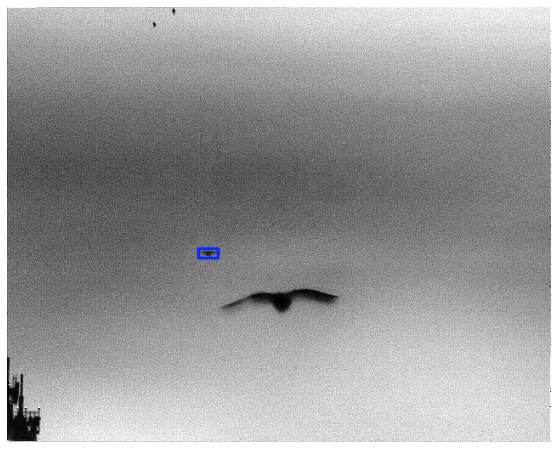

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res643', '14052021_(10)@ds-0023-aughor-inv.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(10)@ds-0044-inv.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res644


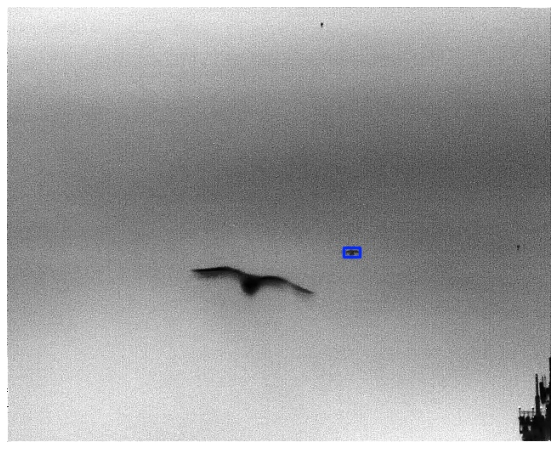

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res644', '14052021_(10)@ds-0044-inv.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(11)@ds-0911-aughor.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res645


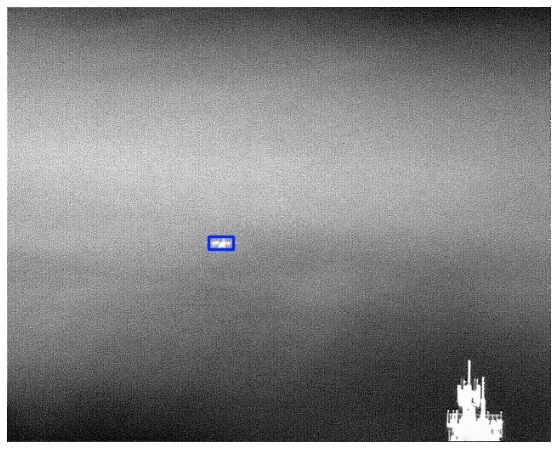

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res645', '14052021_(11)@ds-0911-aughor.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(9)@ds-0371.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res646


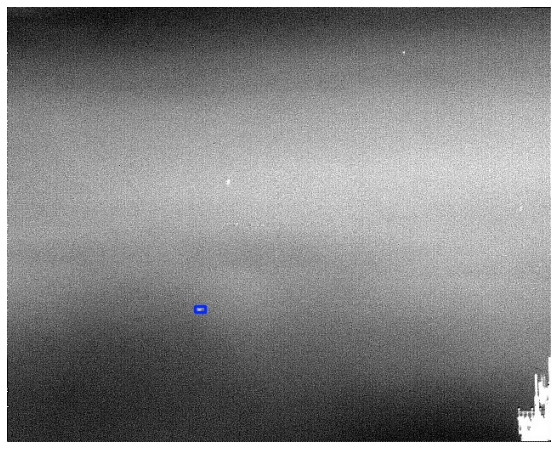

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res646', '14052021_(9)@ds-0371.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(t14)@ds-0135-aughor.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res647


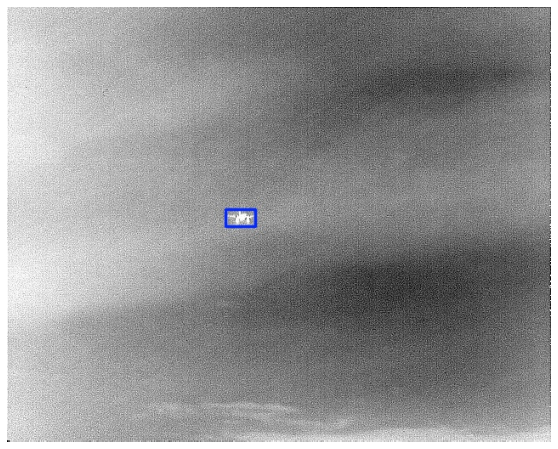

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res647', '14052021_(t14)@ds-0135-aughor.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(t17)@ds-0245-inv.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res648


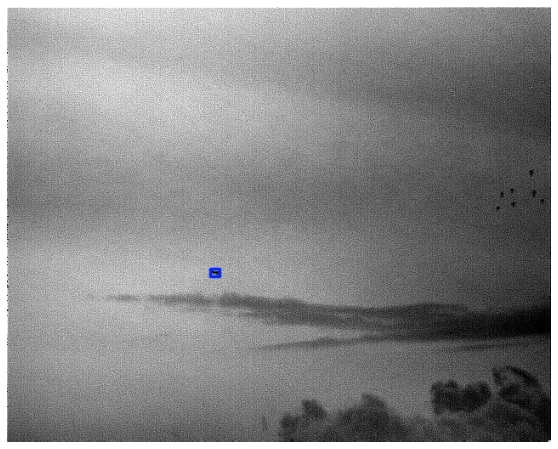

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res648', '14052021_(t17)@ds-0245-inv.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(plane_img_path, '14052021_(t18)@ds-0571.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res649


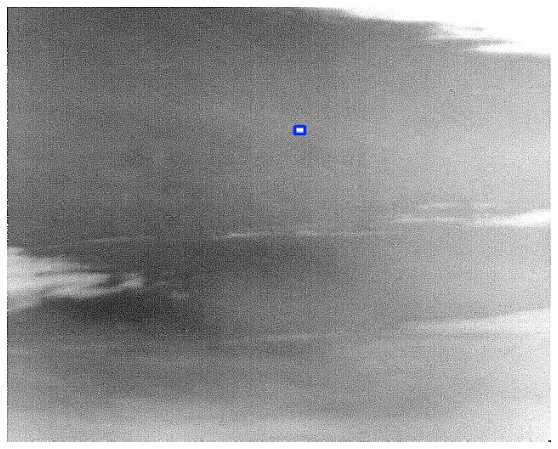

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res649', '14052021_(t18)@ds-0571.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(heli_img_path, '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0166.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res650


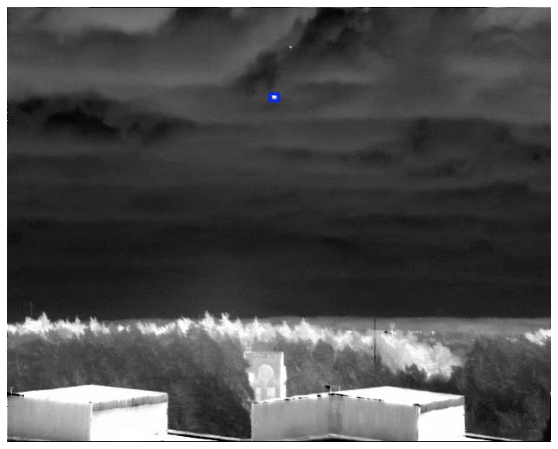

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res650', '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_30@ds-0166.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(heli_img_path, '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0211.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res651


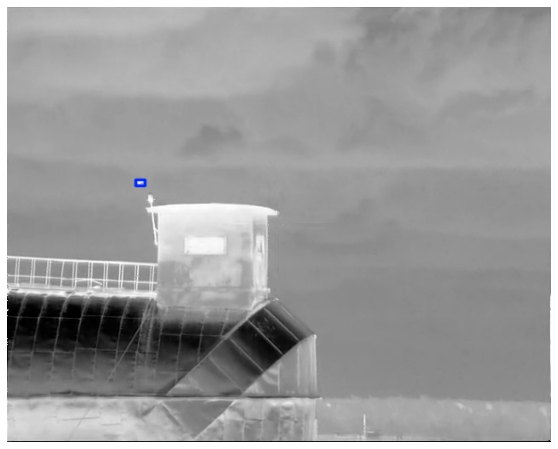

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res651', '27042021_óÑαΓ«½ÑΓ¡¿¿» 12_35@ds-0211.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
# test data
res = detector.predict(source = os.path.join(test_path, 'fd99ec0f6dc3e4a0832e.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res654


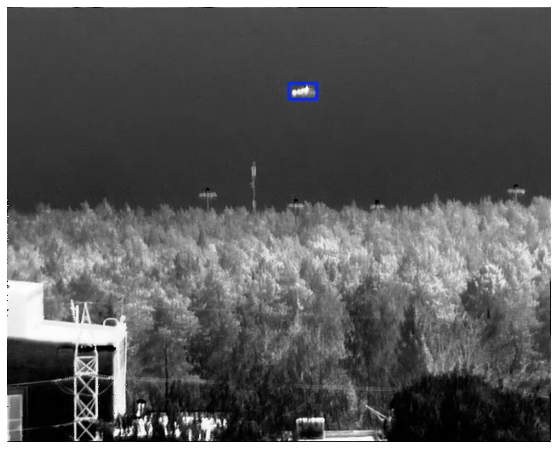

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res654', 'fd99ec0f6dc3e4a0832e.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(test_path, '1cf3bf1e519ccb432c8c.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res658


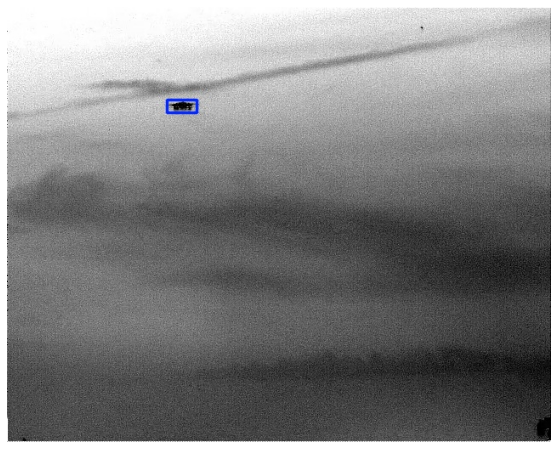

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res658', '1cf3bf1e519ccb432c8c.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(test_path, '2ababd0e795ddff8634b.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res659


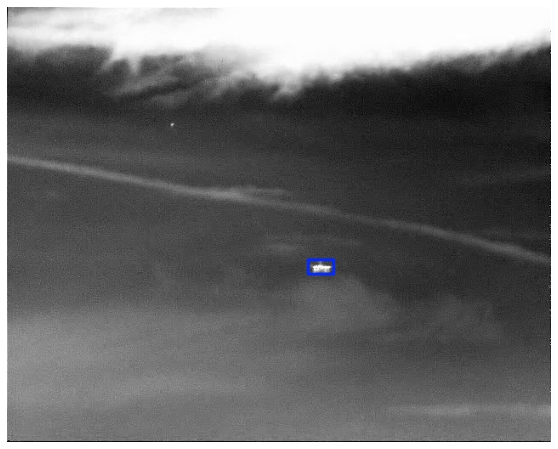

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res659', '2ababd0e795ddff8634b.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(test_path, 'cf4cbff3ce0dd993d569.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res660


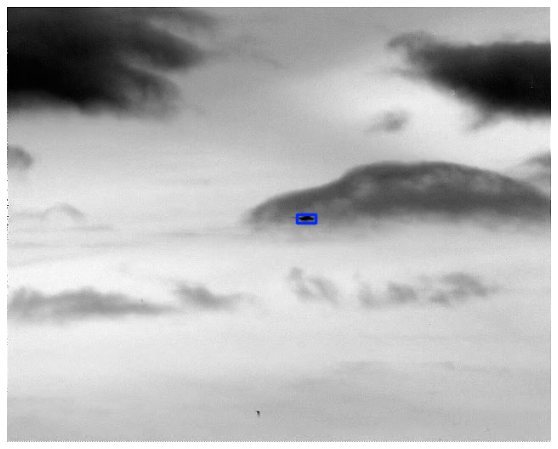

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res660', 'cf4cbff3ce0dd993d569.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(test_path, 'e95fc745a19641a47ccd.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res661


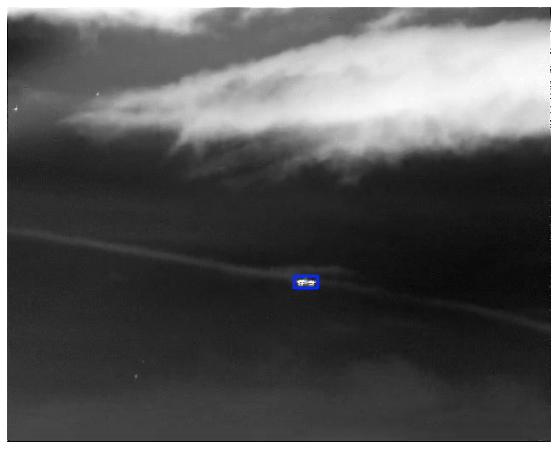

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res661', 'e95fc745a19641a47ccd.jpg'))
plt.axis('off')
plt.imshow(img);

In [ ]:
res = detector.predict(source = os.path.join(test_path, 'f7b9081e67c17344b6e0.jpg'),
                        show = False,
                        imgsz = 640,
                        show_boxes = True,
                        show_labels = False,
                        save = True,
                        name = "YOLO10_res",
                        conf = 0.3,
                        max_det = 2)

Results saved to runs\detect\YOLO10_res662


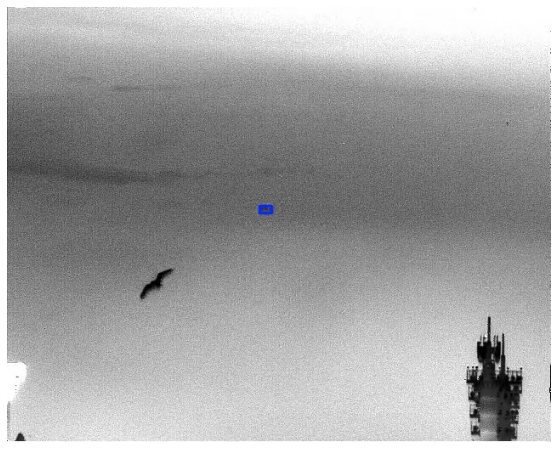

In [ ]:
plt.figure(figsize=(10,8))
img = plt.imread(os.path.join(os.curdir, 'runs', 'detect', 'YOLO10_res662', 'f7b9081e67c17344b6e0.jpg'))
plt.axis('off')
plt.imshow(img);